In [171]:
import numpy as np
import pandas as pd
import pickle
import joblib
import matplotlib.pyplot as plt
import random 
import pickle

from scipy.stats import pearsonr
from collections import defaultdict
import seaborn as sns
import datetime
import matplotlib.dates as mdates
import warnings
warnings.simplefilter("ignore")
%matplotlib inline

plt.style.use('seaborn-notebook')

import allfunctions as af
import readdata as rd
import MLR as mlr
import RF as rf
import LSTM as lstm
import Performance as per



# from importlib import reload
# reload(rd)

## Load Data

In [172]:
# open a file, where you stored the pickled data
# Goose creek dataset
file = open('FluxData_Raw_ALL.pickle', 'rb')

# dump information to that file
data_25m = pickle.load(file)

# close the file
file.close()
data_25m.tail()

,NewDate,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,TIMESTAMP,RECORD,Hs,tau,u_star,Ts_stdev,...,sonic_low_volt_f_Tot,sonic_trig_f_Tot,sonic_intrnl_hmdty_f_Tot,sonic_cal_err_f_Tot,board_temp_Avg,board_humidity_Avg,incline_pitch_Avg,incline_roll_Avg,Batt_Volt_Min,Solar_Batt_Min
254480,2023-07-26 06:15:00,NaN,NaN,NaN,NaN,8617.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9000.0,NaN,NaN,NaN,NaN,12.39,27.32
254481,2023-07-26 06:30:00,NaN,NaN,NaN,NaN,8618.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9000.0,NaN,NaN,NaN,NaN,12.39,28.43
254482,2023-07-26 06:45:00,NaN,NaN,NaN,NaN,8619.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9000.0,NaN,NaN,NaN,NaN,12.40,28.54
254483,2023-07-26 07:00:00,NaN,NaN,NaN,NaN,8620.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9000.0,NaN,NaN,NaN,NaN,12.40,28.49
254484,2023-07-26 07:00:00,NaN,NaN,NaN,NaN,8620.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,9000.0,NaN,NaN,NaN,NaN,12.40,28.49


In [173]:
Variables_GC = data_25m[['NewDate', 'T_tmpr_rh_mean', 'RH_tmpr_rh_mean', 'Precip_Tot', 'D5TE_T_5cm_Avg',
                 'SQ_110_Avg', 'Rn_Avg', 'rslt_wnd_spd', \
                     'amb_press_li_mean', 'D5TE_VWC_5cm_Avg','Fc_li_wpl']].iloc[:130400 ,:]
Variables_GC = Variables_GC.rename(columns={'NewDate': 'Time',\
                                                  'T_tmpr_rh_mean': 'Ta','RH_tmpr_rh_mean': 'RH','Precip_Tot': 'P',\
                                                 'D5TE_T_5cm_Avg': 'TS','SQ_110_Avg': 'PPFD','Rn_Avg': 'NETRAD',\
                                                  'rslt_wnd_spd': 'WS','amb_press_li_mean': 'Pa',\
                                                  'D5TE_VWC_5cm_Avg': 'SWC','Fc_li_wpl': 'Fc'})

Variables_GC['Time']=  pd.to_datetime(Variables_GC['Time'])
Variables_GC=Variables_GC.set_index('Time') 
Variables_GC

,Ta,RH,P,TS,PPFD,NETRAD,WS,Pa,SWC,Fc
Time,,,,,,,,,,
2016-04-22 10:15:00,15.39692,75.43023,0.0,14.41,1432.023000,550.724400,4.060431,98.65031,0.310,-0.041985
2016-04-22 10:30:00,15.75987,74.24434,0.0,14.54,1438.427000,566.569900,4.813497,98.67207,0.310,0.073770
2016-04-22 10:45:00,15.84722,74.90156,0.0,14.67,1534.165000,568.755900,5.350316,98.69296,0.311,0.063705
2016-04-22 11:00:00,16.14020,77.31715,0.0,14.80,1542.342000,631.690400,4.717422,98.71219,0.311,0.004838
2016-04-22 11:15:00,16.37151,78.72035,0.0,14.95,1747.418000,704.813500,4.942996,98.72832,0.311,0.081919
...,...,...,...,...,...,...,...,...,...,...
2020-01-10 17:00:00,12.97771,93.79735,0.0,8.31,1.689993,1.798199,6.469260,98.59911,0.327,0.072615
2020-01-10 17:15:00,12.91495,94.36881,0.0,8.30,0.000000,1.253099,6.603383,98.57616,0.327,0.061108
2020-01-10 17:30:00,12.85932,94.87874,0.0,8.31,0.000000,-1.881349,6.718990,98.54692,0.327,0.062635


In [174]:
Variables_GC['NETRAD'][(Variables_GC['NETRAD']<-200)]=np.NaN
Variables_GC['WS'][(Variables_GC['WS']>20)]=np.NaN
Variables_GC['Ta'][(Variables_GC['Ta']>60)]=np.NaN
Variables_GC['Pa'][(Variables_GC['Pa']<95)]=np.NaN
Variables_GC['SWC'][(Variables_GC['SWC']<0.1)]=np.NaN
Variables_GC['Fc'][(Variables_GC['Fc']>3)]=np.NaN
Variables_GC['Fc'][(Variables_GC['Fc']<-3)]=np.NaN

Variables_GC = Variables_GC.resample('H').mean()


In [175]:
# Unit conversion
# 1 mg CO2/(m^2s) = 1000 μg CO2/(m^2s)/44.01 μg/μmol = ~22.72 μmol CO2/(m^2s)

Variables_GC['Fc']=Variables_GC['Fc']* 22.72
Variables_GC['SWC']=Variables_GC['SWC']* 100 #convert to %

In [176]:
# replaced nan values with mean and median:
Variables_GC['Fc'] = Variables_GC['Fc'].fillna(Variables_GC['Fc'].mean())
Variables_GC['SWC'] = Variables_GC['SWC'].fillna(Variables_GC['SWC'].mean())
Variables_GC['Ta'] = Variables_GC['Ta'].fillna(Variables_GC['Ta'].mean())
Variables_GC['TS'] = Variables_GC['TS'].fillna(Variables_GC['TS'].mean())
Variables_GC['Pa'] = Variables_GC['Pa'].fillna(Variables_GC['Pa'].mean())
Variables_GC['WS'] = Variables_GC['WS'].fillna(Variables_GC['WS'].median())
Variables_GC['P'] = Variables_GC['P'].fillna(Variables_GC['P'].median())
Variables_GC['PPFD'] = Variables_GC['PPFD'].fillna(Variables_GC['PPFD'].median())
Variables_GC['NETRAD'] = Variables_GC['NETRAD'].fillna(Variables_GC['NETRAD'].median())
Variables_GC['RH'] = Variables_GC['RH'].fillna(Variables_GC['RH'].median())

Text(0.5, 1.0, 'CO2 flux')

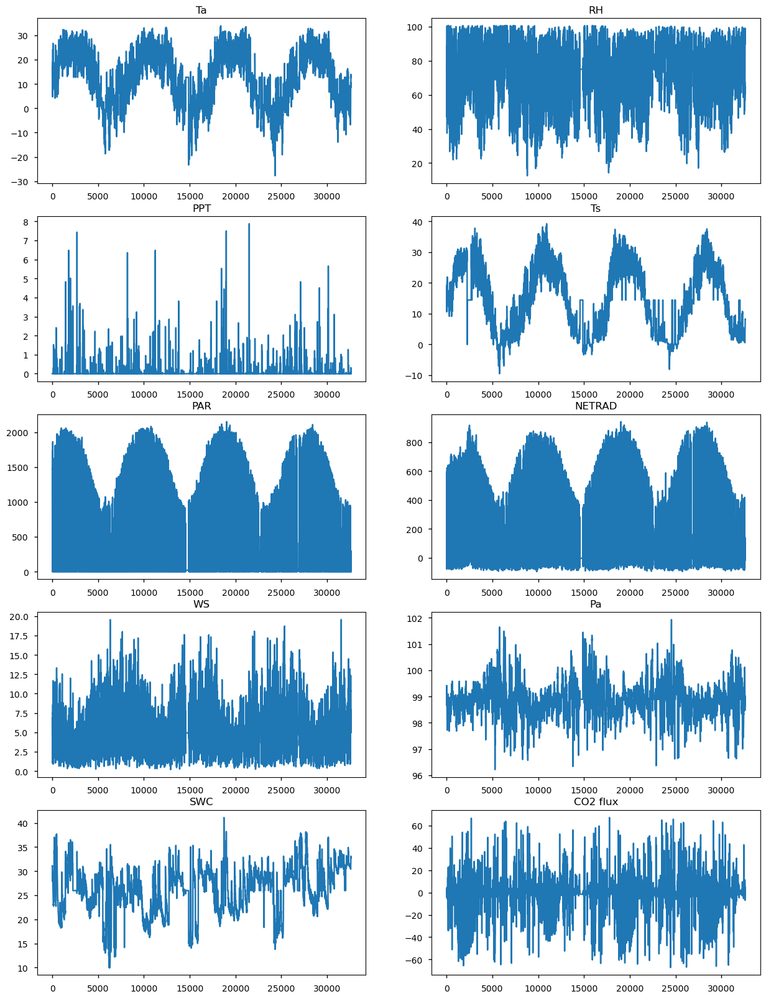

In [177]:
plt.figure(figsize=(15,20))

plt.subplot(521)
plt.plot(np.asfarray(Variables_GC['Ta'][:]))
plt.title('Ta')

plt.subplot(522)
plt.plot(np.asfarray(Variables_GC['RH'][:]))
plt.title('RH')

plt.subplot(523)
plt.plot(np.asfarray(Variables_GC['P'][:]))
plt.title('PPT')

plt.subplot(524)
plt.plot(np.asfarray(Variables_GC['TS'][:]))
plt.title('Ts')

plt.subplot(525)
plt.plot(np.asfarray(Variables_GC['PPFD'][:]))
plt.title('PAR')

plt.subplot(526)
plt.plot(np.asfarray(Variables_GC['NETRAD'][:]))
plt.title('NETRAD')

plt.subplot(527)
plt.plot(np.asfarray(Variables_GC['WS'][:]))
plt.title('WS')

plt.subplot(528)
plt.plot(np.asfarray(Variables_GC['Pa'][:]))
plt.title('Pa')

plt.subplot(529)
plt.plot(np.asfarray(Variables_GC['SWC'][:]))
plt.title('SWC')
plt.subplot(5,2,10)
plt.plot(np.asfarray(Variables_GC['Fc'][:]))
plt.title('CO2 flux')


In [178]:
d1='AMF_US-Ne1_BASE_HR_12-5.csv'
d2= 'AMF_US-Ne2_BASE_HR_12-5.csv'  
d3= 'AMF_US-Ne3_BASE_HR_12-5.csv'
d4= 'AMF_US-Br1_BASE_HH_1-1.csv'
d5= 'AMF_US-Br3_BASE_HH_1-1.csv'
frames, label = rd.readdata(d1,d2,d3,d4,d5)

Ne1
                        Ta    RH    P    TS  PPFD  NETRAD    WS     Pa   SWC  \
Time                                                                           
2010-01-01 00:00:00 -16.71  84.6  0.0 -1.88   0.0   -32.1  1.81  98.97  33.4   
2010-01-01 01:00:00 -16.49  87.0  0.0 -1.93   0.0    -8.8  1.59  98.96  33.4   
2010-01-01 02:00:00 -16.61  87.0  0.0 -1.97   0.0   -10.2  1.34  98.99  33.5   
2010-01-01 03:00:00 -16.09  86.1  0.0 -2.02   0.0    -7.9  1.87  99.05  33.4   
2010-01-01 04:00:00 -15.00  85.1  0.0 -2.07   0.0    -5.8  2.42  99.04  33.4   
...                    ...   ...  ...   ...   ...     ...   ...    ...   ...   
2021-12-31 19:00:00  -8.18  78.4  0.0 -2.20   0.0    -3.9  8.21  96.82  28.7   
2021-12-31 20:00:00  -9.10  76.7  0.0 -2.38   0.0    -3.0  8.05  96.97  28.3   
2021-12-31 21:00:00  -9.66  76.7  0.0 -2.55   0.0    -2.2  8.71  97.06  27.9   
2021-12-31 22:00:00 -10.85  76.8  0.0 -2.79   0.0    -0.9  9.22  97.18  27.3   
2021-12-31 23:00:00 -11.97  75.5  0.

In [179]:
frames[5] = Variables_GC

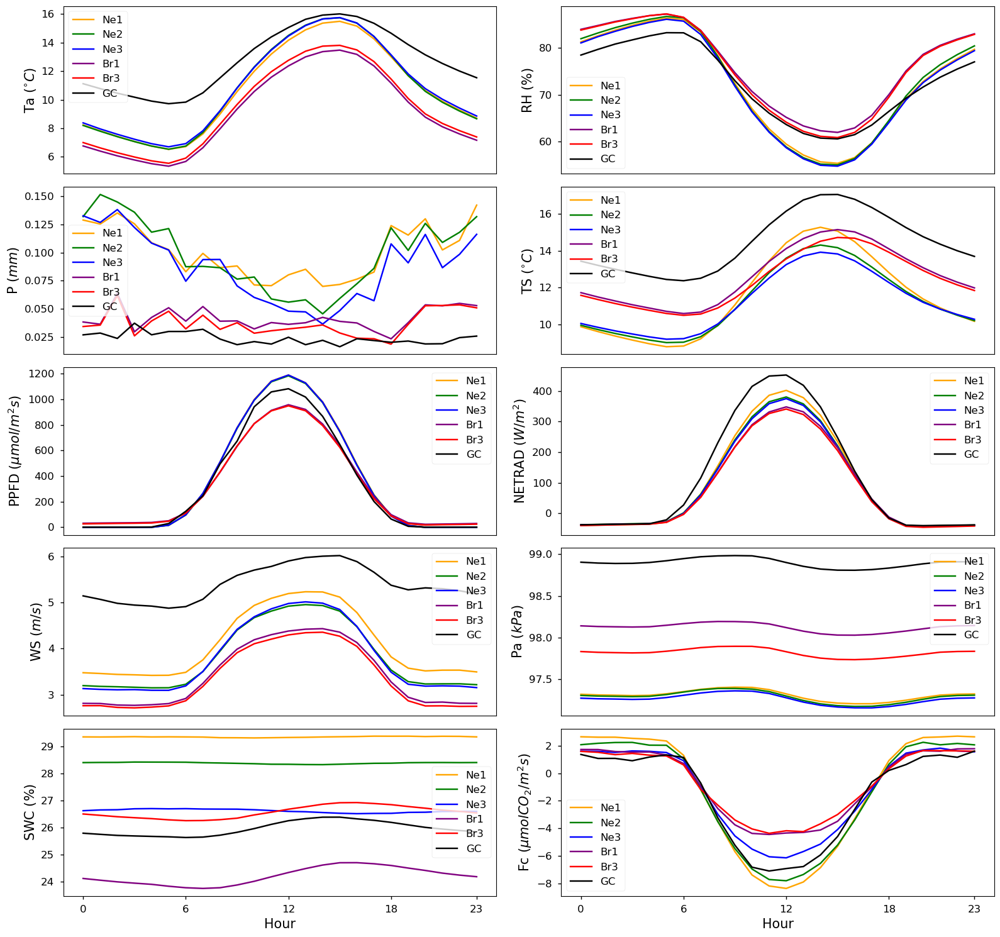

In [182]:
# Define the datasets and labels
datasets = ['Ne1', 'Ne2', 'Ne3', 'Br1', 'Br3','GC']
labels = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC', 'Fc']
labels_Unit = ['Ta ($^{\circ}C$)', 'RH ($\%$)', 'P ($mm$)', 'TS ($^{\circ}C$) ', 'PPFD ($\mu mol/m^2 s$)',\
               'NETRAD ($W/m^2$)', 'WS ($m/s$)', 'Pa ($kPa$)', 'SWC ($\%$)', 'Fc ($\mu molCO_2 /m^2 s$)']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site


fig, axs = plt.subplots(5, 2, figsize=(16, len(labels)*1.5))

# Reshape axs to 1-D for easier indexing
axs = axs.ravel()

# Loop over labels, excluding the last one
for i, label in enumerate(labels):
    for k in frames.keys():

        frame = frames[k]
        hour = frame.index.hour  # Group by hour instead of month
        hourly_cycle = frame.groupby(hour).mean()
        axs[i].plot(hourly_cycle[label],color=colors[k])
        axs[i].get_xaxis().set_visible(False)
        axs[i].set_ylabel(labels_Unit[i], fontsize=15)
        axs[i].tick_params(axis='both', which='major', labelsize=12)
        axs[i].legend(datasets, fontsize=12)
        axs[i].set_xticks([0, 6, 12, 18, 23])

axs[8].set_xlabel('Hour', fontsize=15)  # Set x-axis label to 'Hour'
axs[9].set_xlabel('Hour', fontsize=15)  # Set x-axis label to 'Hour'
axs[8].get_xaxis().set_visible(True)
axs[9].get_xaxis().set_visible(True)



plt.tight_layout()
plt.show()

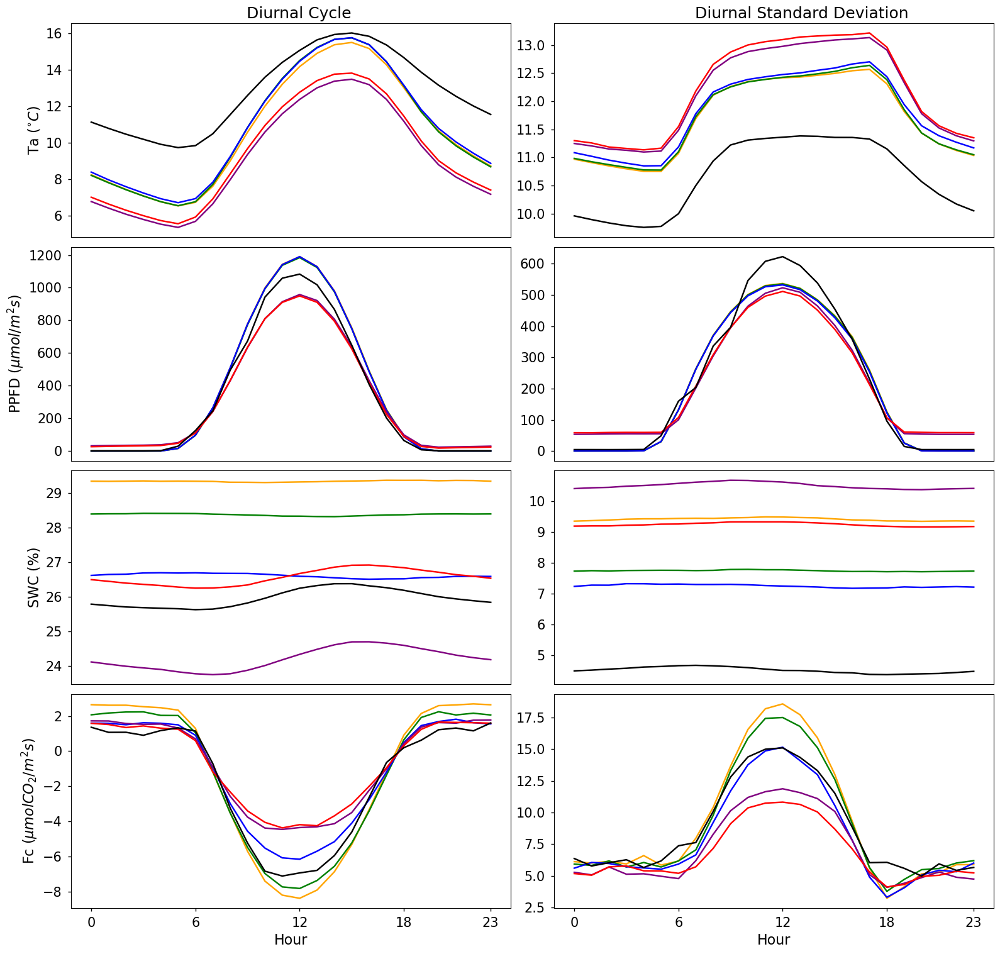

In [249]:
# Define the datasets and labels
datasets = ['Ne1', 'Ne2', 'Ne3', 'Br1', 'Br3','GC']
labels = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC', 'Fc']
labels_Unit = ['Ta ($^{\circ}C$)', 'RH ($\%$)', 'P ($mm$)', 'TS ($^{\circ}C$) ', 'PPFD ($\mu mol/m^2 s$)',\
               'NETRAD ($W/m^2$)', 'WS ($m/s$)', 'Pa ($kPa$)', 'SWC ($\%$)', 'Fc ($\mu molCO_2 /m^2 s$)']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site


# Filter for the 4 selected variables
selected_labels = ['Ta', 'PPFD', 'SWC', 'Fc']
selected_labels_unit = [unit for label, unit in zip(labels, labels_Unit) if label in selected_labels]

fig, axs = plt.subplots(4, 2, figsize=(16, 15))  # 4 rows for 4 selected variables, 2 columns (mean & std)

# Plot Diurnal Mean on Left Panel
for i, label in enumerate(selected_labels):
    for k in frames.keys():
        frame = frames[k]
        hour = frame.index.hour
        hourly_mean = frame.groupby(hour).mean()
        axs[i, 0].plot(hourly_mean[label], color=colors[k])
        axs[i,0].get_xaxis().set_visible(False)
        axs[i, 0].set_ylabel(selected_labels_unit[i], fontsize=16)
        axs[i, 0].tick_params(axis='both', which='major', labelsize=15)
        axs[i, 0].set_xticks([0, 6, 12, 18, 23])
        
    
# Add a title for the entire left panel
fig.text(0.3, 1, 'Diurnal Cycle', ha='center', va='center', fontsize=18)

# Plot Diurnal Standard Deviation on Right Panel
for i, label in enumerate(selected_labels):
    for k in frames.keys():
        frame = frames[k]
        hour = frame.index.hour
        hourly_std = frame.groupby(hour).std()
        axs[i, 1].plot(hourly_std[label], color=colors[k])
        axs[i,1].get_xaxis().set_visible(False)
        axs[i, 1].tick_params(axis='both', which='major', labelsize=15)
        axs[i, 1].set_xticks([0, 6, 12, 18, 23])

# Add a title for the entire right panel
fig.text(0.8, 1, 'Diurnal Standard Deviation', ha='center', va='center', fontsize=18)


# Make x-axis visible for the bottom plots
for ax in axs[-1, :]:
    ax.set_xlabel('Hour', fontsize=16)
    ax.get_xaxis().set_visible(True)
    
    

# Ensure there's enough space for the legend on the right
plt.subplots_adjust(right=0.85)
# axs[0,0].legend(datasets, fontsize=13, ncol=6, loc='center', bbox_to_anchor=(1.05, 1.1))


plt.tight_layout()
plt.show()


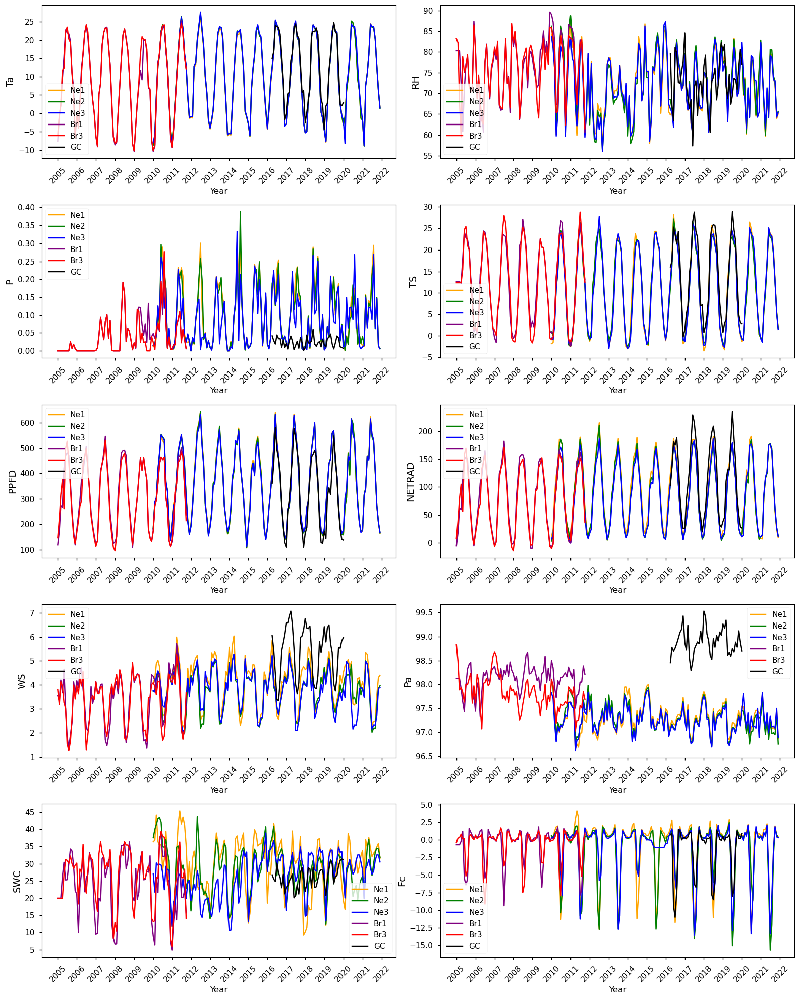

In [12]:

fig, axs = plt.subplots(5, 2, figsize=(16, len(labels)*2))

# Reshape axs to 1-D for easier indexing
axs = axs.ravel()

# Loop over labels, excluding the last one
for i, label in enumerate(labels):
    for j, color in zip(frames.keys(), colors):
        frame = frames[j]
        # Group by year and month, then calculate mean
        monthly_cycle = frame.groupby([frame.index.year, frame.index.month]).mean()
        dates = [datetime.datetime(year, month, 1) for year, month in monthly_cycle.index] 
        axs[i].plot(dates, monthly_cycle[label].values, color=color)

        # Set x-axis to only show the year
        axs[i].xaxis.set_major_locator(mdates.YearLocator())
        axs[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
        
        axs[i].set_xlabel('Year', fontsize=12)
        axs[i].set_ylabel(label, fontsize=14)
        axs[i].tick_params(axis='x',rotation=45)
        axs[i].tick_params(axis='both', which='major', labelsize=11)

        axs[i].legend(datasets, fontsize=11)

plt.tight_layout()
plt.show()

## Multiple linear regression: MLR

Ne1
Coefficients:  [-0.18296977 -0.03941857  0.02520962  0.15512483  0.08672467 -0.30693988
  0.07374423 -0.05581149  0.03685429]
Test Variance Score: 0.3709392992819216
error y-y_predic:  1.7461527630000546
varianceof prediction:  0.0019605135563327382
standard deviation of prediction:  0.04427768689004359


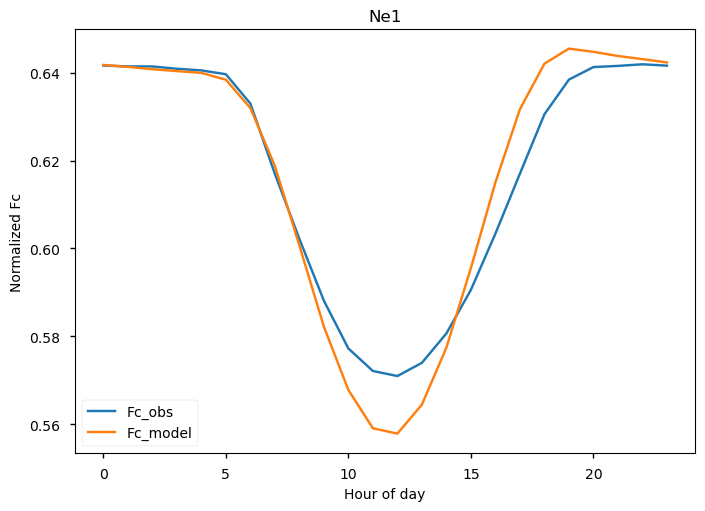

Ne2
Coefficients:  [-0.05730935 -0.01640088  0.0630902   0.04389864  0.1292605  -0.33045746
  0.06211415 -0.02730769  0.03346781]
Test Variance Score: 0.3648979553246192
error y-y_predic:  -1.870889619195907
varianceof prediction:  0.0013521396674235078
standard deviation of prediction:  0.03677145179923561


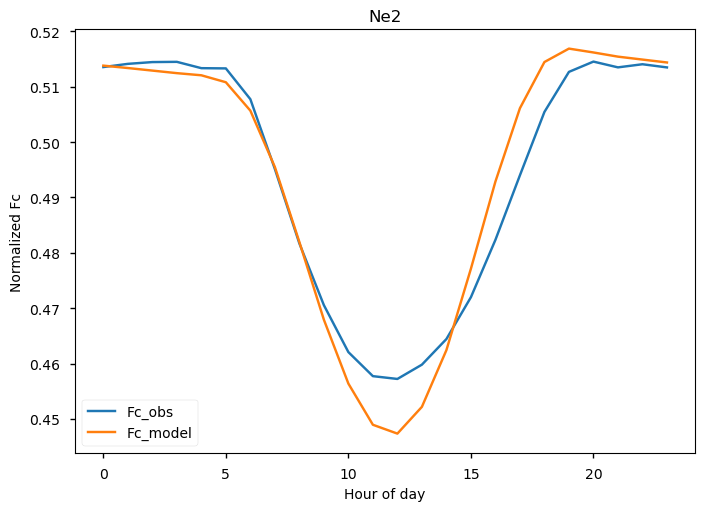

Ne3
Coefficients:  [-0.01377311 -0.0111486   0.11006268  0.00143378  0.16277827 -0.35544702
  0.05671906 -0.02719126  0.04095048]
Test Variance Score: 0.31685446135802386
error y-y_predic:  0.5037606043431495
varianceof prediction:  0.0012828871036134144
standard deviation of prediction:  0.03581741341321864


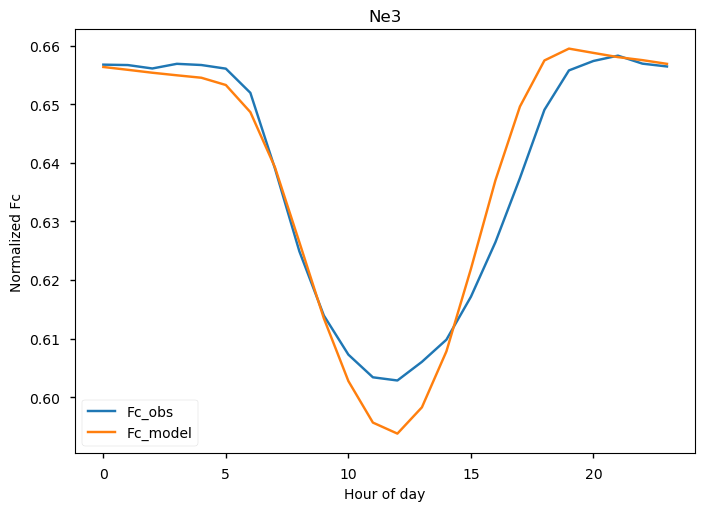

Br1
Coefficients:  [-0.01994087 -0.0344802  -0.06571611  0.00156734 -0.06588775 -0.09241908
  0.0759372  -0.00384425  0.02640379]
Test Variance Score: 0.21415565545148008
error y-y_predic:  -3.715769566820615
varianceof prediction:  0.0009781044855237042
standard deviation of prediction:  0.031274662036922224


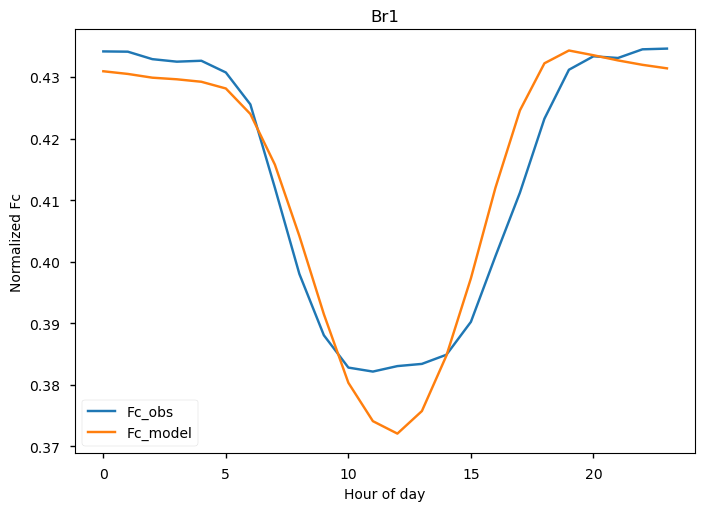

Br3
Coefficients:  [-0.02120753 -0.03593486 -0.04824213  0.00180139 -0.04290034 -0.10832464
  0.04751949 -0.01931946  0.02529886]
Test Variance Score: 0.21518848286110626
error y-y_predic:  -1.3382443006162354
varianceof prediction:  0.0008569707666109311
standard deviation of prediction:  0.029274063035576923


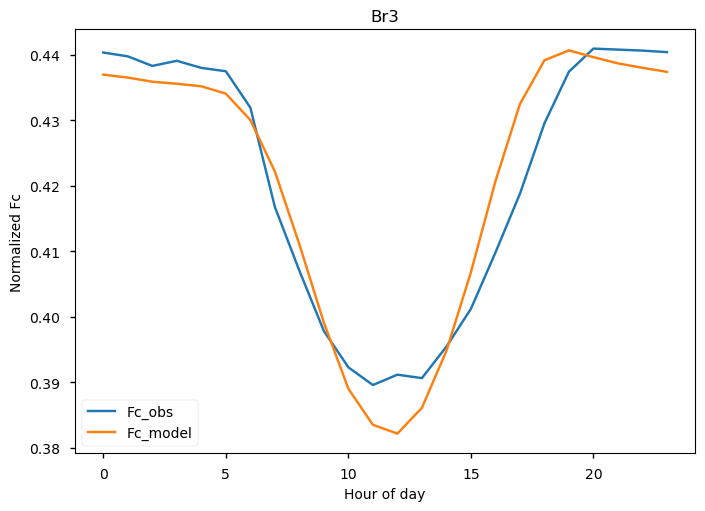

GC
Coefficients:  [ 0.00442408 -0.03834188 -0.01237525 -0.02910282 -0.06435611 -0.0934916
  0.05475379 -0.00085296  0.00244487]
Test Variance Score: 0.2770253470572027
error y-y_predic:  -3.7018450051825305
varianceof prediction:  0.0013336907019168608
standard deviation of prediction:  0.03651973031002366


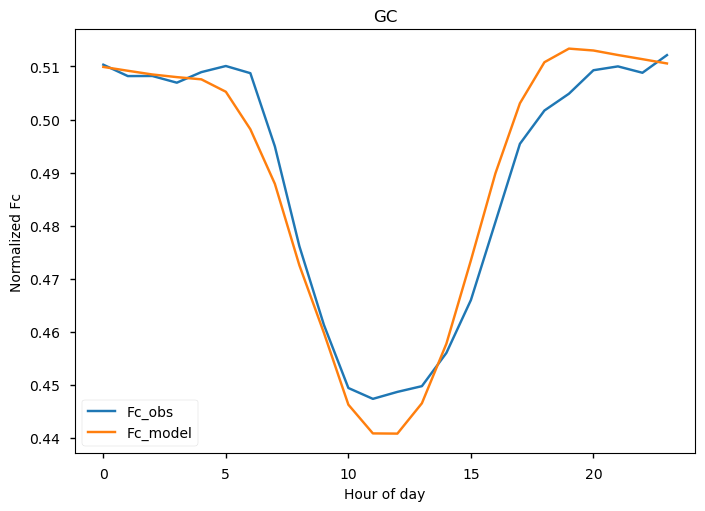

In [13]:
# from importlib import reload
# reload(mlr)
#local
X_l_mlr, fig= mlr.MLR_l(frames,'MinMax')

Coefficients:  [[-0.40505402 -0.09827063 -0.02223501  0.38711845 -0.36011752  0.20472623
   0.10361762 -0.19644214 -0.13056238]]
Test Variance Score: 0.3017414424661625
error y-y_predic:  Fc   -17.376768
dtype: float64
varianceof prediction:  0.0037454675220656088
standard deviation of prediction:  0.06120022485306413


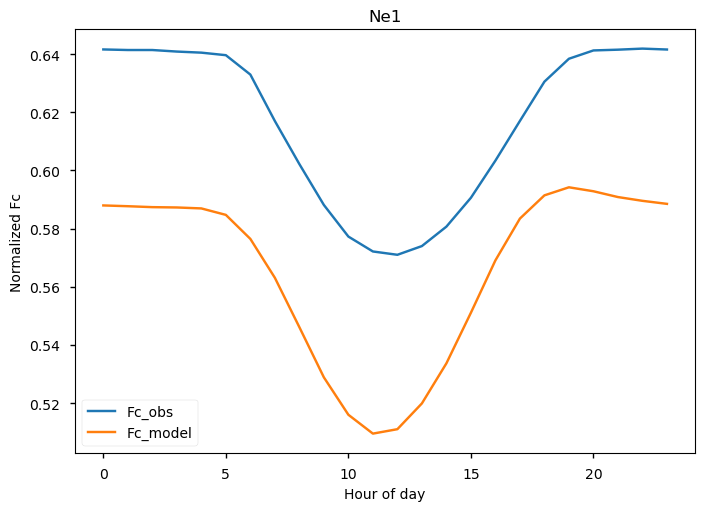

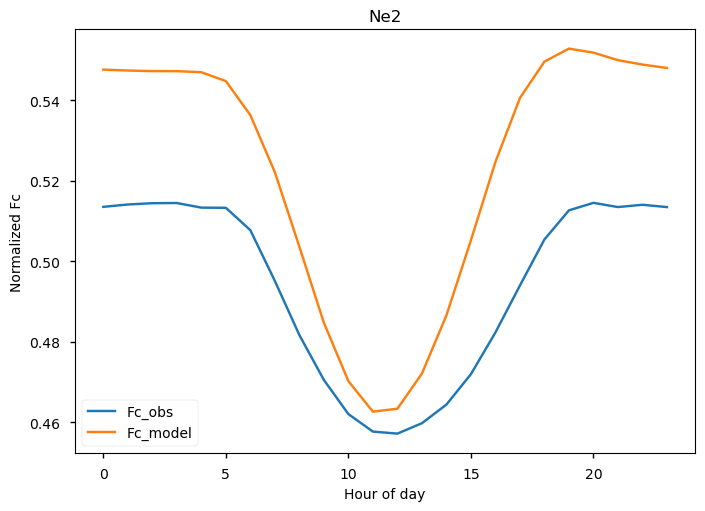

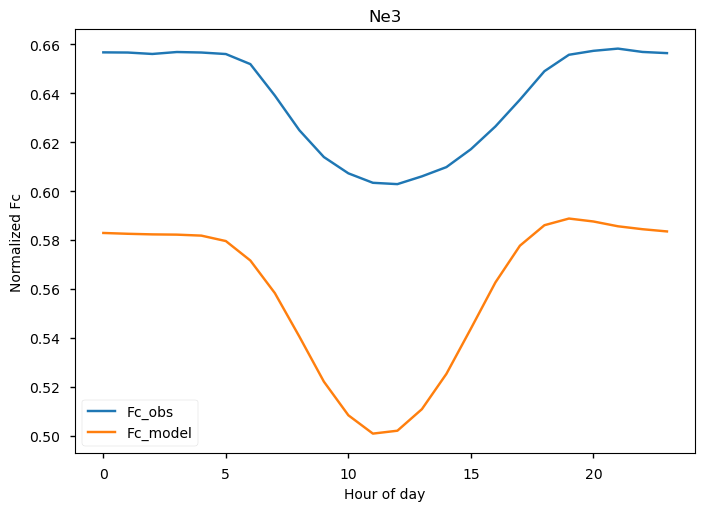

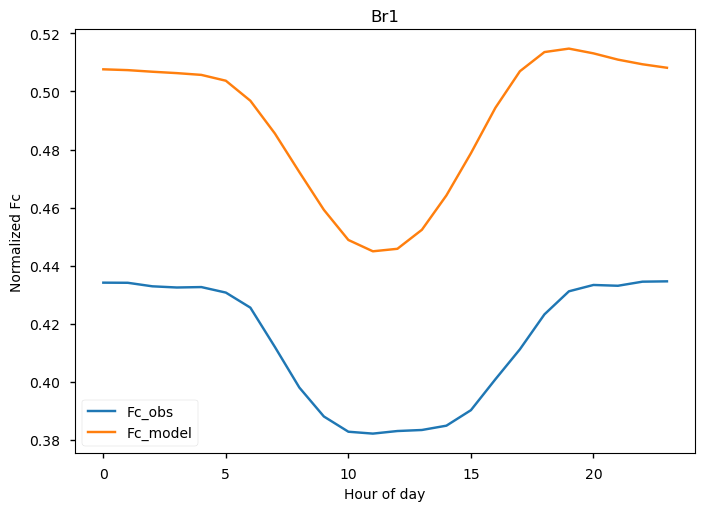

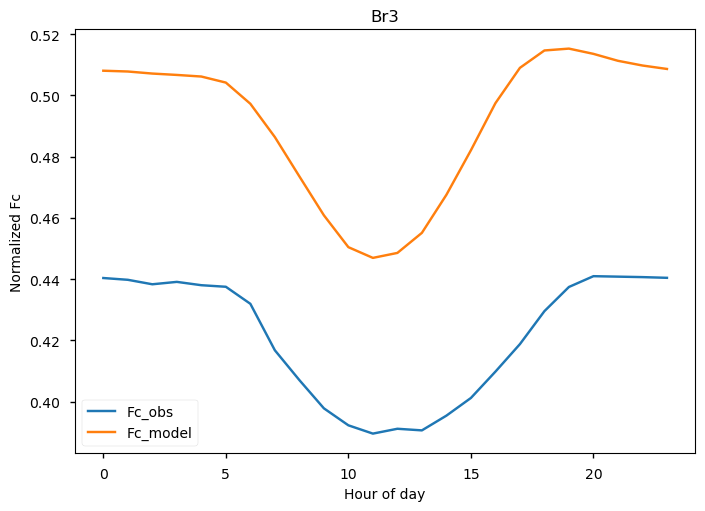

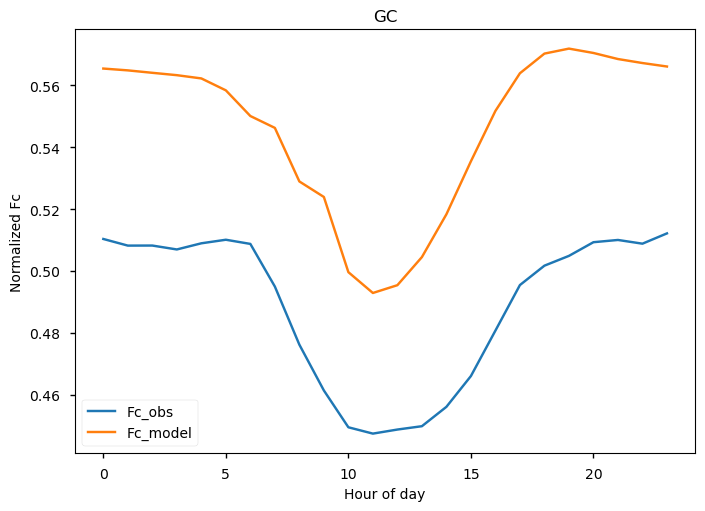

In [14]:
X_r_mlr, fig= mlr.MLR_r(frames,'MinMax')

## Random Forest: RF

Ne1
R-squared: 0.9656593280209746
Mean Absolute Error: 0.017203737016689393
Mean Squared Error: 0.0012571283845852618
Root Mean Squared Error: 0.03545600632594232




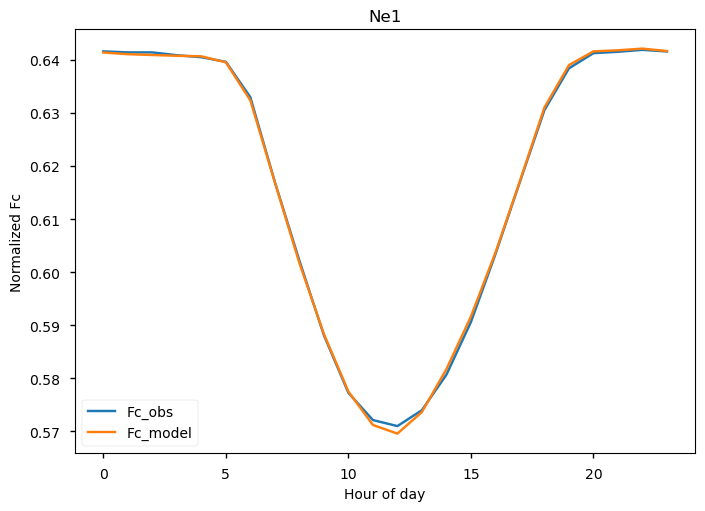

Ne2
R-squared: 0.9608870760502816
Mean Absolute Error: 0.015319842882128473
Mean Squared Error: 0.0010288864318579994
Root Mean Squared Error: 0.03207625963010649




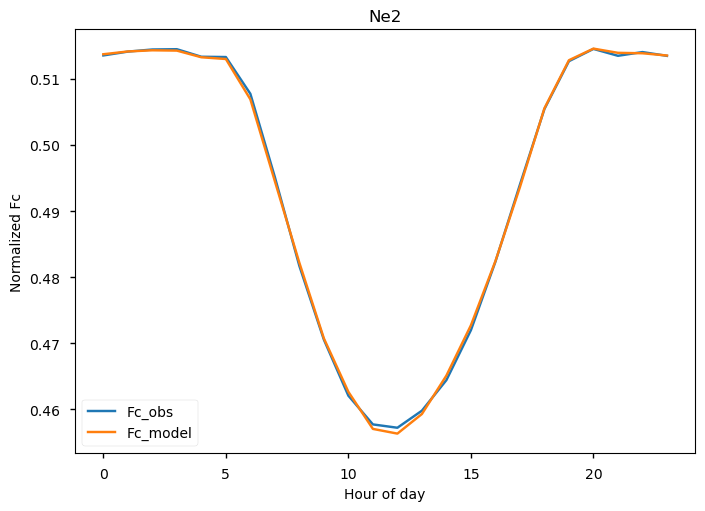

Ne3
R-squared: 0.9564539764619808
Mean Absolute Error: 0.016669755343797152
Mean Squared Error: 0.0013242736605376007
Root Mean Squared Error: 0.036390571038905126




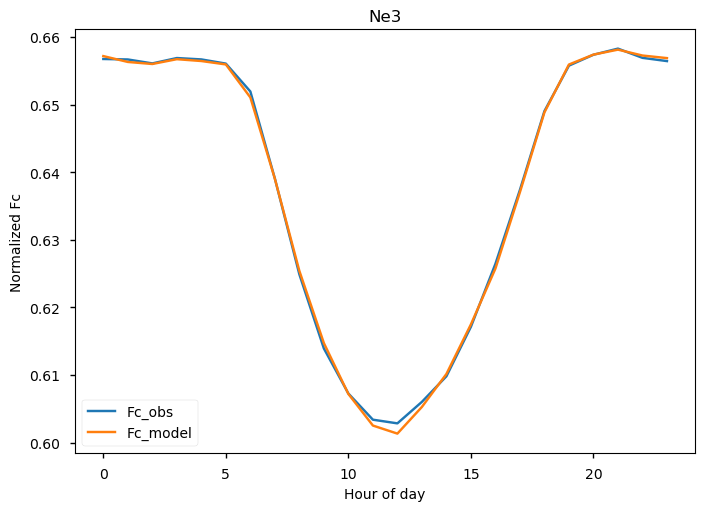

Br1
R-squared: 0.9438667756834179
Mean Absolute Error: 0.01795495226268182
Mean Squared Error: 0.0017014144032920944
Root Mean Squared Error: 0.04124820484932762




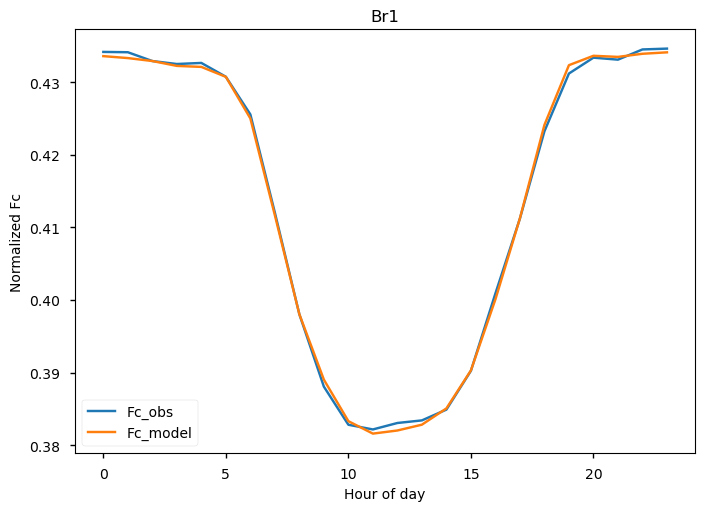

Br3
R-squared: 0.9358242232057735
Mean Absolute Error: 0.018489466074288727
Mean Squared Error: 0.0018516711173205207
Root Mean Squared Error: 0.04303104829446432




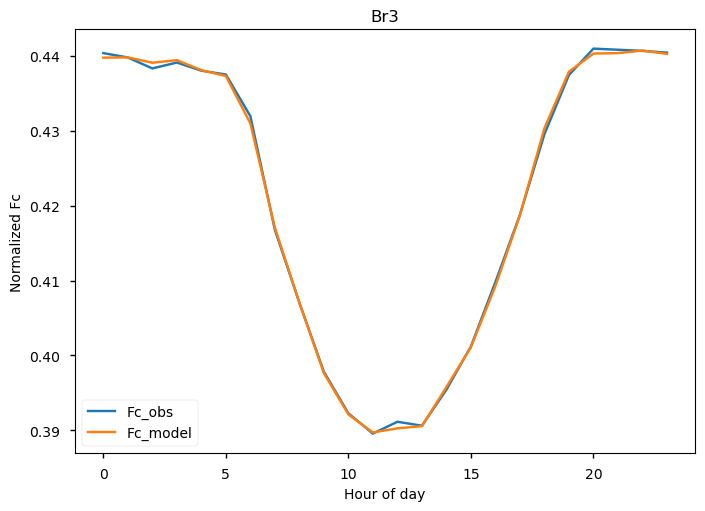

GC
R-squared: 0.935959331232959
Mean Absolute Error: 0.021777156658577306
Mean Squared Error: 0.00247583996437575
Root Mean Squared Error: 0.0497578130988064




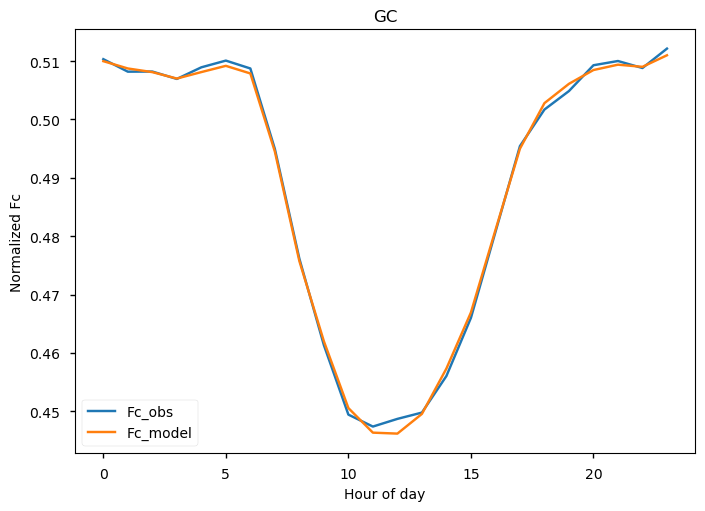

In [15]:
# from importlib import reload
# reload(rf)
#local
X_l_rf, fig= rf.RF_l(frames,'MinMax')

R-squared: 0.9674718669411515
Mean Absolute Error: 0.03249127564086362
Mean Squared Error: 0.002821931426654398
Root Mean Squared Error: 0.05312185451068513




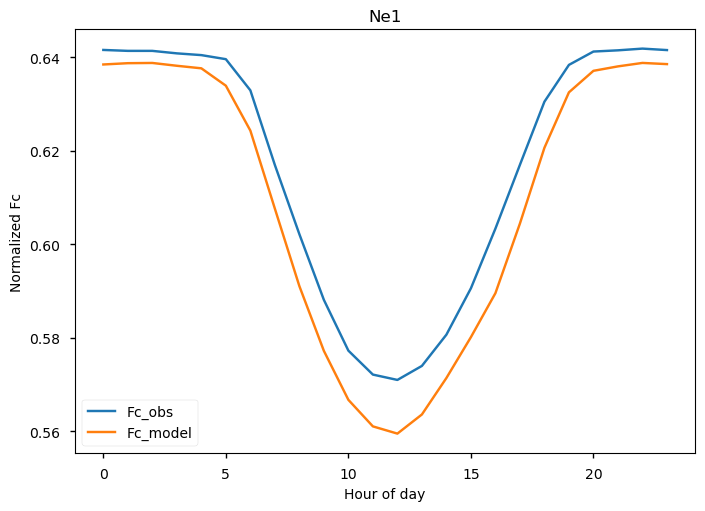

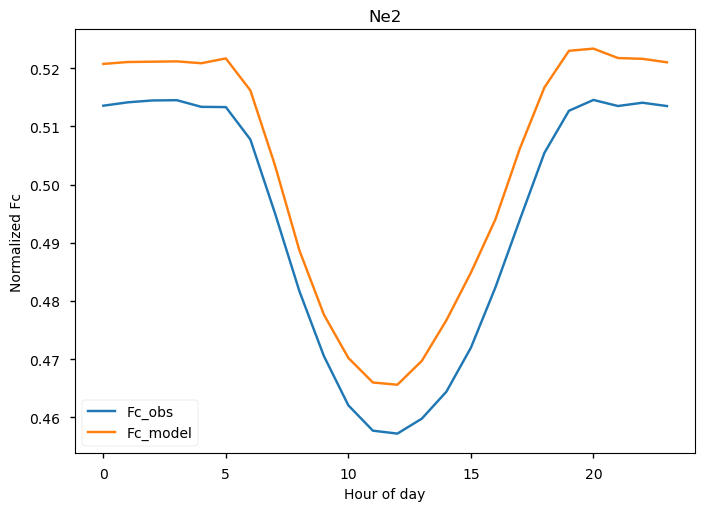

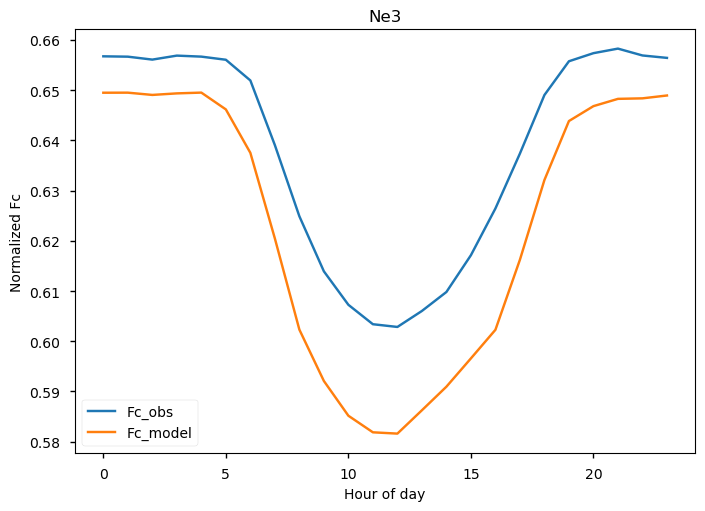

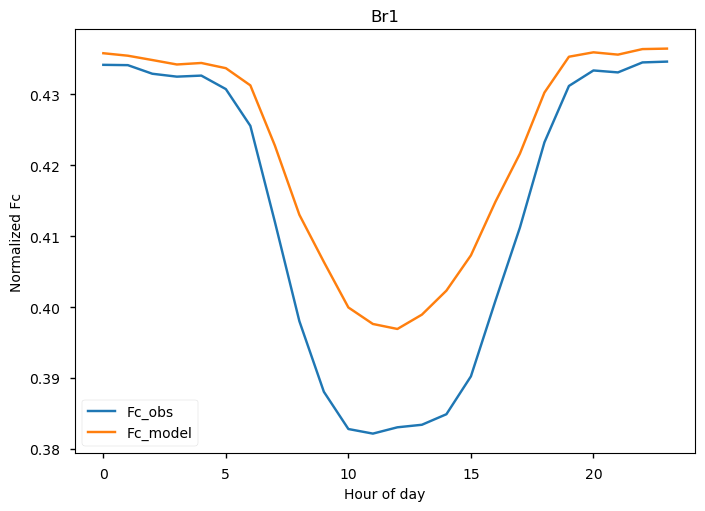

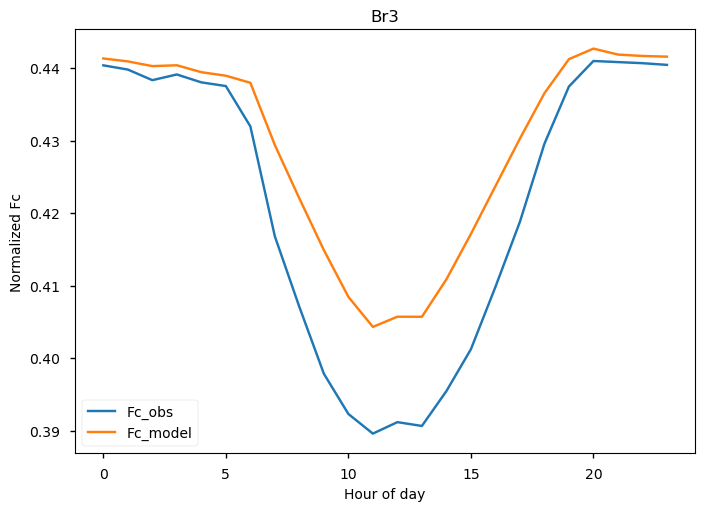

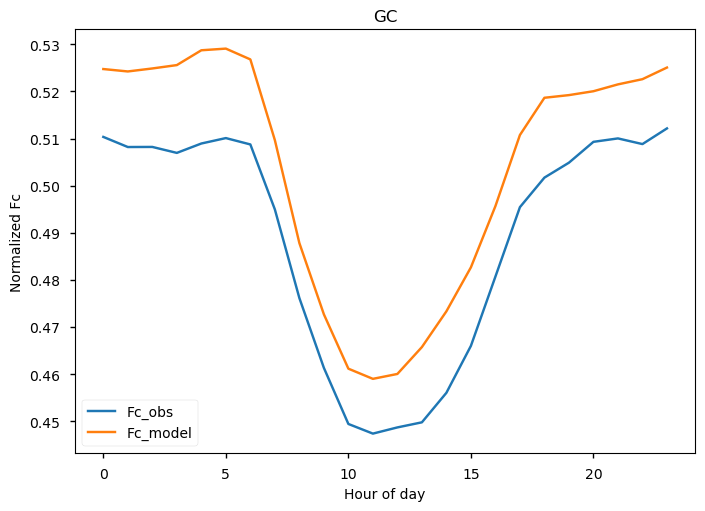

In [16]:
# Regional
X_r_rf, fig= rf.RF_r(frames,'MinMax')

## Long short-term memory: LSTM

In [63]:
from importlib import reload
reload(lstm)

<module 'LSTM' from "C:\\Users\\askarzam\\OneDrive - The University of Colorado Denver\\Mozghan_share - Goodwell, Allison's files\\Theme2\\code\\Python\\LSTM.py">

Ne1


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.012220865986617153
Test loss: 0.0032235719565196557

------------------------------

Epoch 1
--------
Train loss: 0.002687827335143488
Test loss: 0.0023658152632905463

------------------------------

Epoch 2
--------
Train loss: 0.0022039987003760566
Test loss: 0.002057690180928601

------------------------------

Epoch 3
--------
Train loss: 0.0019814241709860247
Test loss: 0.001912206542387846

------------------------------

Epoch 4
--------
Train loss: 0.001877493653713221
Test loss: 0.0018287669016078477

------------------------------

Epoch 5
--------
Train loss: 0.0018216414304737959
Test loss: 0.001779038192768419

------------------------------

Epoch 6
--------
Train loss: 0.0017745795856980193
Test loss: 0.0017395820346121724

------------------------------

Epoch 7
--------
Train loss: 0.0017318736154265935
Test loss: 0.0016780616819240183

------------------------------

Epoch 8
--------
Train loss: 0.0016777814186449784
Test loss: 0.00166

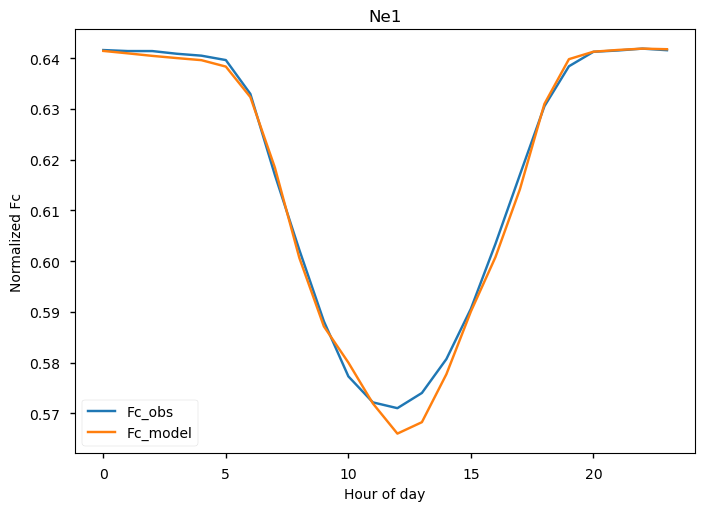

Ne2


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.018768691152217798
Test loss: 0.0024212070374074676

------------------------------

Epoch 1
--------
Train loss: 0.0020700386836930798
Test loss: 0.001821118573326361

------------------------------

Epoch 2
--------
Train loss: 0.0017300902307195226
Test loss: 0.001631413560043945

------------------------------

Epoch 3
--------
Train loss: 0.0016056428956087781
Test loss: 0.0015358460151782705

------------------------------

Epoch 4
--------
Train loss: 0.001521247528216918
Test loss: 0.0014785678575554417

------------------------------

Epoch 5
--------
Train loss: 0.0014684580370764404
Test loss: 0.0014563906195041863

------------------------------

Epoch 6
--------
Train loss: 0.0014302259927111056
Test loss: 0.0014063589178734584

------------------------------

Epoch 7
--------
Train loss: 0.001396465090591745
Test loss: 0.0013773930763358228

------------------------------

Epoch 8
--------
Train loss: 0.0013678054282435267
Test loss: 0.0013

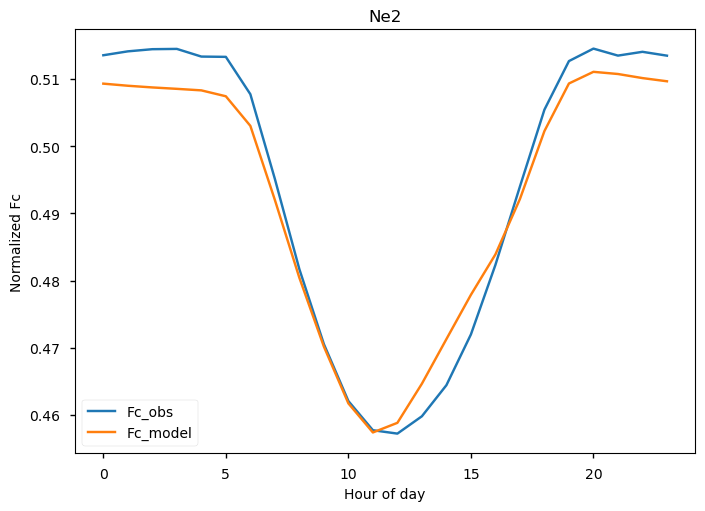

Ne3


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.008695245026400598
Test loss: 0.0028100034838489554

------------------------------

Epoch 1
--------
Train loss: 0.0023199642770729647
Test loss: 0.002114797384772254

------------------------------

Epoch 2
--------
Train loss: 0.0020058995736083793
Test loss: 0.0020173233132507757

------------------------------

Epoch 3
--------
Train loss: 0.0019526440585953726
Test loss: 0.0019764742382277966

------------------------------

Epoch 4
--------
Train loss: 0.001916786830204526
Test loss: 0.0019408868944370433

------------------------------

Epoch 5
--------
Train loss: 0.0018819886825238224
Test loss: 0.0019573108392092683

------------------------------

Epoch 6
--------
Train loss: 0.0018487077106530908
Test loss: 0.0018953972294368604

------------------------------

Epoch 7
--------
Train loss: 0.0018162108359926303
Test loss: 0.0018886122220998953

------------------------------

Epoch 8
--------
Train loss: 0.0017979769913330933
Test loss: 0.00

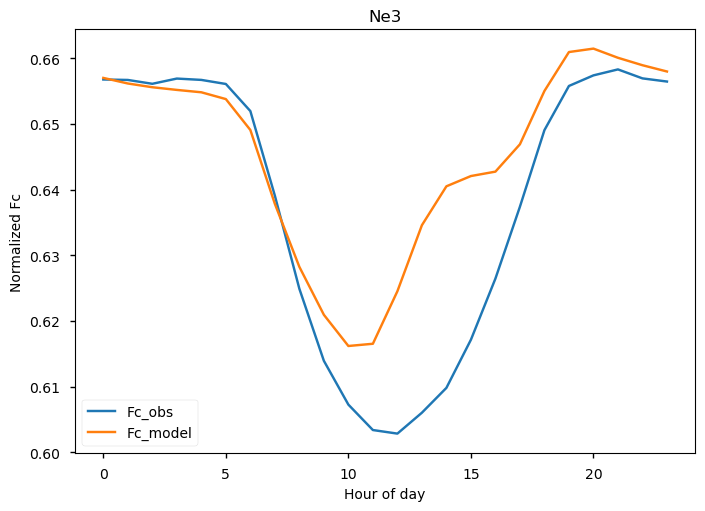

Br1


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.006429145262411955
Test loss: 0.0040206346505632

------------------------------

Epoch 1
--------
Train loss: 0.003574119173075504
Test loss: 0.0032702628258906357

------------------------------

Epoch 2
--------
Train loss: 0.0030663267087486642
Test loss: 0.002767574342615004

------------------------------

Epoch 3
--------
Train loss: 0.002593947561718978
Test loss: 0.0024626990722439496

------------------------------

Epoch 4
--------
Train loss: 0.0024694776327190237
Test loss: 0.0024148891935891186

------------------------------

Epoch 5
--------
Train loss: 0.0024270193215470944
Test loss: 0.0023817668086023513

------------------------------

Epoch 6
--------
Train loss: 0.002402465485984732
Test loss: 0.002352426981995979

------------------------------

Epoch 7
--------
Train loss: 0.0023658910199074166
Test loss: 0.002320701488399389

------------------------------

Epoch 8
--------
Train loss: 0.002337309365052866
Test loss: 0.0022822131

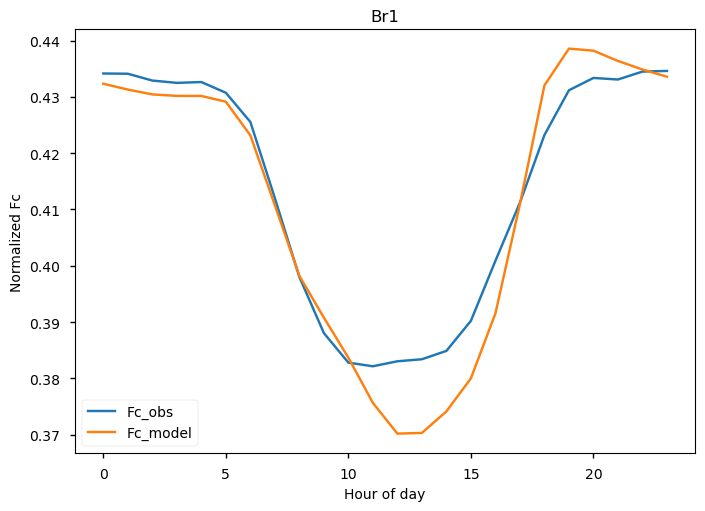

Br3


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.023386252672757908
Test loss: 0.004279407852573703

------------------------------

Epoch 1
--------
Train loss: 0.003550919285328014
Test loss: 0.003214477842132039

------------------------------

Epoch 2
--------
Train loss: 0.0032190117195657476
Test loss: 0.003054161869808503

------------------------------

Epoch 3
--------
Train loss: 0.0030948118734025827
Test loss: 0.0029218466572648455

------------------------------

Epoch 4
--------
Train loss: 0.002970042370867393
Test loss: 0.0027820982884430717

------------------------------

Epoch 5
--------
Train loss: 0.0028035168482058843
Test loss: 0.0025965655635355423

------------------------------

Epoch 6
--------
Train loss: 0.0026263170016690997
Test loss: 0.0024310760794484867

------------------------------

Epoch 7
--------
Train loss: 0.0024936815312773942
Test loss: 0.002300805142248406

------------------------------

Epoch 8
--------
Train loss: 0.0024127157045834946
Test loss: 0.002302

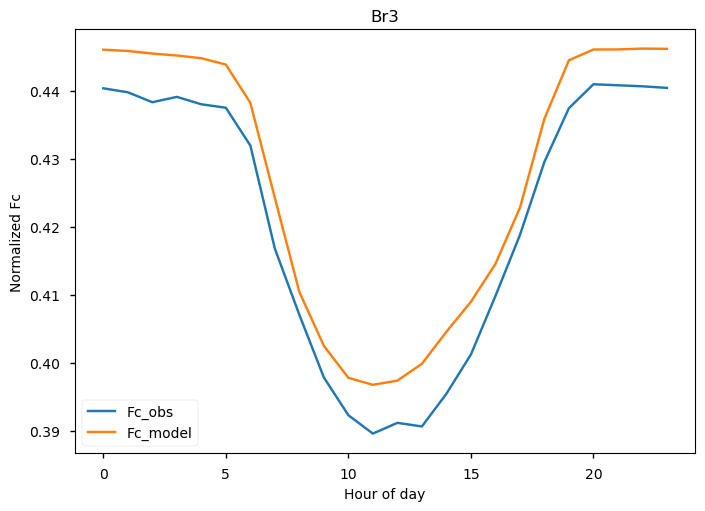

GC


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.08803037954650444
Test loss: 0.017392103282081618

------------------------------

Epoch 1
--------
Train loss: 0.010147178022700815
Test loss: 0.005845828507966422

------------------------------

Epoch 2
--------
Train loss: 0.00535962990011666
Test loss: 0.004614859211633539

------------------------------

Epoch 3
--------
Train loss: 0.004333886108491258
Test loss: 0.004088697610302018

------------------------------

Epoch 4
--------
Train loss: 0.00408534242318912
Test loss: 0.003936705351867653

------------------------------

Epoch 5
--------
Train loss: 0.003935723108962678
Test loss: 0.0038303200687680927

------------------------------

Epoch 6
--------
Train loss: 0.0038329813403061813
Test loss: 0.003770249082356111

------------------------------

Epoch 7
--------
Train loss: 0.00374908850127675
Test loss: 0.003675655640250483

------------------------------

Epoch 8
--------
Train loss: 0.0036780608651441568
Test loss: 0.00364890090165684

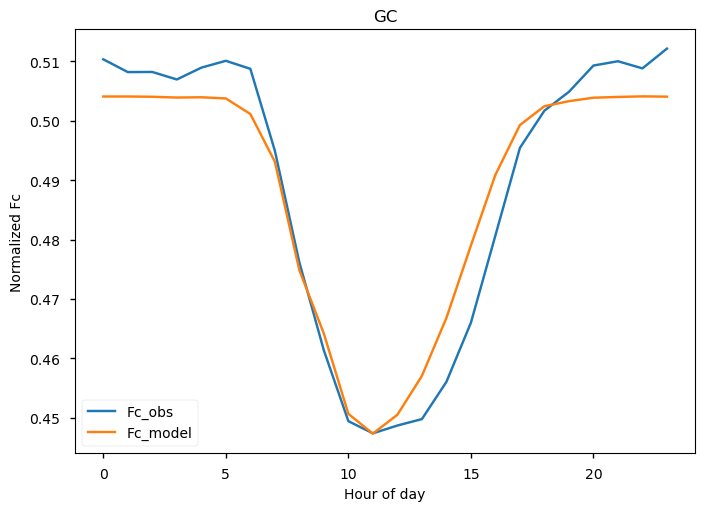

In [64]:
#local
X_l_lstm, fig= lstm.LSTM_l(frames,'MinMax')


  0%|          | 0/50 [00:00<?, ?it/s]


Epoch 0
--------
Train loss: 0.006440491359149539
Test loss: 0.004056752745763364

------------------------------

Epoch 1
--------
Train loss: 0.0037048785294354803
Test loss: 0.003437171627342049

------------------------------

Epoch 2
--------
Train loss: 0.003292826364536003
Test loss: 0.003103570356148354

------------------------------

Epoch 3
--------
Train loss: 0.0030115329510895894
Test loss: 0.002873253624006739

------------------------------

Epoch 4
--------
Train loss: 0.002820226501225086
Test loss: 0.0027881283643073932

------------------------------

Epoch 5
--------
Train loss: 0.0027010059759807643
Test loss: 0.0027164631049253164

------------------------------

Epoch 6
--------
Train loss: 0.00260896398221849
Test loss: 0.002560631799916571

------------------------------

Epoch 7
--------
Train loss: 0.0025403256089167815
Test loss: 0.0025574036787069637

------------------------------

Epoch 8
--------
Train loss: 0.002487560840787227
Test loss: 0.0024608593

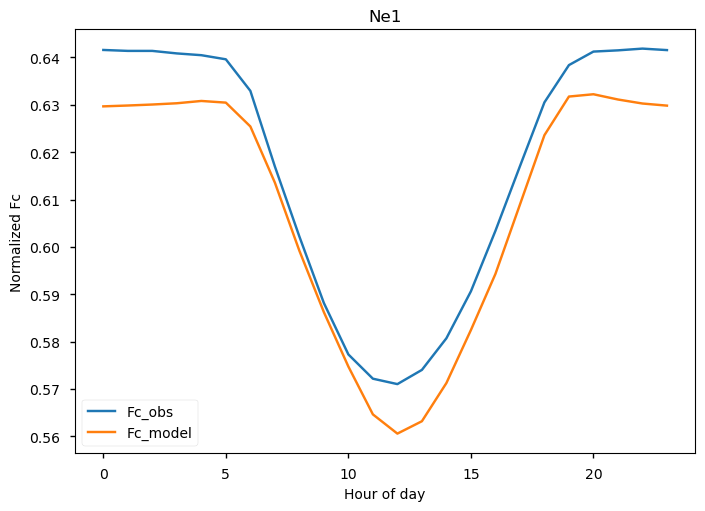

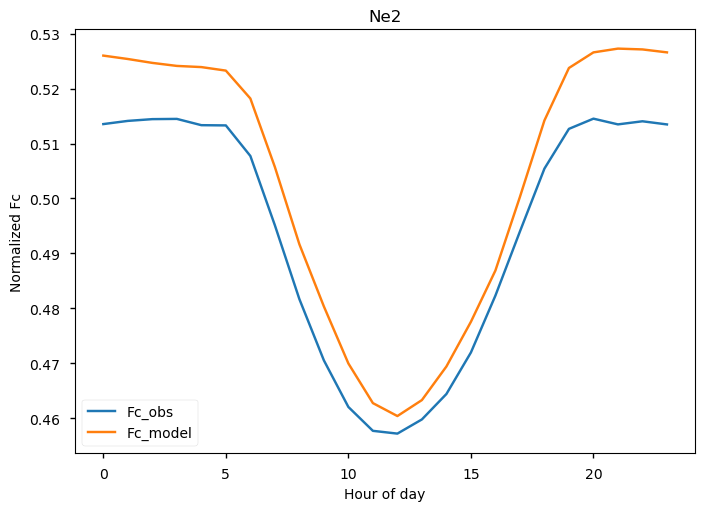

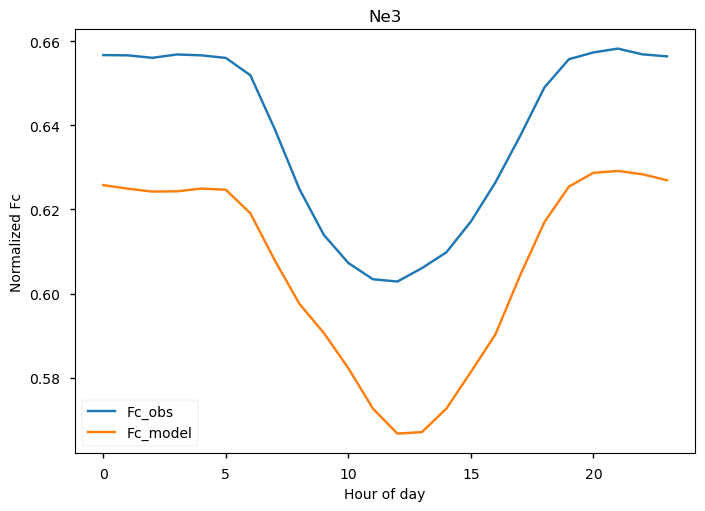

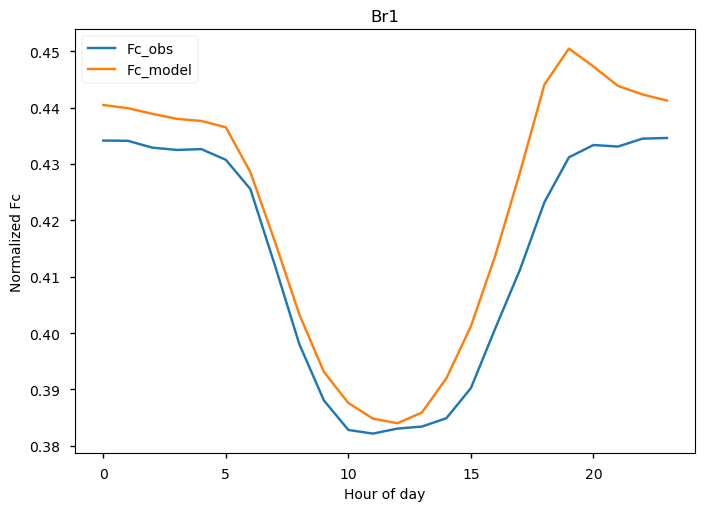

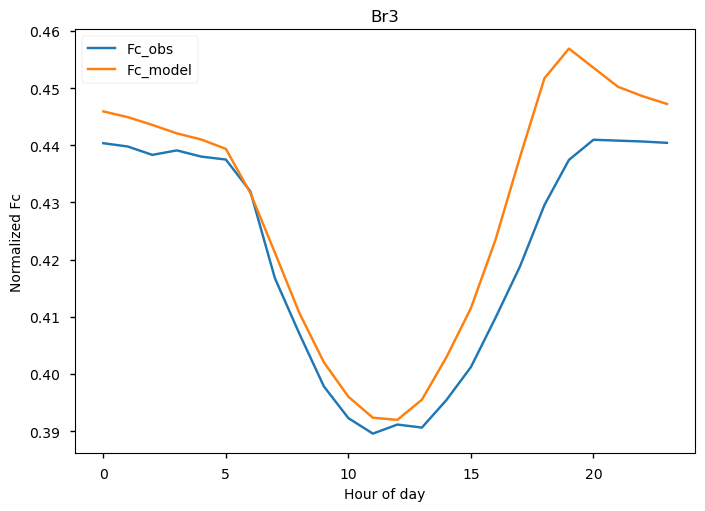

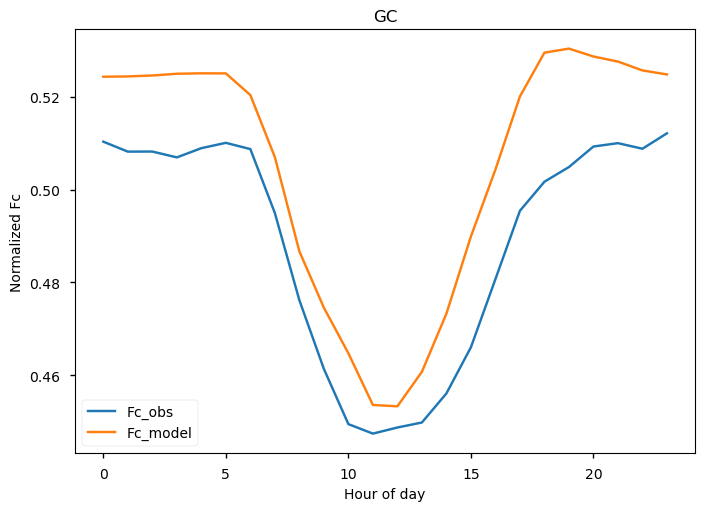

Ta        RH    P        TS      PPFD    NETRAD  \
  Time                                                                         
0 2010-01-01 00:00:00  0.221780  0.830583  0.0  0.262150  0.000000  0.095462   
  2010-01-01 01:00:00  0.224908  0.856986  0.0  0.261358  0.000000  0.120342   
  2010-01-01 02:00:00  0.223202  0.856986  0.0  0.260725  0.000000  0.118847   
  2010-01-01 03:00:00  0.230594  0.847085  0.0  0.259934  0.000000  0.121303   
  2010-01-01 04:00:00  0.246090  0.836084  0.0  0.259142  0.000000  0.123545   
...                         ...       ...  ...       ...       ...       ...   
5 2020-01-10 14:00:00  0.674766  0.890501  0.0  0.355767  0.079133  0.169099   
  2020-01-10 15:00:00  0.675828  0.878155  0.0  0.361557  0.034423  0.126574   
  2020-01-10 16:00:00  0.665250  0.905591  0.0  0.365044  0.011122  0.104109   
  2020-01-10 17:00:00  0.658599  0.932164  0.0  0.365096  0.000196  0.091023   
  2020-01-10 18:00:00  0.655912  0.948961  0.0  0.364993  0.000000  0.091822   

                             WS        Pa       SWC    Fc_obs  Fc_model  
  Time                                                                   
0 2010-01-01 00:00:00  0.107675  0.724928  0.457961  0.619509  0.625279  
  2010-01-01 01:00:00  0.095074  0.723496  0.457961  0.647085  0.626187  
  2010-01-01 02:00:00  0.080756  0.727794  0.459750  0.641762  0.625979  
  2010-01-01 03:00:00  0.111111  0.736390  0.457961  0.617136  0.626409  
  2010-01-01 04:00:00  0.142612  0.734957  0.457961  0.604951  0.627087  
...                         ...       ...       ...       ...       ...  
5 2020-01-10 14:00:00  0.244567  0.430905  0.736334  0.488919  0.495229  
  2020-01-10 15:00:00  0.399829  0.432117  0.733119  0.520146  0.499889  
  2020-01-10 16:00:00  0.361288  0.423040  0.729904  0.512423  0.499633  
  2020-01-10 17:00:00  0.325411  0.409128  0.729904  0.512909  0.498282  
  2020-01-10 18:00:00  0.346331  0.397501  0.729904  0.531872  0.497513  

[467877 rows x 11 columns]

In [65]:
# regional
X_r_lstm, fig= lstm.LSTM_r(frames,'MinMax')
X_r_lstm

In [66]:
# save predicted Fc to pickle file:

# MLR
with open('regional_prediction_MLR.pickle', 'wb') as f:
    pickle.dump(X_r_mlr, f)
with open('local_prediction_MLR.pickle', 'wb') as f:
    pickle.dump(X_l_mlr, f)
    
    
# RF  
with open('regional_prediction_RF.pickle', 'wb') as f:
    pickle.dump(X_r_rf, f)
with open('local_prediction_RF.pickle', 'wb') as f:
    pickle.dump(X_l_rf, f)

# LSTM
with open('regional_prediction_LSTM.pickle', 'wb') as f:
    pickle.dump(X_r_lstm, f)
with open('local_prediction_LSTM.pickle', 'wb') as f:
    pickle.dump(X_l_lstm, f)



## Start here

In [15]:
# Load predicted Fc from pickle file:

X_r_mlr = pd.read_pickle("regional_prediction_MLR.pickle")
X_r_rf = pd.read_pickle("regional_prediction_RF.pickle")
X_r_lstm = pd.read_pickle("regional_prediction_LSTM.pickle")

X_l_mlr = pd.read_pickle("local_prediction_MLR.pickle")
X_l_rf = pd.read_pickle("local_prediction_RF.pickle")
X_l_lstm = pd.read_pickle("local_prediction_LSTM.pickle")


In [16]:
X_r_mlr= {key: X_r_mlr.loc[key] for key in range(0,6)}
X_r_rf= {key: X_r_rf.loc[key] for key in range(0,6)}
X_r_lstm= {key: X_r_lstm.loc[key] for key in range(0,6)}

## Nash-Sutcliffe efficiency: NSE

In [18]:
def NSE_LR(X_l,X_r):
    
    nse=np.zeros([len(X_l.keys()),2]) # 0:local, 1: regional
    for i in range(len(X_l.keys())):
        model_output_l = per.NSE(np.array(X_l[i]['Fc_obs']), np.array(X_l[i]['Fc_model']))
        model_output_r = per.NSE(np.array(X_r[i]['Fc_obs']), np.array(X_r[i]['Fc_model']))

        nse[i][0] = model_output_l
        nse[i][1] = model_output_r
    return nse
    
nse_mlr= NSE_LR(X_l_mlr,X_r_mlr)
nse_rf= NSE_LR(X_l_rf,X_r_rf)
nse_lstm= NSE_LR(X_l_lstm,X_r_lstm)

NSE = pd.DataFrame({'NSE_mlr': nse_mlr.reshape(12,)}).\
join([pd.DataFrame({'NSE_rf': nse_rf.reshape(12,)}),\
      pd.DataFrame({'NSE_lstm': nse_lstm.reshape(12,)})])

## KLING-GUPTA  Efficiency Function: KGE

In [19]:
def KGE_LR(X_l,X_r):
    
    kge=np.zeros([len(X_l.keys()),2]) # 0:local, 1: regional
    corr=np.zeros([len(X_l.keys()),2]) # 0:local, 1: regional
    alpha=np.zeros([len(X_l.keys()),2]) # 0:local, 1: regional
    beta=np.zeros([len(X_l.keys()),2]) # 0:local, 1: regional
    for i in range(len(X_l.keys())):
        model_output_l, corr_l, alpha_l, beta_l = per.KGE(np.array(X_l[i]['Fc_obs']), np.array(X_l[i]['Fc_model']))
        model_output_r, corr_r, alpha_r, beta_r = per.KGE(np.array(X_r[i]['Fc_obs']), np.array(X_r[i]['Fc_model']))

        kge[i][0] = model_output_l
        kge[i][1] = model_output_r
        
        corr[i][0] = corr_l
        corr[i][1] = corr_r
        
        alpha[i][0] = alpha_l
        alpha[i][1] = alpha_r
        
        beta[i][0] = beta_l
        beta[i][1] = beta_r
        
    return kge, corr, alpha, beta
    
kge_mlr, corr_mlr, alpha_mlr, beta_mlr= KGE_LR(X_l_mlr,X_r_mlr)
kge_rf, corr_rf, alpha_rf, beta_rf= KGE_LR(X_l_rf,X_r_rf)
kge_lstm, corr_lstm, alpha_lstm, beta_lstm= KGE_LR(X_l_lstm,X_r_lstm)

KGE = pd.DataFrame({'KGE_mlr': kge_mlr.reshape(12,)}).\
join([pd.DataFrame({'KGE_rf': kge_rf.reshape(12,)}),\
      pd.DataFrame({'KGE_lstm': kge_lstm.reshape(12,)})])

Corr = pd.DataFrame({'r_mlr': corr_mlr.reshape(12,)}).\
join([pd.DataFrame({'r_rf': corr_rf.reshape(12,)}),\
      pd.DataFrame({'r_lstm': corr_lstm.reshape(12,)})])

Alpha = pd.DataFrame({r'$\alpha$_mlr': alpha_mlr.reshape(12,)}).\
join([pd.DataFrame({r'$\alpha$_rf': alpha_rf.reshape(12,)}),\
      pd.DataFrame({r'$\alpha$_lstm': alpha_lstm.reshape(12,)})])

Beta = pd.DataFrame({r'$\beta$_mlr': beta_mlr.reshape(12,)}).\
join([pd.DataFrame({r'$\beta$_rf': beta_rf.reshape(12,)}),\
      pd.DataFrame({r'$\beta$_lstm': beta_lstm.reshape(12,)})])

In [20]:
Predictive_per = NSE.join([KGE,Corr,Alpha, Beta])
Predictive_per.index = ['Ne1','Ne1_r','Ne2', 'Ne2_r','Ne3','Ne3_r','Br1','Br1_r','Br3','Br3_r','GC','GC_r']
Predictive_per

,NSE_mlr,NSE_rf,NSE_lstm,KGE_mlr,KGE_rf,KGE_lstm,r_mlr,r_rf,r_lstm,$\alpha$_mlr,$\alpha$_rf,$\alpha$_lstm,$\beta$_mlr,$\beta$_rf,$\beta$_lstm
Ne1,0.379025,0.923807,0.686929,0.457362,0.896072,0.735266,0.615652,0.963030,0.829525,0.616943,0.902870,0.797466,0.999973,1.000008,0.998553
Ne1_r,-0.389085,0.869238,0.325531,0.381335,0.907013,0.682678,0.448228,0.938084,0.687244,0.732782,0.931679,1.051864,0.917004,0.987955,0.986322
Ne2,0.365088,0.913659,0.647559,0.438933,0.880423,0.668460,0.604229,0.958458,0.809266,0.602306,0.887871,0.728844,1.000036,0.999912,0.996326
Ne2_r,-0.333762,0.825470,0.255058,0.364779,0.890750,0.658881,0.378589,0.919980,0.669979,0.881931,0.927789,1.084324,1.058430,1.017829,1.018377
Ne3,0.308295,0.901762,0.301547,0.369574,0.869935,0.363253,0.555247,0.952455,0.560806,0.553198,0.878937,0.539102,0.999992,0.999799,1.011338
Ne3_r,-1.612409,0.762465,-0.356822,0.248850,0.883098,0.494568,0.293965,0.903755,0.516252,0.774988,0.937906,1.137879,0.877074,0.976607,0.950607
Br1,0.215894,0.880106,0.480585,0.242976,0.834651,0.695033,0.464645,0.943313,0.715595,0.464762,0.844672,0.890041,1.000150,0.999710,0.994704
Br1_r,-1.612199,0.775175,0.163515,0.221124,0.809750,0.585668,0.252645,0.890383,0.586158,0.880807,0.845839,0.993799,1.184124,1.020330,1.019173
Br3,0.210345,0.858294,0.472144,0.232831,0.816050,0.552878,0.458639,0.932167,0.694170,0.456422,0.829014,0.674164,1.000053,0.999823,1.014711
Br3_r,-1.445390,0.770495,0.134226,0.239233,0.780526,0.558461,0.274119,0.890073,0.559998,0.844648,0.810988,0.967629,1.166519,1.018953,1.017506


In [21]:
NSE.index = ['Ne1','Ne1_r', 'Ne2', 'Ne2_r','Ne3','Ne3_r','Br1','Br1_r','Br3','Br3_r','GC','GC_r']
df_predictive=pd.DataFrame(NSE.stack()).rename(columns={0: 'NSE'})

# Assign the new levels to the DataFrame
df_predictive.index  = df_predictive.index.set_levels(['MLR', 'RF', 'LSTM'], level=1)
df_predictive['KGE']=KGE.stack().values
df_predictive['kge_r']=Corr.stack().values
df_predictive[r'kge_$\alpha$']=Alpha.stack().values
df_predictive[r'kge_$\beta$']=Beta.stack().values
df_predictive

NSE       KGE     kge_r  kge_$\alpha$  kge_$\beta$
Ne1   MLR   0.379025  0.457362  0.615652      0.616943     0.999973
      RF    0.923807  0.896072  0.963030      0.902870     1.000008
      LSTM  0.686929  0.735266  0.829525      0.797466     0.998553
Ne1_r MLR  -0.389085  0.381335  0.448228      0.732782     0.917004
      RF    0.869238  0.907013  0.938084      0.931679     0.987955
      LSTM  0.325531  0.682678  0.687244      1.051864     0.986322
Ne2   MLR   0.365088  0.438933  0.604229      0.602306     1.000036
      RF    0.913659  0.880423  0.958458      0.887871     0.999912
      LSTM  0.647559  0.668460  0.809266      0.728844     0.996326
Ne2_r MLR  -0.333762  0.364779  0.378589      0.881931     1.058430
      RF    0.825470  0.890750  0.919980      0.927789     1.017829
      LSTM  0.255058  0.658881  0.669979      1.084324     1.018377
Ne3   MLR   0.308295  0.369574  0.555247      0.553198     0.999992
      RF    0.901762  0.869935  0.952455      0.878937     0.999799
      LSTM  0.301547  0.363253  0.560806      0.539102     1.011338
Ne3_r MLR  -1.612409  0.248850  0.293965      0.774988     0.877074
      RF    0.762465  0.883098  0.903755      0.937906     0.976607
      LSTM -0.356822  0.494568  0.516252      1.137879     0.950607
Br1   MLR   0.215894  0.242976  0.464645      0.464762     1.000150
      RF    0.880106  0.834651  0.943313      0.844672     0.999710
      LSTM  0.480585  0.695033  0.715595      0.890041     0.994704
Br1_r MLR  -1.612199  0.221124  0.252645      0.880807     1.184124
      RF    0.775175  0.809750  0.890383      0.845839     1.020330
      LSTM  0.163515  0.585668  0.586158      0.993799     1.019173
Br3   MLR   0.210345  0.232831  0.458639      0.456422     1.000053
      RF    0.858294  0.816050  0.932167      0.829014     0.999823
      LSTM  0.472144  0.552878  0.694170      0.674164     1.014711
Br3_r MLR  -1.445390  0.239233  0.274119      0.844648     1.166519
      RF    0.770495  0.780526  0.890073      0.810988     1.018953
      LSTM  0.134226  0.558461  0.559998      0.967629     1.017506
GC    MLR   0.252799  0.292998  0.502823      0.497340     1.000232
      RF    0.856508  0.811735  0.931652      0.824580     0.999726
      LSTM  0.420452  0.473621  0.649891      0.606939     0.998825
GC_r  MLR  -0.720902  0.203841  0.269805      0.704954     1.116756
      RF    0.697413  0.784025  0.859351      0.838923     1.030282
      LSTM -0.204384  0.484394  0.508339      1.151713     1.033199

In [22]:
columns = df_predictive.columns
p_values = pd.DataFrame(index=columns, columns=columns)

for col1 in columns:
    for col2 in columns:
        if col1 == col2:
            p_values.loc[col1, col2] = np.nan  # It doesn't make sense to compare a column to itself
        else:
            p_values.loc[col1, col2] = pearsonr(df_predictive[col1], df_predictive[col2])[1]

p_values

,NSE,KGE,kge_r,kge_$\alpha$,kge_$\beta$
NSE,NaN,0.0,0.0,0.916786,0.039363
KGE,0.0,NaN,0.0,0.002643,0.13468
kge_r,0.0,0.0,NaN,0.168118,0.066842
kge_$\alpha$,0.916786,0.002643,0.168118,NaN,0.743611
kge_$\beta$,0.039363,0.13468,0.066842,0.743611,NaN


In [23]:
# Reset index to create 'model' column
df2_predictive=df_predictive.copy()
df2_predictive.reset_index(level=1, inplace=True)
df2_predictive.rename(columns={"level_1": "Model"}, inplace=True)
df2_predictive

,Model,NSE,KGE,kge_r,kge_$\alpha$,kge_$\beta$
Ne1,MLR,0.379025,0.457362,0.615652,0.616943,0.999973
Ne1,RF,0.923807,0.896072,0.963030,0.902870,1.000008
Ne1,LSTM,0.686929,0.735266,0.829525,0.797466,0.998553
Ne1_r,MLR,-0.389085,0.381335,0.448228,0.732782,0.917004
Ne1_r,RF,0.869238,0.907013,0.938084,0.931679,0.987955
Ne1_r,LSTM,0.325531,0.682678,0.687244,1.051864,0.986322
Ne2,MLR,0.365088,0.438933,0.604229,0.602306,1.000036
Ne2,RF,0.913659,0.880423,0.958458,0.887871,0.999912
Ne2,LSTM,0.647559,0.668460,0.809266,0.728844,0.996326
Ne2_r,MLR,-0.333762,0.364779,0.378589,0.881931,1.058430


<Figure size 800x640 with 0 Axes>

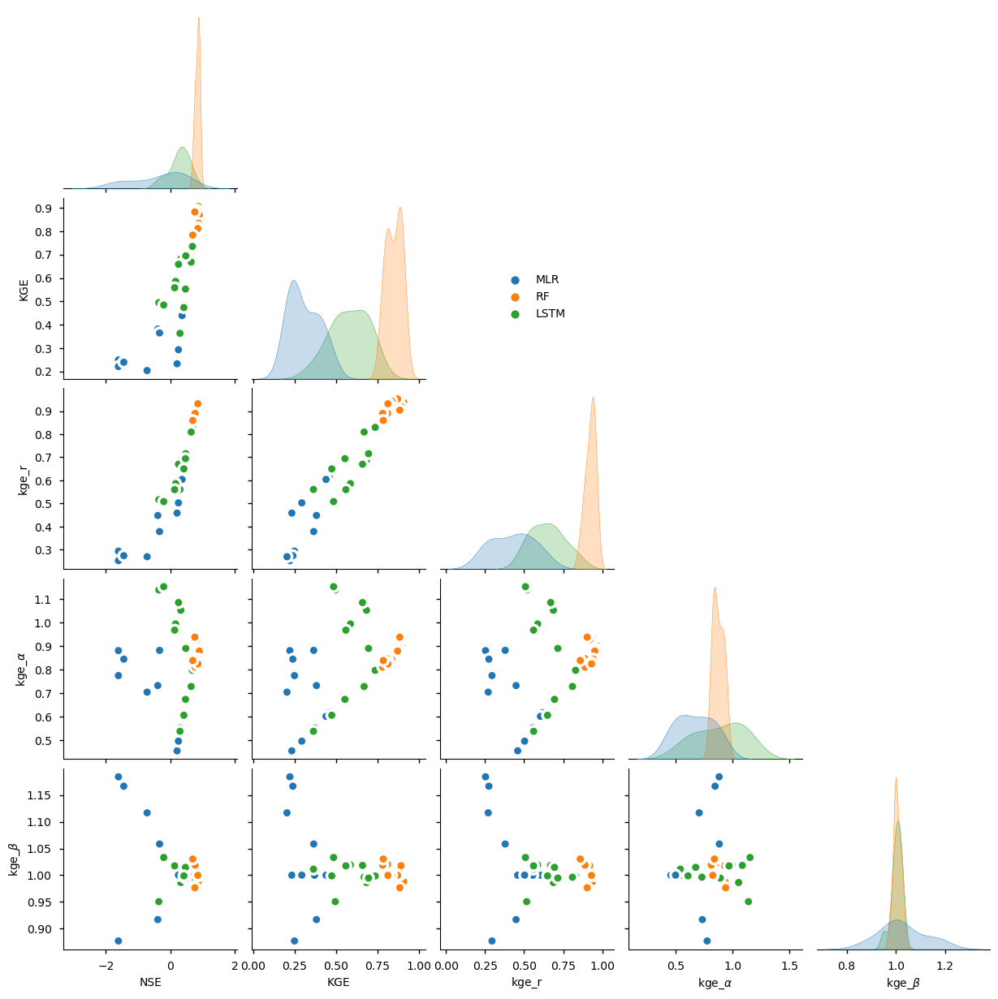

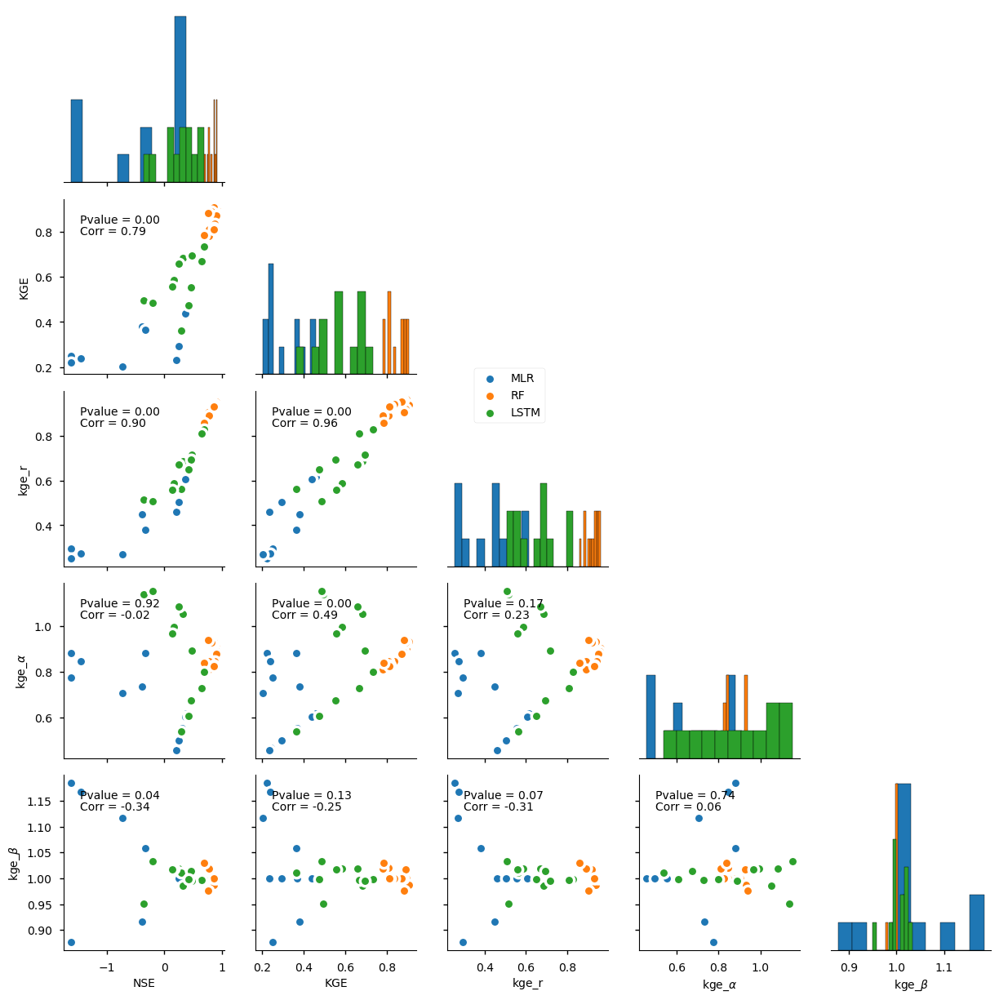

In [24]:
# Plot
plt.figure(figsize=(10,8), dpi= 80)
ax=sns.pairplot(df2_predictive, kind="scatter",corner=True, hue="Model", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
sns.move_legend(ax, "center", title=None, frameon=False, bbox_to_anchor=(0.5, 0.7))
plt.show()


# Create a PairGrid
grid = sns.PairGrid(df2_predictive,corner=True, hue="Model")

# Map the plots to the grid
grid = grid.map_diag(plt.hist, bins=10, edgecolor='k')
grid = grid.map_offdiag(plt.scatter, s=80, edgecolor='white', linewidth=2.5)


# Add a legend on top
handles = grid._legend_data.values()
labels = grid._legend_data.keys()
grid.fig.legend(handles=handles, labels=labels, loc='center', bbox_to_anchor=(0.5, 0.6))


# Iterate over lower plots to add correlation values
for i, j in zip(*np.tril_indices_from(grid.axes, -1)):
    grid.axes[i, j].annotate(f"Corr = {df_predictive.corr().iloc[i, j]:.2f}",
                             (0.1, 0.85), xycoords='axes fraction',
                             ha='left', va='top')
    grid.axes[i, j].annotate(f"Pvalue = {p_values.iloc[i, j]:.2f}",
                             (0.1, 0.85), xycoords='axes fraction',
                             ha='left', va='bottom')

In [25]:
df_new = df_predictive.copy()  # Create a copy of your original DataFrame

# Change the columns values of kge component to (X-1)**2
df_new[r'kge_$(1-\sqrt{(\alpha-1)^{2}})$'] = 1-np.sqrt((df_new[r'kge_$\alpha$']-1)**2)
df_new[r'kge_$(1-\sqrt{(\beta-1)^{2}})$'] = 1-np.sqrt((df_new[r'kge_$\beta$']-1)**2)


df_new=df_new.drop([r'kge_$\alpha$',r'kge_$\beta$',], axis=1) 


In [26]:
columns_new = df_new.columns
p_values_new = pd.DataFrame(index=columns_new, columns=columns_new)

for col1 in columns_new:
    for col2 in columns_new:
        if col1 == col2:
            p_values_new.loc[col1, col2] = np.nan  
        else:
            p_values_new.loc[col1, col2] = pearsonr(df_new[col1], df_new[col2])[1]



<Figure size 800x640 with 0 Axes>

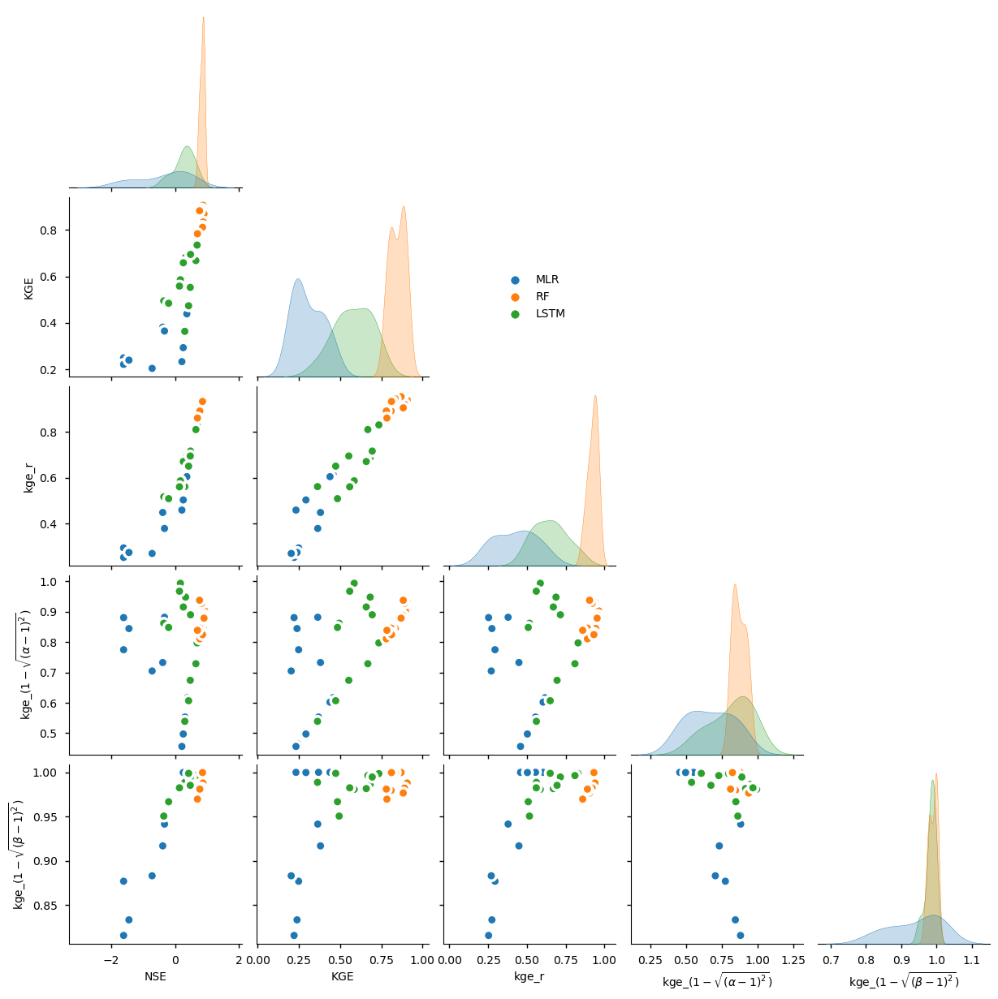

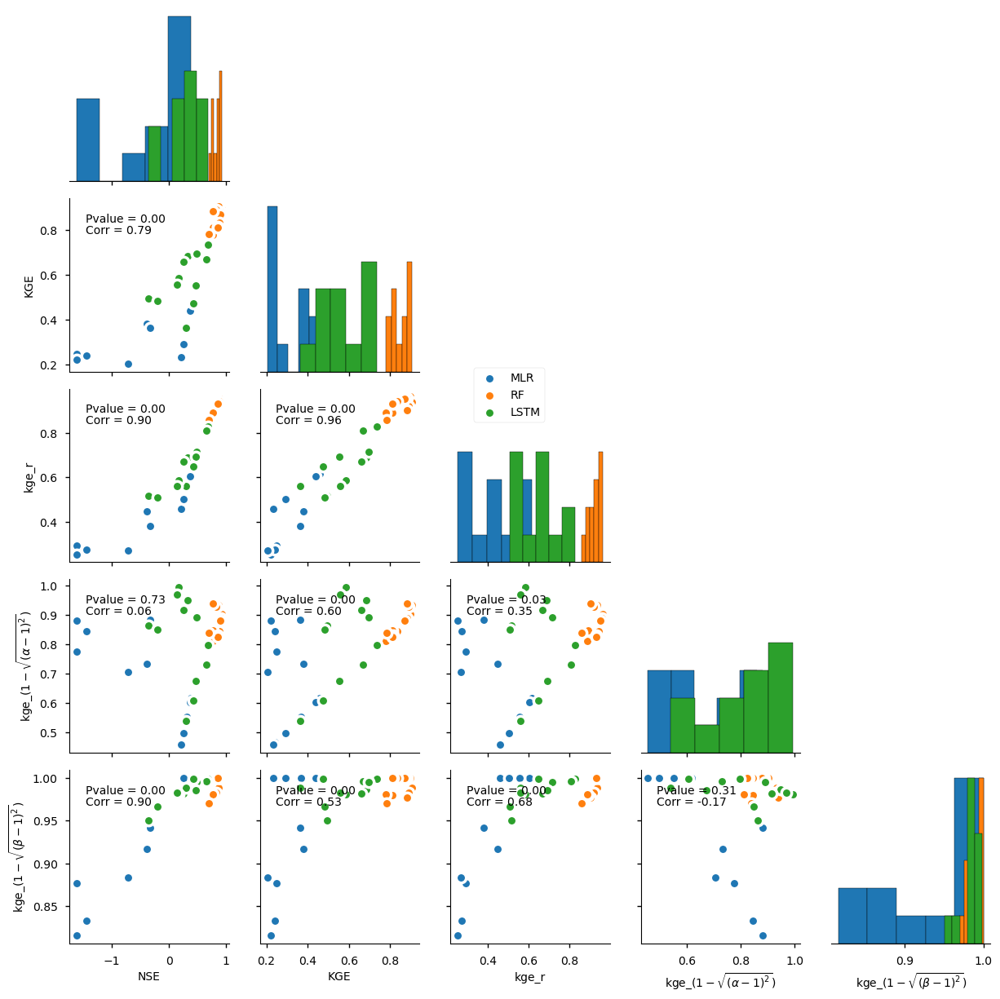

In [27]:
# Reset index to create 'model' column
df2_new=df_new.copy()
df2_new.reset_index(level=1, inplace=True)
df2_new.rename(columns={"level_1": "Model"}, inplace=True)


# Plot
plt.figure(figsize=(10,8), dpi= 80)
ax=sns.pairplot(df2_new, kind="scatter",corner=True, hue="Model", plot_kws=dict(s=80, edgecolor="white", linewidth=2.5))
sns.move_legend(ax, "center", title=None, frameon=False, bbox_to_anchor=(0.5, 0.7))
plt.show()


# Create a PairGrid
grid = sns.PairGrid(df2_new,corner=True, hue="Model")

# Map the plots to the grid
grid = grid.map_diag(plt.hist, bins=5, edgecolor='k')
grid = grid.map_offdiag(plt.scatter, s=80, edgecolor='white', linewidth=2.5)

# Add a legend on top
handles = grid._legend_data.values()
labels = grid._legend_data.keys()
grid.fig.legend(handles=handles, labels=labels, loc='center', bbox_to_anchor=(0.5, 0.6))


# Iterate over lower plots to add correlation values
for i, j in zip(*np.tril_indices_from(grid.axes, -1)):
    grid.axes[i, j].annotate(f"Corr = {df_new.corr().iloc[i, j]:.2f}",
                             (0.1, 0.85), xycoords='axes fraction',
                             ha='left', va='top')

    grid.axes[i, j].annotate(f"Pvalue = {p_values_new.iloc[i, j]:.2f}",
                             (0.1, 0.85), xycoords='axes fraction',
                             ha='left', va='bottom')

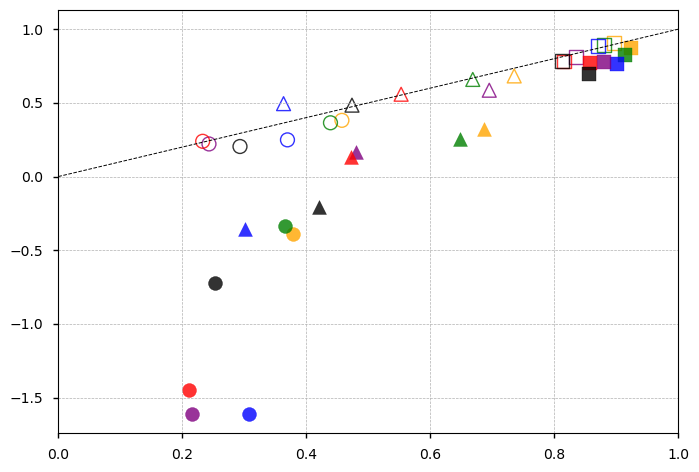

In [28]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

nse_models = [nse_mlr, nse_rf, nse_lstm]
kge_models = [kge_mlr, kge_rf, kge_lstm]
for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter(nse_models[i][j, 0], nse_models[i][j, 1], alpha=0.8, 
                    s=100, marker=markers[i], label=f'NSE {model}_{site}', color=colors[j])
        
        plt.scatter(kge_models[i][j, 0], kge_models[i][j, 1], alpha=0.8, 
            s=100, marker=markers[i], label=f'KGE {model}_{site}', edgecolors=colors[j], facecolors = 'none', linewidth=1)
        


# plt.xlabel("Local",fontsize= 12)
# plt.ylabel("Regional",fontsize= 12)
plt.xlim(0, 1)
# plt.ylim(-1.7, 1)
# plt.legend(loc='best', ncol=3, fontsize="8")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((-1, -1), (1, 1), linewidth=0.7, color='k',linestyle='--')
plt.show()




## Enteopy of Fc


In [29]:
from importlib import reload
reload(per)
reload(af)

<module 'allfunctions' from "C:\\Users\\askarzam\\OneDrive - The University of Colorado Denver\\Mozghan_share - Goodwell, Allison's files\\Theme2\\code\\Python\\allfunctions.py">

In [30]:
Hz_mlr= per.Entropy_LR(X_l_mlr,X_r_mlr)
Hz_rf= per.Entropy_LR(X_l_rf,X_r_rf)
Hz_lstm= per.Entropy_LR(X_l_lstm,X_r_lstm)

ENTOPY = pd.DataFrame(Hz_mlr,columns=['H_obs','H_mlr_Loc','H_mlr_Reg']).\
join([pd.DataFrame(Hz_rf[:,1:],columns=['H_rf_Loc','H_rf_Reg']),\
      pd.DataFrame(Hz_lstm[:,1:],columns=['H_lstm_Loc','H_lstm_Reg'])])

ENTOPY.index = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
ENTOPY


,H_obs,H_mlr_Loc,H_mlr_Reg,H_rf_Loc,H_rf_Reg,H_lstm_Loc,H_lstm_Reg
Ne1,0.535202,0.582655,0.660518,0.497145,0.554163,0.471195,0.567093
Ne2,0.517197,0.541576,0.665860,0.474129,0.554765,0.399481,0.553497
Ne3,0.507535,0.538021,0.652596,0.480621,0.576047,0.435962,0.604233
Br1,0.542873,0.501546,0.691420,0.515143,0.568218,0.456330,0.553117
Br3,0.518947,0.490300,0.672027,0.491122,0.530387,0.462106,0.547601
GC,0.548404,0.528912,0.657323,0.524509,0.611607,0.427309,0.639704


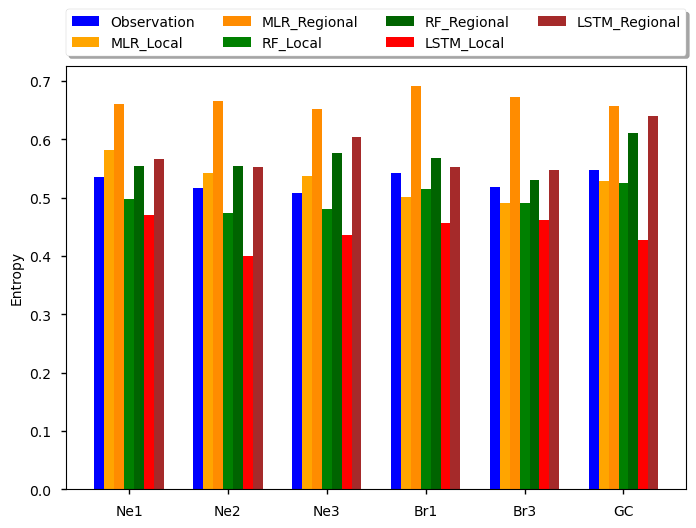

In [168]:
X_axis = np.arange(len(X_l_lstm.keys()))

plt.bar(X_axis-0.3, Hz_mlr[:,0], 0.1, label = 'Observation',color='blue')

plt.bar(X_axis-0.2, Hz_mlr[:,1], 0.1, label = 'MLR_Local',color='orange')
plt.bar(X_axis-0.1, Hz_mlr[:,2], 0.1, label = 'MLR_Regional',color='darkorange')

plt.bar(X_axis, Hz_rf[:,1], 0.1, label = 'RF_Local',color='green')
plt.bar(X_axis+0.1, Hz_rf[:,2], 0.1, label = 'RF_Regional',color='darkgreen')

plt.bar(X_axis+0.2, Hz_lstm[:,1], 0.1, label = 'LSTM_Local',color='red')
plt.bar(X_axis+0.3, Hz_lstm[:,2], 0.1, label = 'LSTM_Regional',color='brown')

plt.xticks(X_axis, ['Ne1', 'Ne2','Ne3','Br1','Br3','GC'])
plt.ylabel("Entropy")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=4, fancybox=True, shadow=True)
plt.show() 



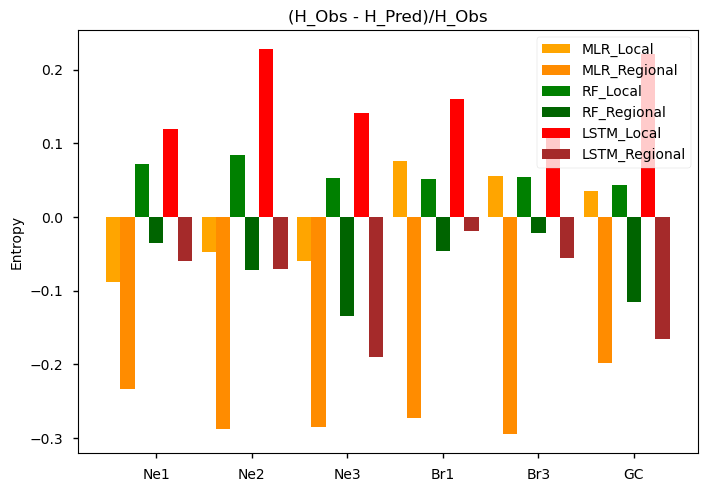

In [170]:
plt.bar(X_axis-0.45, 1-(Hz_mlr[:,1]/Hz_mlr[:,0]), 0.15, label = 'MLR_Local',color='orange')
plt.bar(X_axis-0.3, 1-(Hz_mlr[:,2]/Hz_mlr[:,0]), 0.15, label = 'MLR_Regional',color='darkorange')

plt.bar(X_axis-0.15, 1-(Hz_rf[:,1]/Hz_rf[:,0]), 0.15, label = 'RF_Local',color='green')
plt.bar(X_axis, 1-(Hz_rf[:,2]/Hz_rf[:,0]), 0.15, label = 'RF_Regional',color='darkgreen')

plt.bar(X_axis+0.15, 1-(Hz_lstm[:,1]/Hz_lstm[:,0]), 0.15, label = 'LSTM_Local',color='red')
plt.bar(X_axis+0.3, 1-(Hz_lstm[:,2]/Hz_lstm[:,0]), 0.15, label = 'LSTM_Regional',color='brown')

plt.xticks(X_axis, ['Ne1', 'Ne2','Ne3','Br1','Br3','GC'])
plt.ylabel("Entropy")
plt.title('(H_Obs - H_Pred)/H_Obs')
plt.legend(loc='best')
plt.show()



In [250]:
models = ['MLR', 'RF', 'LSTM']
sites = ['Ne1', 'Ne2', 'Ne3', 'Br1', 'Br3', 'GC']
scales = ['', '_r']  # Using an empty string for local and "_r" for regional

# Create an empty dataframe with multi-index
multi_idx = pd.MultiIndex.from_product([sites, scales], names=['Site', 'Scale'])
Ah = pd.DataFrame(index=multi_idx, columns=models)

for model in models:
    for j, site in enumerate(sites):
        if model == 'MLR':
            Ah.at[(site, ''), model] = -abs((Hz_mlr[j, 0] - Hz_mlr[j, 1]) / Hz_mlr[j, 0])
            Ah.at[(site, '_r'), model] = -abs((Hz_mlr[j, 0] - Hz_mlr[j, 2]) / Hz_mlr[j, 0])
        elif model == 'RF':
            Ah.at[(site, ''), model] = -abs((Hz_rf[j, 0] - Hz_rf[j, 1]) / Hz_rf[j, 0])
            Ah.at[(site, '_r'), model] = -abs((Hz_rf[j, 0] - Hz_rf[j, 2]) / Hz_rf[j, 0])
        elif model == 'LSTM':
            Ah.at[(site, ''), model] = -abs((Hz_lstm[j, 0] - Hz_lstm[j, 1]) / Hz_lstm[j, 0])
            Ah.at[(site, '_r'), model] = -abs((Hz_lstm[j, 0] - Hz_lstm[j, 2]) / Hz_lstm[j, 0])

# Reset the multi-index
Ah.reset_index(inplace=True)

# Combine 'Site' and 'Scale' columns to achieve the desired index
Ah['Site'] = Ah['Site'] + Ah['Scale']
Ah.drop(columns='Scale', inplace=True)
Ah.set_index('Site', inplace=True)

# Convert the DataFrame to the desired format
Ah = Ah.stack().to_frame().rename(columns={0: '$A_{H}$'})



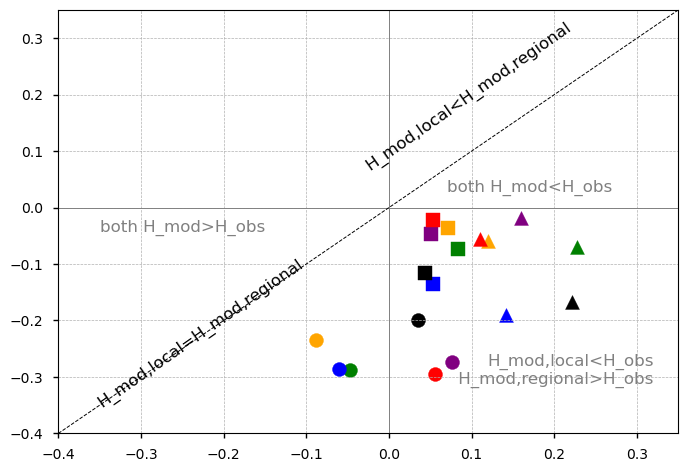

In [242]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

for i, model in enumerate(models):
    for j, site in enumerate(sites):
        local_value = (Hz_mlr[j, 0] - Hz_mlr[j, 1]) / Hz_mlr[j, 0] if model == 'MLR' else\
        (Hz_rf[j, 0] - Hz_rf[j, 1]) / Hz_rf[j, 0] if model == 'RF' else (Hz_lstm[j, 0] - Hz_lstm[j, 1]) / Hz_lstm[j, 0]
        regional_value = -abs((Hz_mlr[j, 0] - Hz_mlr[j, 2]) / Hz_mlr[j, 0]) if model == 'MLR' \
        else (Hz_rf[j, 0] - Hz_rf[j, 2]) / Hz_rf[j, 0] if model == 'RF' else (Hz_lstm[j, 0] - Hz_lstm[j, 2]) / Hz_lstm[j, 0]
        plt.scatter(local_value, regional_value, c=colors[j], marker=markers[i], label=f'{model}_{site}',s=100)

# plt.xlabel("Local model")
# plt.ylabel("Regional model")
# plt.title('$A_{H}$')
plt.xlim(-0.4, 0.35)
plt.ylim(-0.4, 0.35)
# plt.legend(loc='best', ncol=3, fontsize="8")
plt.axhline(0, color='gray', linewidth=0.7)  # y=0 line
plt.axvline(0, color='gray', linewidth=0.7)  # x=0 line
plt.axline((-.3, -.3), (0, 0), linewidth=0.7, color='k', linestyle='--')

# # add text
plt.text(0.225, 0.06, 'H_mod,local<H_mod,regional', ha='right', va='bottom', color='black',rotation=35,fontsize=12)
plt.text(-0.1, -0.36, 'H_mod,local=H_mod,regional', ha='right', va='bottom', color='black',rotation=35,fontsize=12)

plt.text(0.27, 0.02, 'both H_mod<H_obs', ha='right', va='bottom', color='gray',fontsize=12)
plt.text(-0.15, -0.05, 'both H_mod>H_obs', ha='right', va='bottom', color='gray',fontsize=12)
plt.text(0.32, -0.32, 'H_mod,local<H_obs\n H_mod,regional>H_obs', ha='right', va='bottom', color='gray',fontsize=12)

plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.show()


In [42]:
#Local models
bins_obs=100
bins_model_mlr_l=np.zeros(len(X_l_mlr.keys()))
bins_model_rf_l=np.zeros(len(X_l_rf.keys()))
bins_model_lstm_l=np.zeros(len(X_l_lstm.keys()))
#Regional models
bins_model_mlr_r=np.zeros(len(X_l_mlr.keys()))
bins_model_rf_r=np.zeros(len(X_l_rf.keys()))
bins_model_lstm_r=np.zeros(len(X_l_lstm.keys()))



for i in range(0,6):
    bins_model_mlr_l[i]= af.BinNumber_model(X_l_mlr[i]['Fc_obs'],X_l_mlr[i]['Fc_model'],bins_obs)
    bins_model_rf_l[i]= af.BinNumber_model(X_l_rf[i]['Fc_obs'],X_l_rf[i]['Fc_model'],bins_obs)
    bins_model_lstm_l[i]= af.BinNumber_model(X_l_lstm[i]['Fc_obs'],X_l_lstm[i]['Fc_model'],bins_obs)
        
    bins_model_mlr_r[i] = af.BinNumber_model(X_r_mlr[i]['Fc_obs'], X_r_mlr[i]['Fc_model'],bins_obs)
    bins_model_rf_r[i] = af.BinNumber_model(X_r_rf[i]['Fc_obs'], X_r_rf[i]['Fc_model'],bins_obs)
    bins_model_lstm_r[i] = af.BinNumber_model(X_r_lstm[i]['Fc_obs'], X_r_lstm[i]['Fc_model'],bins_obs)
    

## Mutual Informatiom

In [43]:
MI_mlr, MI_N_mlr= per.MI_LR(X_l_mlr,X_r_mlr,bins_model_mlr_l,bins_model_mlr_r)
MI_rf, MI_N_rf= per.MI_LR(X_l_rf,X_r_rf,bins_model_rf_l,bins_model_rf_r)
MI_lstm, MI_N_lstm= per.MI_LR(X_l_lstm,X_r_lstm, bins_model_lstm_l,bins_model_lstm_r)

In [44]:
label = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC']

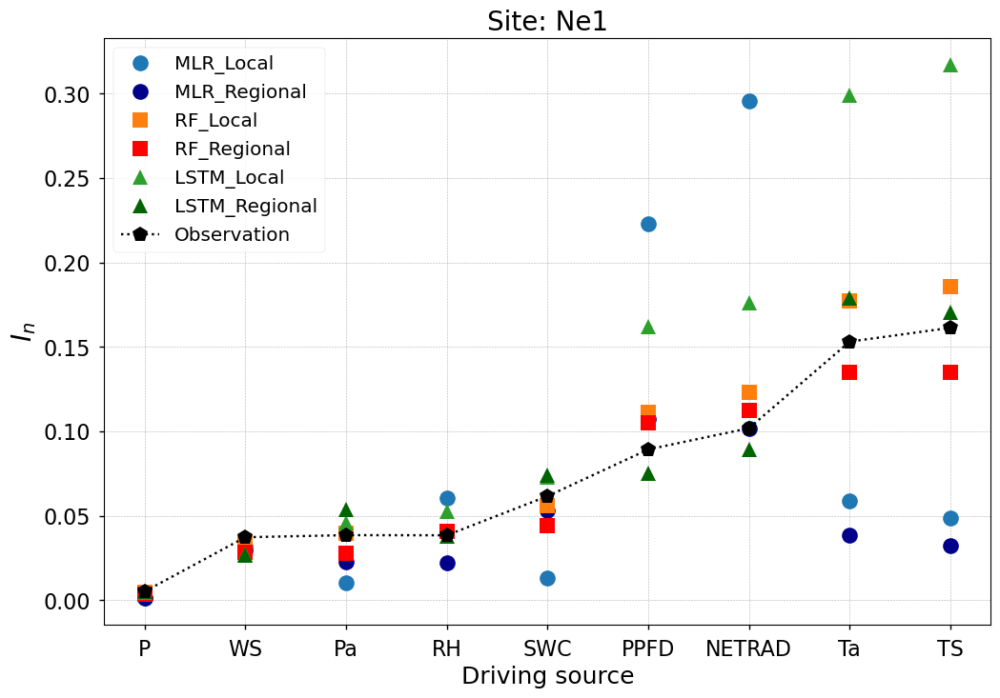

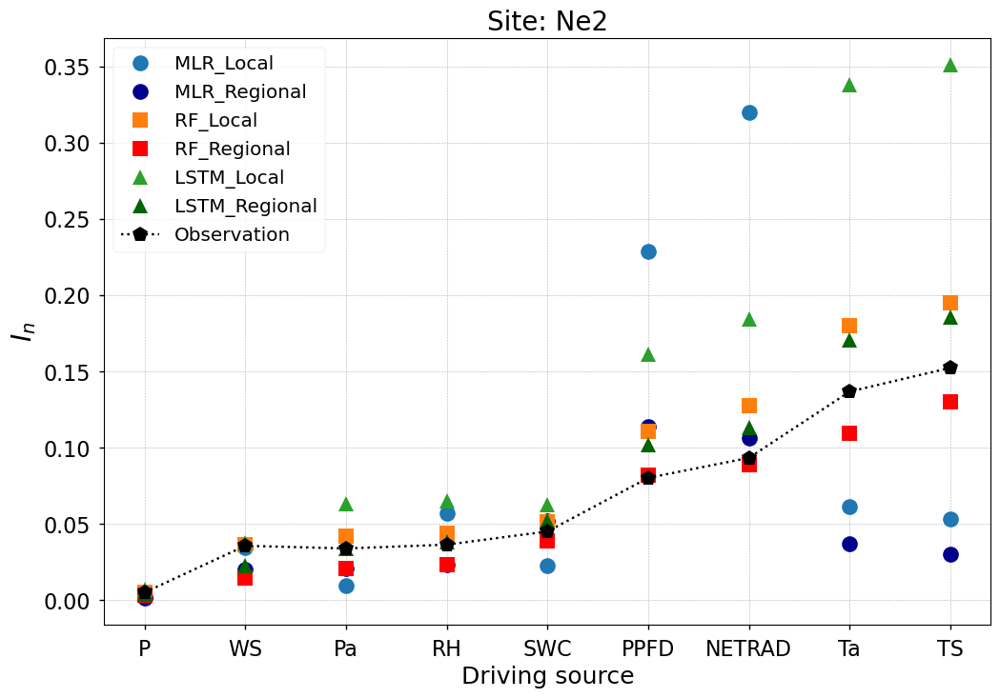

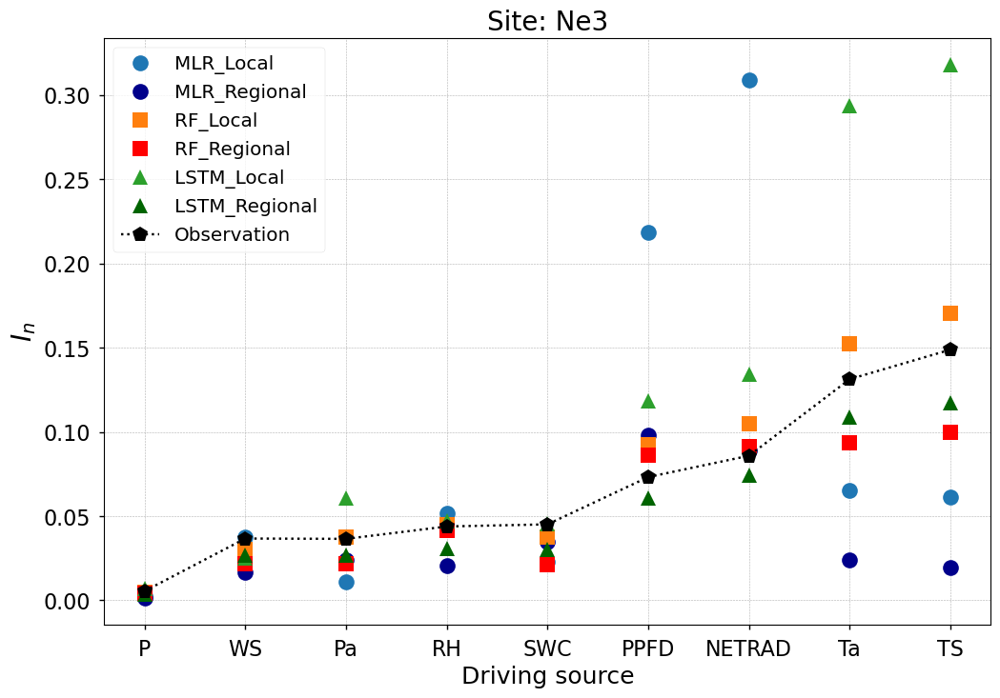

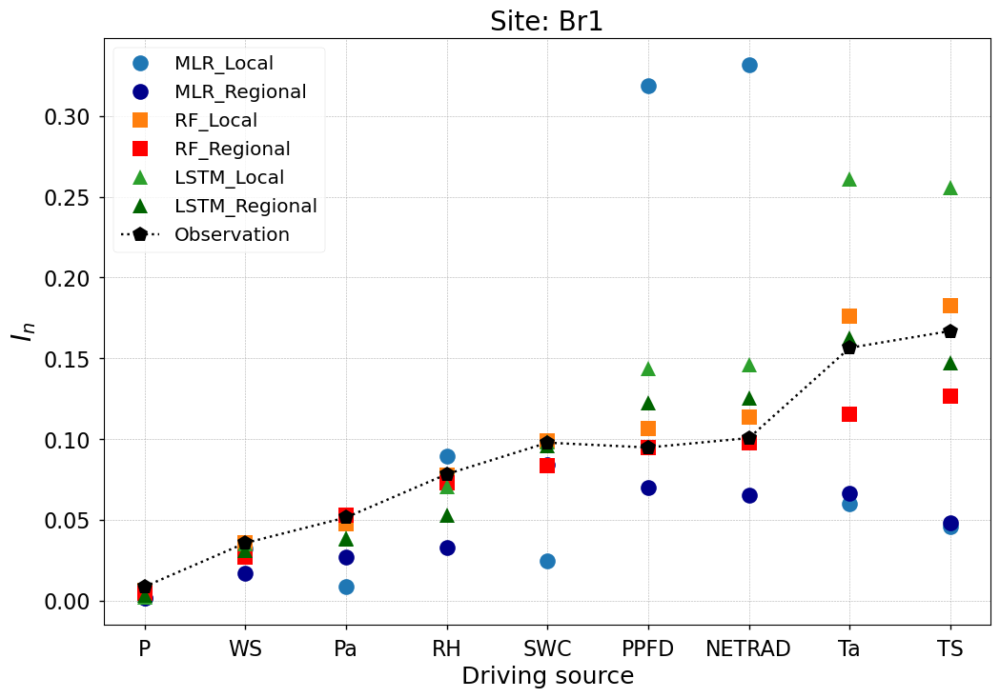

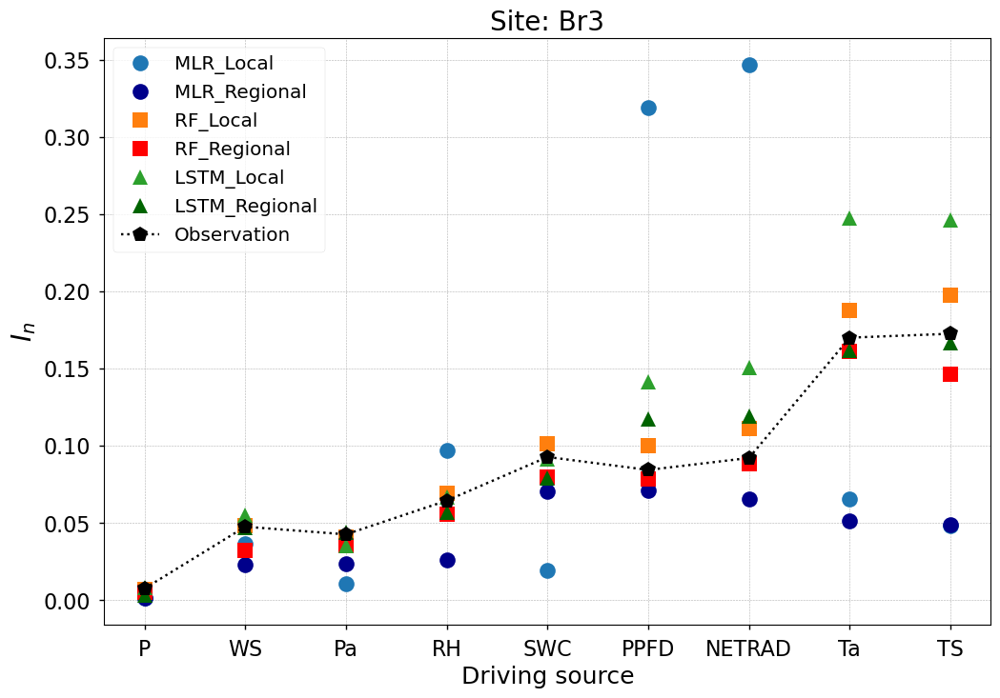

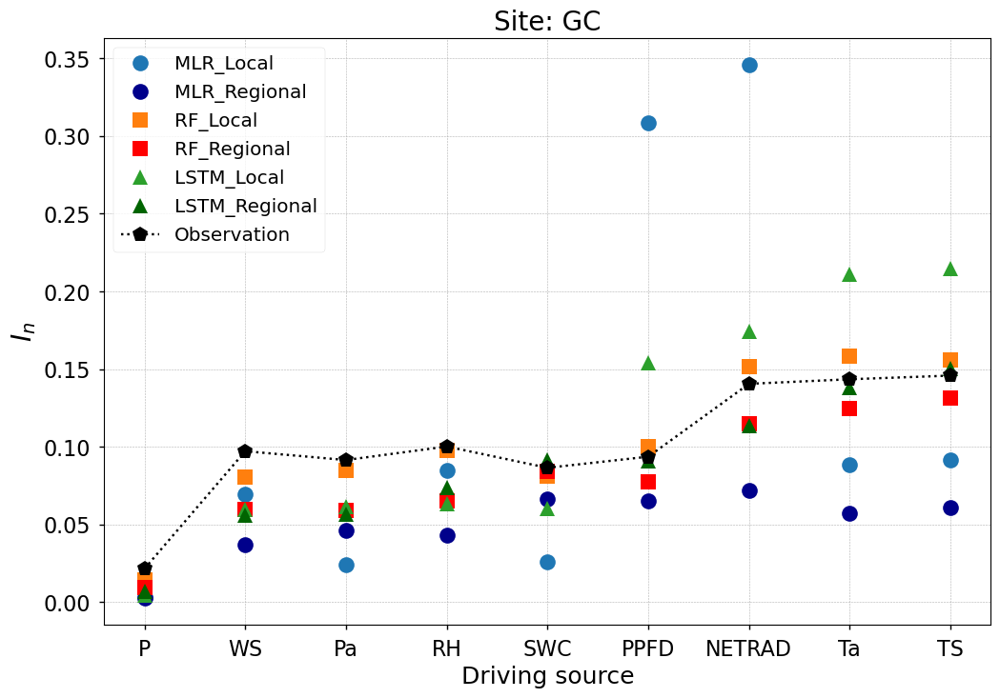

In [45]:
def plot_mi(mi_dicts, model_names, labels):
    # Number of models
    n_models = len(mi_dicts)

    # Number of sites
    sites= ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
    n_sites = len(sites)

    # Calculate average MI across all sites
    avg_mi_values = np.mean([mi_dicts[0][site][:,0] for site in range(n_sites)], axis=0)
    
    # Get the sorted index based on average MI values
    sorted_index = np.argsort(avg_mi_values)

    # Reorder the labels based on the sorted index
    sorted_labels = [labels[i] for i in sorted_index]
    
    # Create a new figure for each site
    for site in range(n_sites):
        fig= plt.figure(figsize=(12, 8))
        
        # Number of labels for this site
        n_labels = len(sorted_labels)
        
        
        # Create markers for each model
        markers = ['o', 'o', 's','s', '^', '^']
        color= ['#1f77b4','darkblue','#ff7f0e','red', '#2ca02c', 'darkgreen']
        
        for m in range(n_models):
            mi_dict = mi_dicts[m]
            model_name = model_names[m]
            
            # Separate lists for the 'Obs', 'Local', and 'Regional' values
            mi_values_obs = []
            mi_values_model = []
            
            # Collect the 'Obs' and 'Model' values for each label
            for i in sorted_index:
                mi_values = mi_dict[site][i]
                
                # Append to the separate lists
                mi_values_obs.append(mi_values[0])
                mi_values_model.append(mi_values[1 if m%2==0 else 2])
                
            
            # Plot the markers
            plt.plot(mi_values_model, markers[m],color=color[m], markersize=12, label=model_name)

        # Plot the observation markers (the same for all models, so we use the first one)

        plt.plot(mi_values_obs, 'p', markersize=12, linestyle='dotted', color='black', label='Observation')
        

        # Set the x ticks with names
        plt.xticks(range(n_labels), sorted_labels, fontsize=16)
        plt.yticks(fontsize=16)
        # Labelling
        plt.xlabel("Driving source", fontsize=18)
        plt.ylabel("$I_{n}$", fontsize=20)
        plt.title("Site: "+ sites[site], fontsize=20)
        plt.grid(True, which='both', linestyle='--', linewidth=0.4)  # Grid
        # Add a legend
        plt.legend(loc= 'upper left', fontsize='x-large')
        
        plt.show()
        
    

# Create the plots
plot_mi([MI_N_mlr, MI_N_mlr, MI_N_rf, MI_N_rf, MI_N_lstm, MI_N_lstm], 
        ['MLR_Local', 'MLR_Regional', 'RF_Local', 'RF_Regional', 'LSTM_Local', 'LSTM_Regional'], 
        label)


## The single source level: Af,MI

In [159]:
Af_MI_mlr=per.AfMI(X_l_mlr,Hz_mlr,MI_mlr)
Af_MI_rf= per.AfMI(X_l_rf,Hz_rf,MI_rf)
Af_MI_lstm= per.AfMI(X_l_lstm,Hz_lstm,MI_lstm)

In [160]:
Af_Mi_mlr_tot = np.zeros((6,2))
Af_Mi_rf_tot = np.zeros((6,2))
Af_Mi_lstm_tot = np.zeros((6,2))

for k in range(0,6):
    for i in range(0,2):
        Af_Mi_mlr_tot[k][i]= ((1-abs(Af_MI_mlr[k][i])).sum(axis=0))/9
        Af_Mi_rf_tot[k][i]= ((1-abs(Af_MI_rf[k][i])).sum(axis=0))/9
        Af_Mi_lstm_tot[k][i]= ((1-abs(Af_MI_lstm[k][i])).sum(axis=0))/9

In [161]:
AfMI = pd.DataFrame({'Af_Mi_mlr': Af_Mi_mlr_tot.reshape(12,)}).\
join([pd.DataFrame({'Af_Mi_rf': Af_Mi_rf_tot.reshape(12,)}),\
      pd.DataFrame({'Af_Mi_lstm': Af_Mi_lstm_tot.reshape(12,)})])

In [162]:
AfMI.index = ['Ne1','Ne1_r', 'Ne2', 'Ne2_r','Ne3','Ne3_r','Br1','Br1_r','Br3','Br3_r','GC','GC_r']
AfMI=pd.DataFrame(AfMI.stack()).rename(columns={0: '$A_{f,MI,tot}$'})

# Assign the new levels to the DataFrame
AfMI.index  = AfMI.index.set_levels(['MLR', 'RF', 'LSTM'], level=1)
AfMI

$A_{f,MI,tot}$
Ne1   MLR         0.142439
      RF          0.874580
      LSTM        0.493342
Ne1_r MLR         0.592083
      RF          0.809803
      LSTM        0.843881
Ne2   MLR         0.121472
      RF          0.780218
      LSTM        0.187415
Ne2_r MLR         0.538783
      RF          0.749098
      LSTM        0.809228
Ne3   MLR         0.154210
      RF          0.857315
      LSTM        0.454641
Ne3_r MLR         0.505001
      RF          0.722559
      LSTM        0.753386
Br1   MLR         0.042230
      RF          0.905174
      LSTM        0.636011
Br1_r MLR         0.509499
      RF          0.831797
      LSTM        0.771648
Br3   MLR        -0.109411
      RF          0.890529
      LSTM        0.700185
Br3_r MLR         0.503901
      RF          0.843336
      LSTM        0.816361
GC    MLR         0.196121
      RF          0.891052
      LSTM        0.555371
GC_r  MLR         0.471493
      RF          0.749959
      LSTM        0.768366

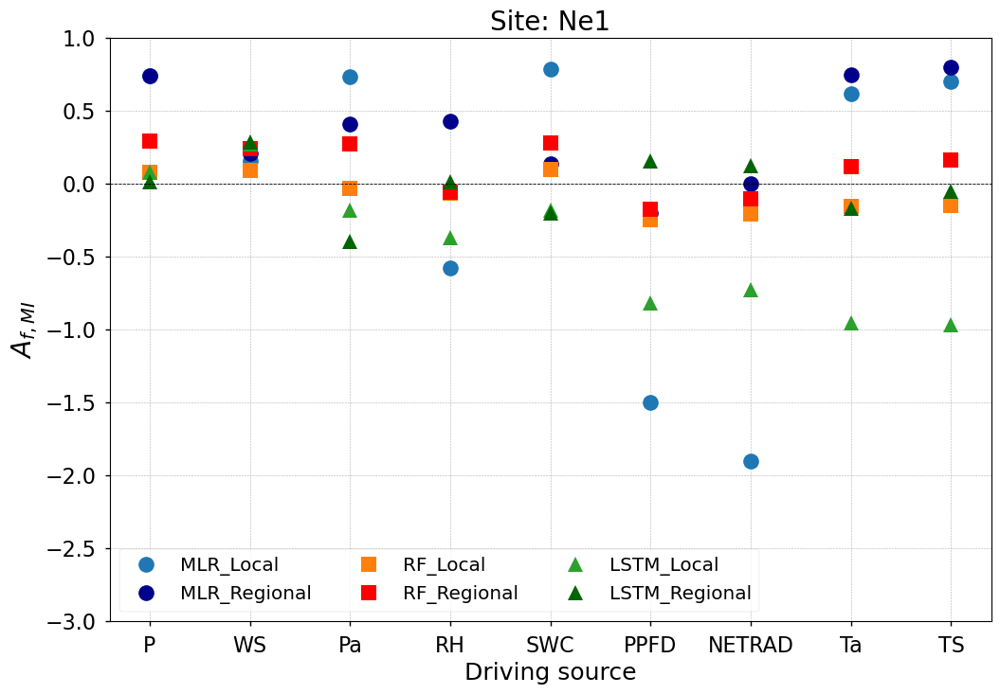

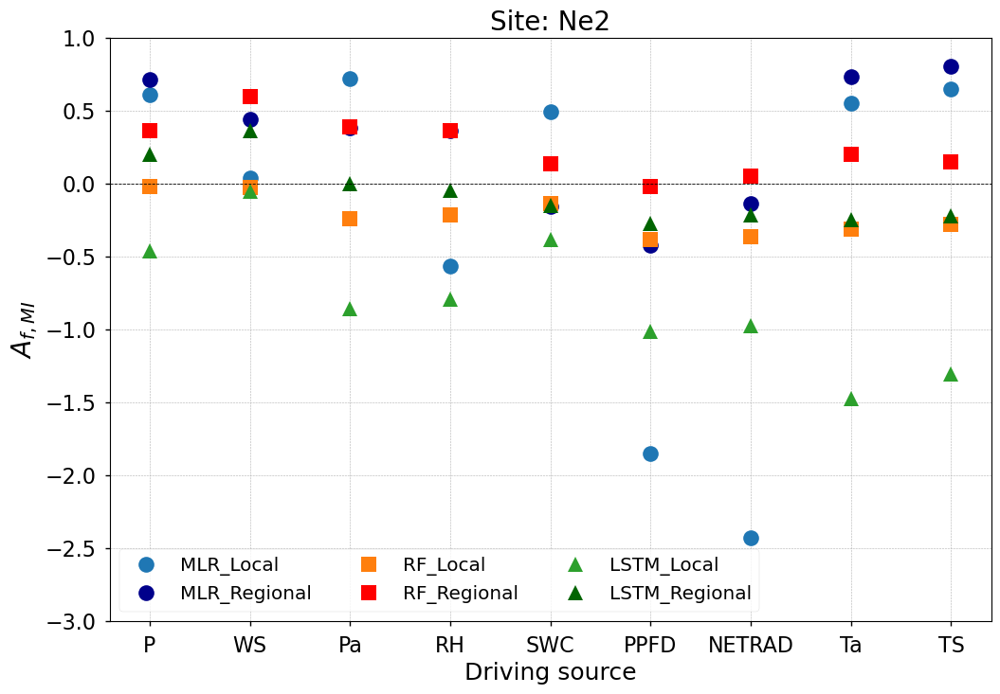

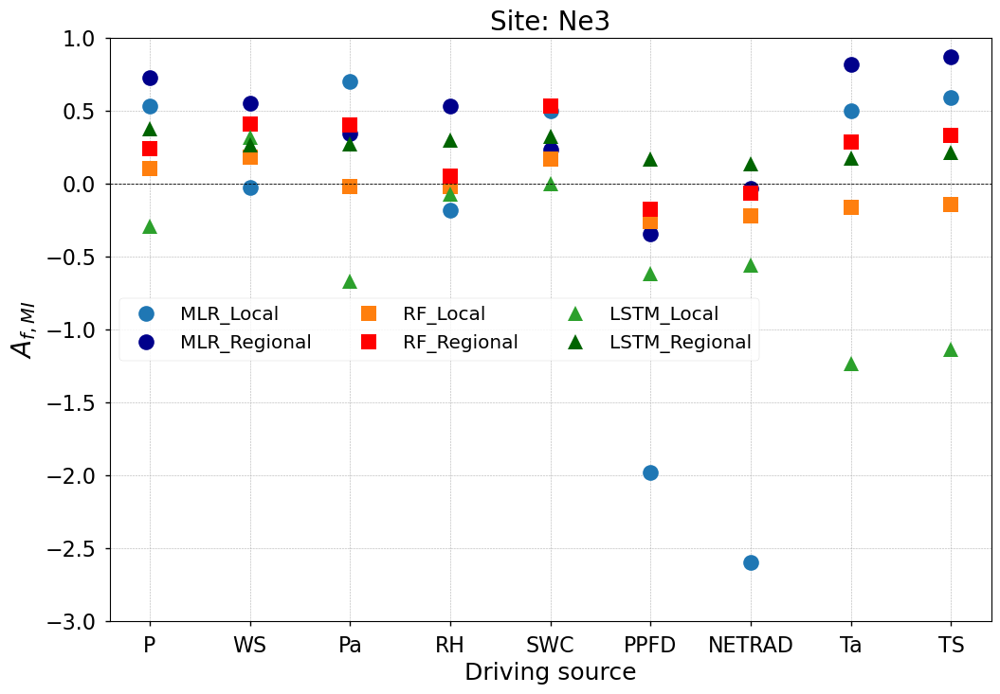

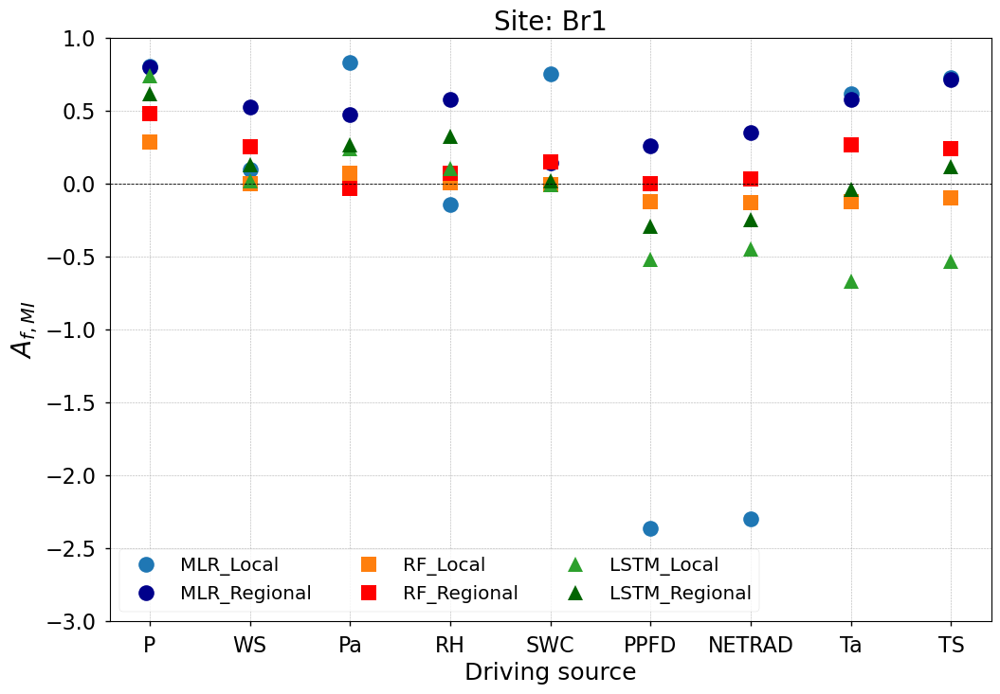

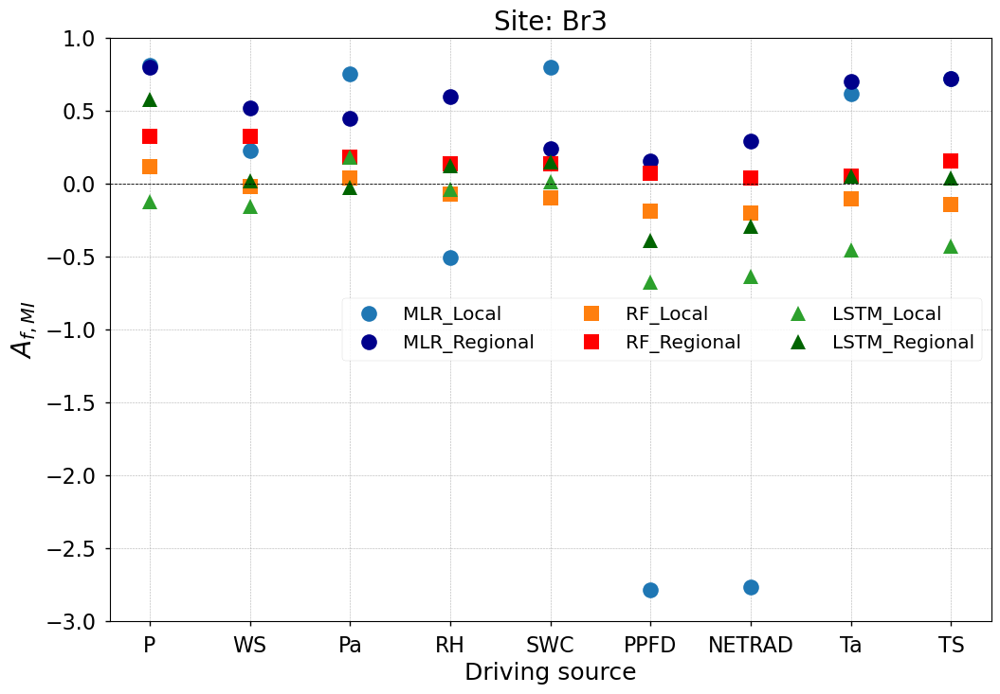

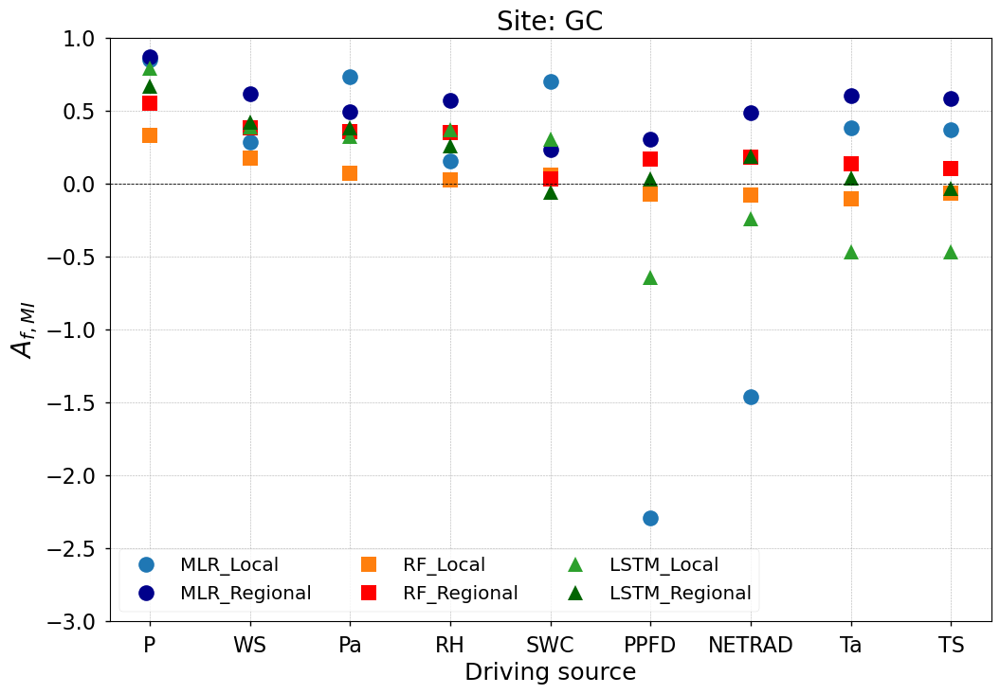

In [51]:
def plot_afmi(afmi_dicts, mi_dicts, model_names, labels):
    # Number of models
    n_models = len(afmi_dicts)

    # Number of sites
    sites= ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
    n_sites = len(sites)

    # Number of labels
    n_labels = len(labels)
    
    # Calculate average MI across all sites
    avg_mi_values = np.mean([mi_dicts[0][site][:,0] for site in range(n_sites)], axis=0)

    # Get the sorted index based on average MI values
    sorted_index = np.argsort(avg_mi_values)

    # Reorder the labels based on the sorted index
    sorted_labels = [labels[i] for i in sorted_index]

    # Create a new figure for each site
    for site in range(n_sites):
        fig= plt.figure(figsize=(12, 8))

        markers = ['o', 'o', 's', 's', '^','^']
        color= ['#1f77b4','darkblue','#ff7f0e','red', '#2ca02c', 'darkgreen']


        for m in range(n_models):
            
            afmi_dict = afmi_dicts[m]
            model_name = model_names[m]
            
            # Separate lists for the 'Local' and 'Regional' values
            afmi_values_model = []
            
            # Collect the 'Model' values for each label
            for i in sorted_index:
                afmi_values = pd.concat(afmi_dict[site], axis=1).values[i]

                # Append to the separate lists
                afmi_values_model.append(afmi_values[0 if m%2==0 else 1])


            # Plot the markers
            plt.plot(afmi_values_model, markers[m], markersize=12,color=color[m], label=model_name)
            


        # Set the x ticks with names
        plt.xticks(range(n_labels), sorted_labels, fontsize=16)
        plt.yticks(fontsize=16)
        
        # Labelling
        plt.ylim(-3, 1)
        plt.xlabel("Driving source", fontsize=18)
        plt.ylabel("$A_{f,MI}$", fontsize=20)
        plt.title("Site: "+ sites[site], fontsize=20)
        
        # Add a legend
        plt.legend(loc='best',fontsize='x-large', ncol=3 )
        
        plt.axhline(0, color='black', linestyle='--', linewidth=0.6)  # y=0 line
        plt.grid(True, which='both', linestyle='--', linewidth=0.4)  # Grid
        
        plt.show()
        
label = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC']
        
model_names= ['MLR_Local', 'MLR_Regional', 'RF_Local', 'RF_Regional', 'LSTM_Local', 'LSTM_Regional']
mi_dicts= [MI_mlr, MI_mlr, MI_rf, MI_rf, MI_lstm, MI_lstm]
afmi_dicts= [Af_MI_mlr, Af_MI_mlr, Af_MI_rf, Af_MI_rf, Af_MI_lstm, Af_MI_lstm]

plot_afmi(afmi_dicts, mi_dicts,model_names, label)


The pairwise information flow for MLR model


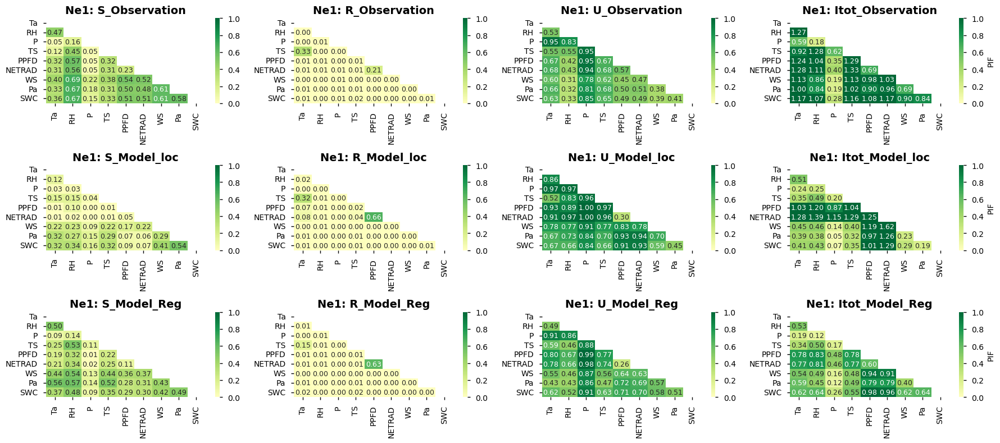

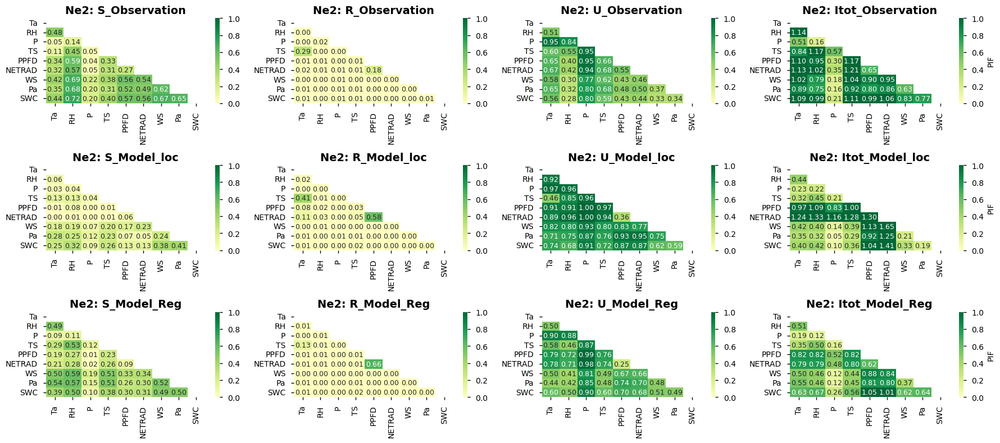

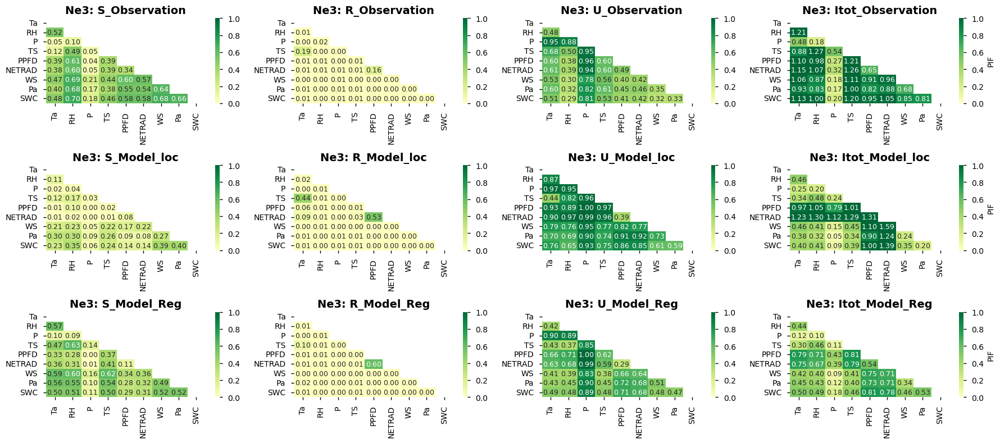

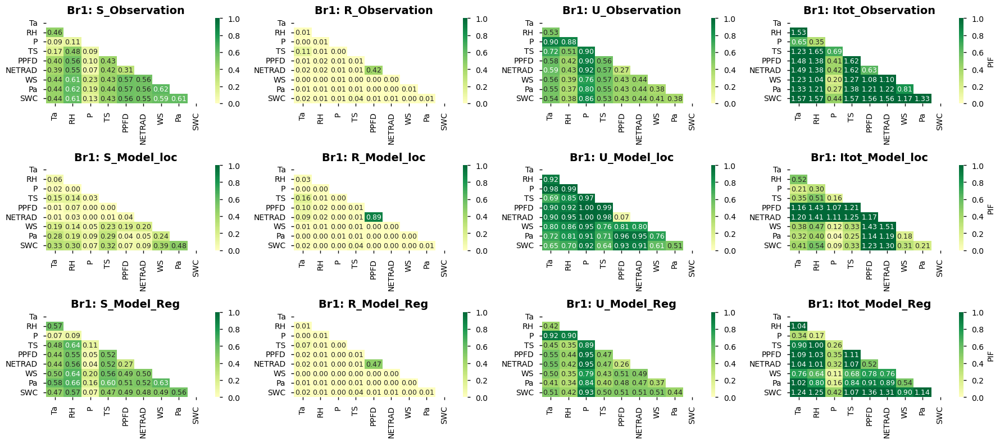

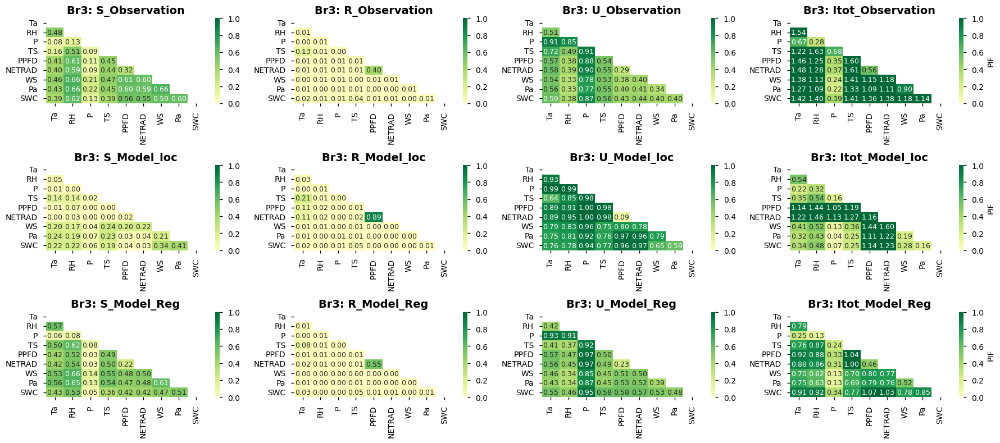

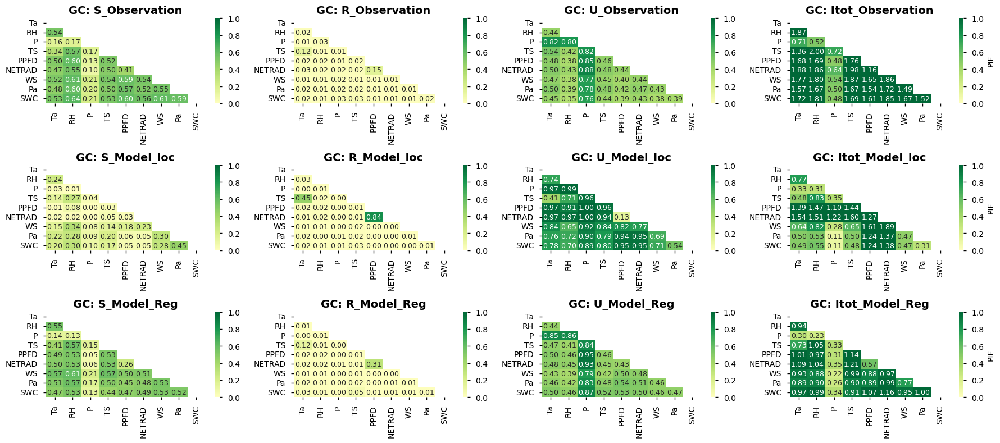

The pairwise information flow for RF model


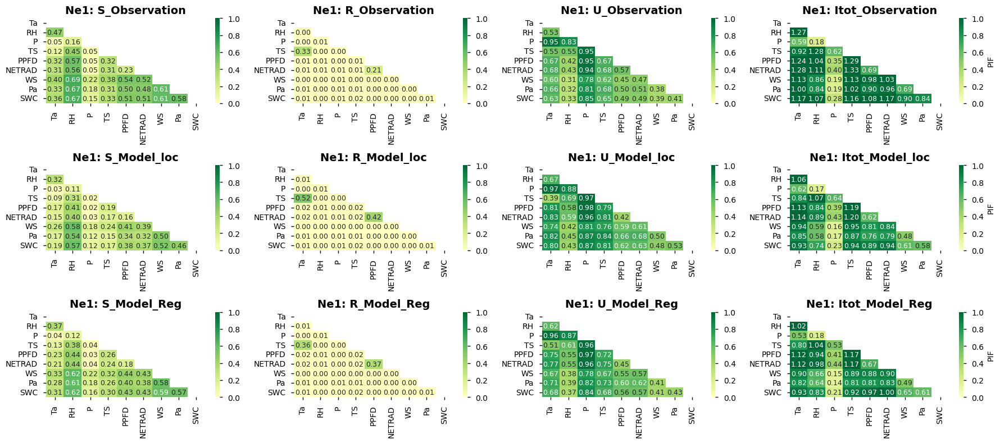

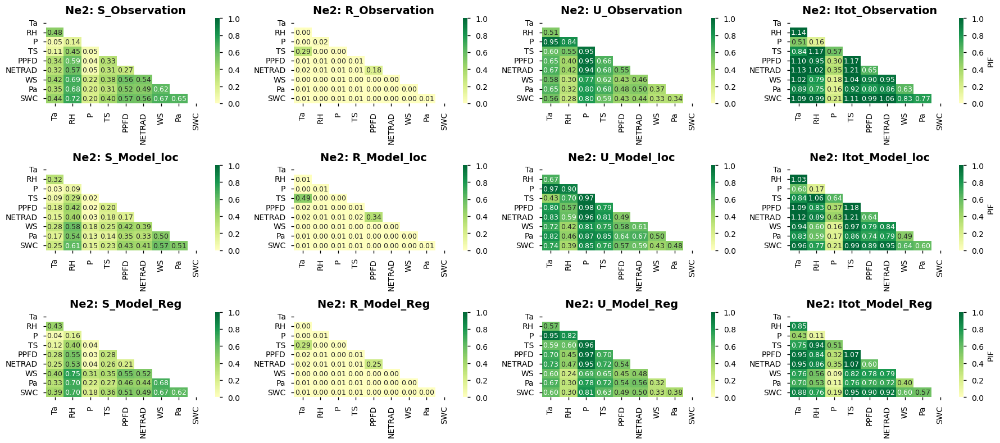

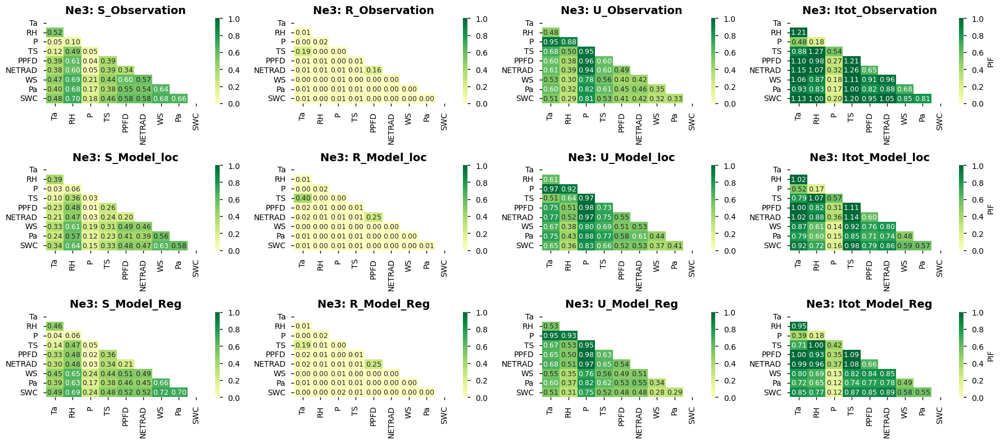

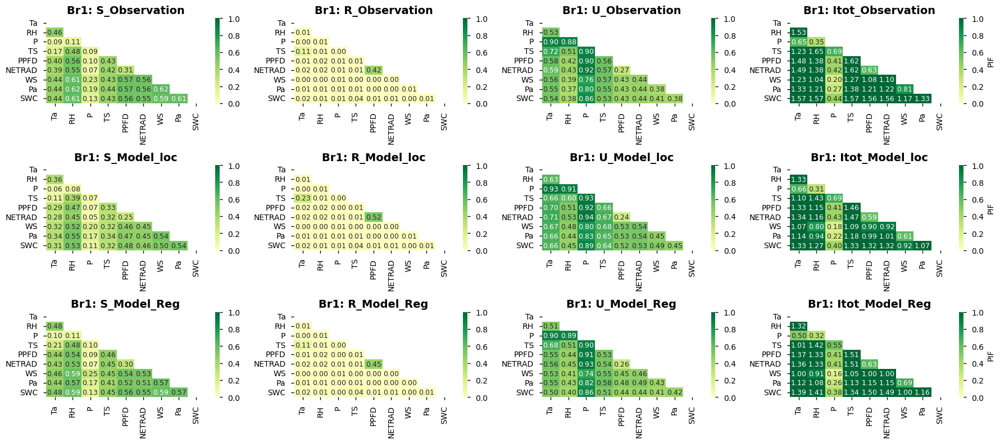

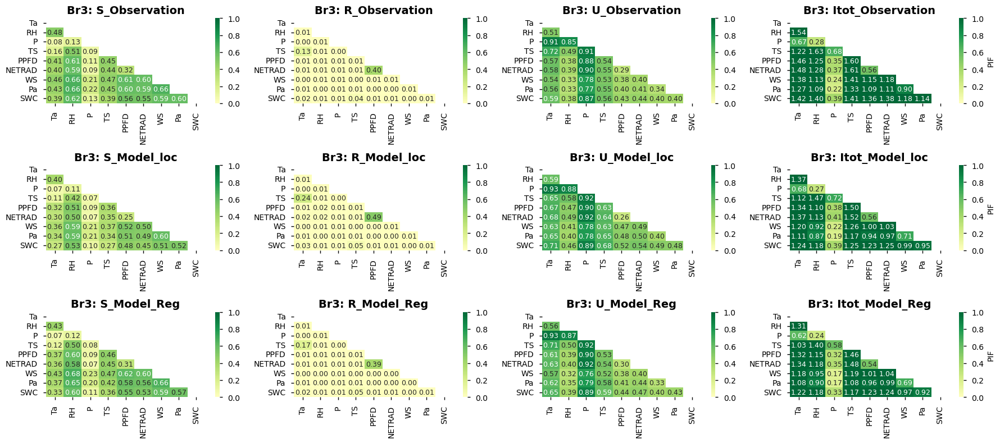

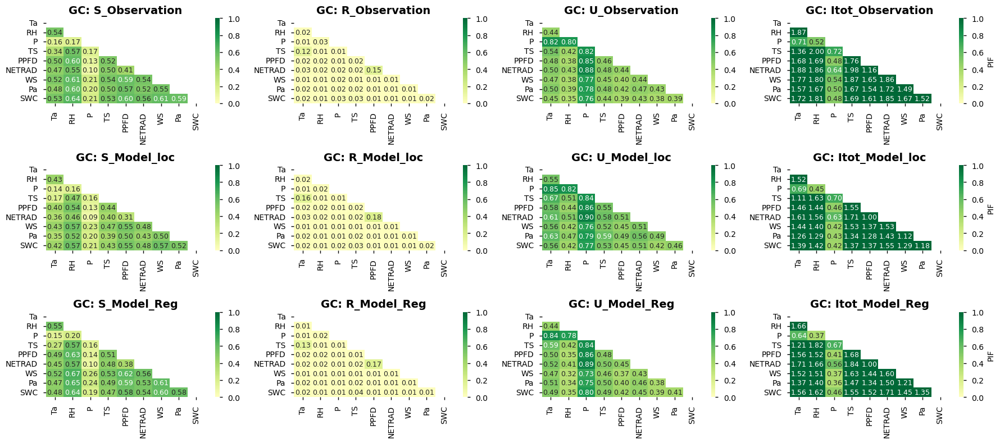

The pairwise information flow for LSTM model


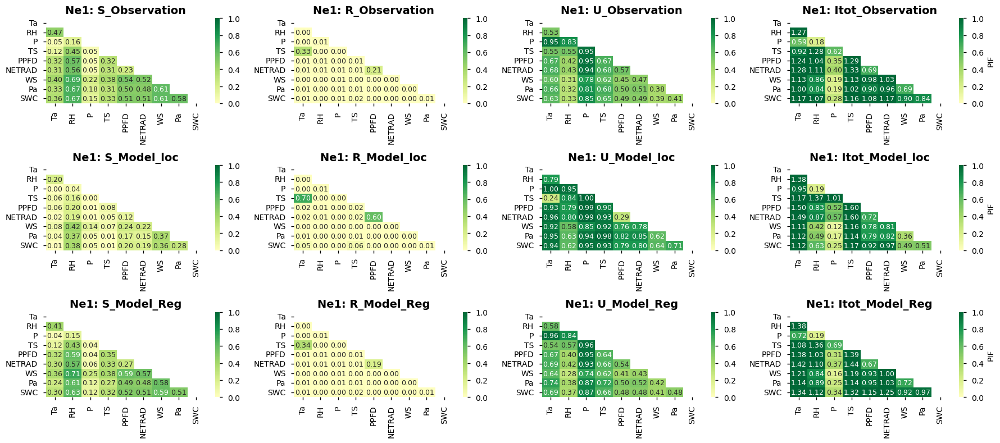

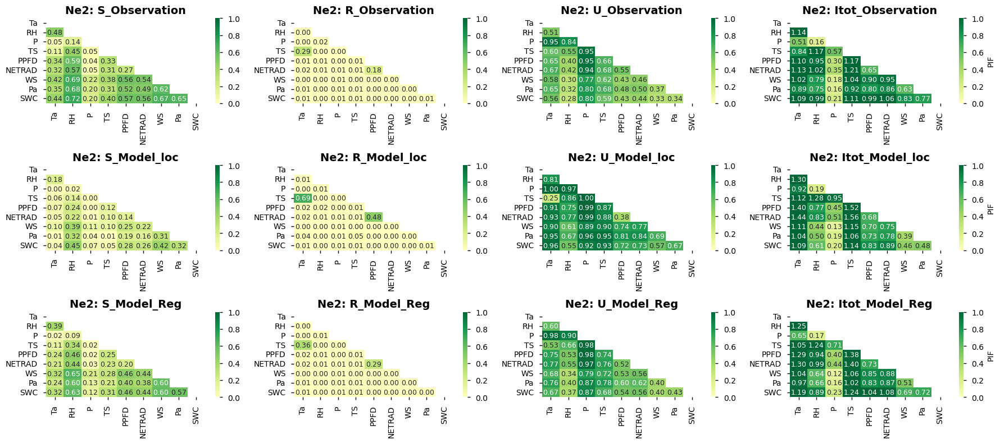

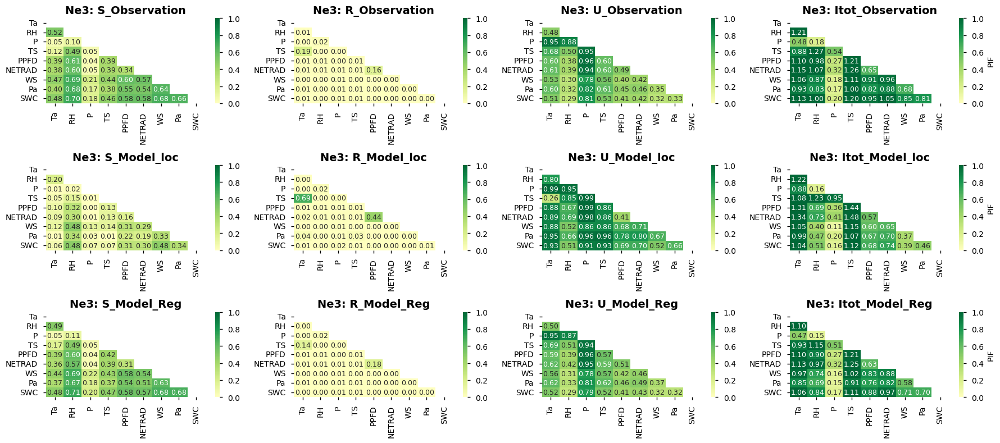

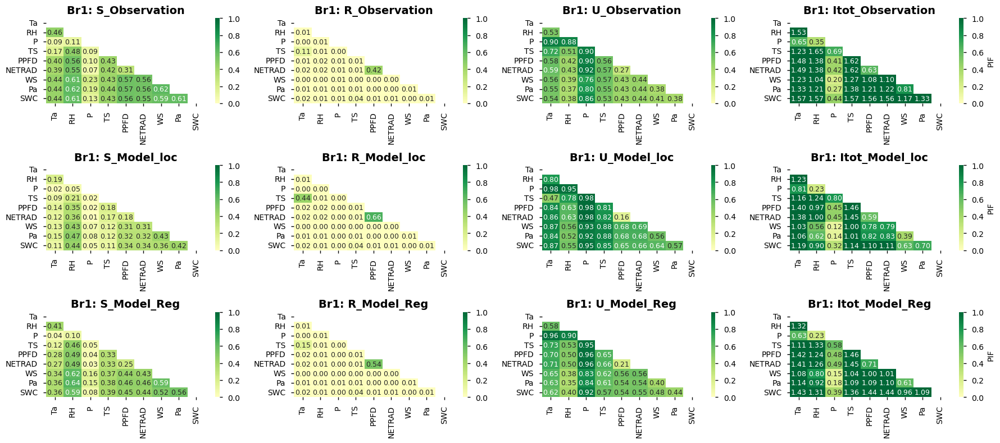

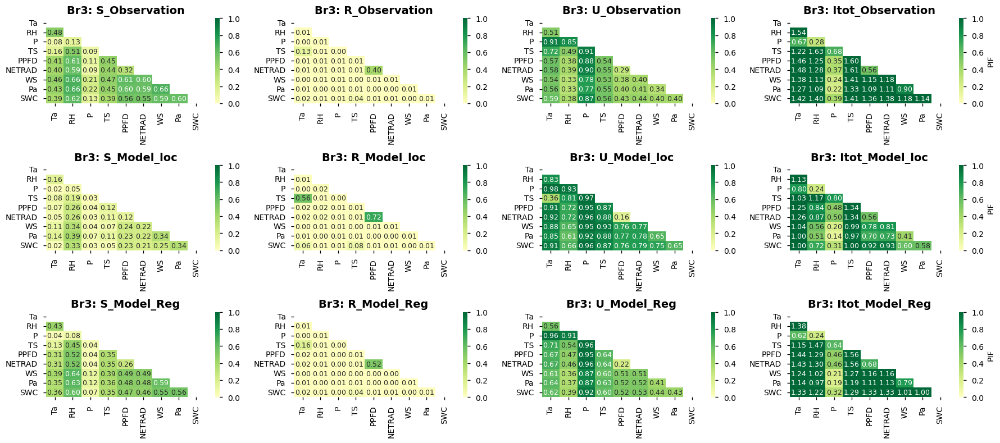

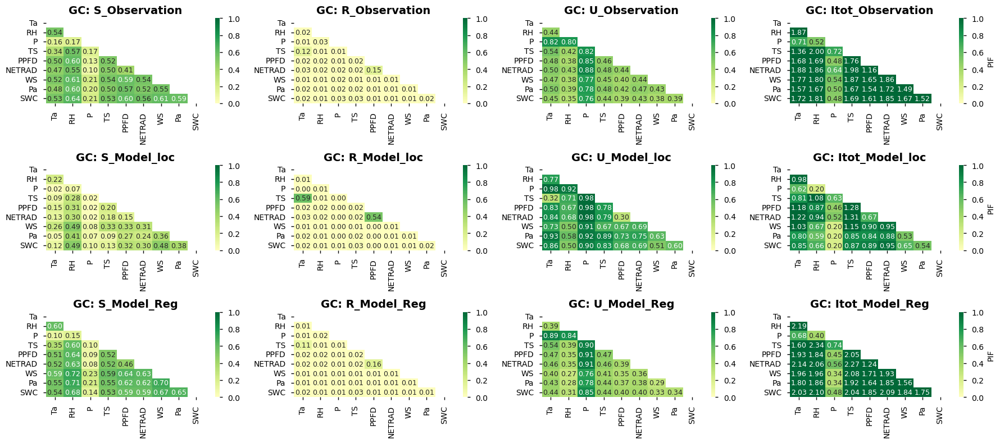

In [52]:
## The pairwise information flow:

print('The pairwise information flow for MLR model')
PIF_mlr,Itot_mlr,S_mlr,R_mlr,U_mlr=per.PIF(X_l_mlr,X_r_mlr, bins_model_mlr_l, bins_model_mlr_r)

print('The pairwise information flow for RF model')
PIF_rf,Itot_rf,S_rf,R_rf,U_rf=per.PIF(X_l_rf,X_r_rf, bins_model_rf_l,bins_model_rf_r)

print('The pairwise information flow for LSTM model')
PIF_lstm,Itot_lstm,S_lstm,R_lstm,U_lstm=per.PIF(X_l_lstm,X_r_lstm,bins_model_lstm_l,bins_model_lstm_r)


## Statistical Significance
We compute statistical significance of information measures (MI and I_tot) using a shuffled surrogates approach.

It provides a hypothesis test of whether a given measure (e.g. MI) is significant - and we can pick the level of significance (typically 3 or 4, which leads to over 99.5% or basically a p-value of < .05)

We use below function to get the critical value - for every I(X;Y) and every I(X1,X2;Y), we do the shuffled test, and if it's not statistically significant, we don't go farther!

In [34]:
def mutual_information_shuffle(dfi, source, target, bins,ntests=1):
    x = dfi[source].values
    y = dfi[target].values   
    mishuff=[]
    
    for _ in range(ntests+1):

        random.shuffle(x)
        random.shuffle(y)
        
        H_x = af.shannon_entropy([x], [bins])
        H_y = af.shannon_entropy([y], [bins])
        H_xy = af.shannon_entropy([x, y], [bins, bins])
        
        mishuff.append(H_x + H_y - H_xy)

    MI_crit = np.mean(mishuff)+ 3*np.std(mishuff)
    
    return MI_crit

def MI_LR_0(X_l,X_r, bins_model_l,bins_model_r):

    bins_obs =100
    MI=defaultdict(list)

    for k in X_l.keys():
        mi=np.zeros((len(X_l[k].columns)-2,3)) # 0:obs  1:local, 2: regional

        for i in range(len(X_l[k].columns)-2):
            mi[i,0] = mutual_information_shuffle(X_l[k], label[i],  'Fc_obs',  bins_obs)
            mi[i,1] = mutual_information_shuffle(X_l[k], label[i],  'Fc_model',  int(bins_model_l[k]))
            mi[i,2] = mutual_information_shuffle(X_r[k], label[i],  'Fc_model',  int(bins_model_r[k]))
            
        MI[k].append(mi)
        MI[k]= np.reshape(MI[k],[len(X_l[k].columns)-2,3]) 


    return MI



label = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC']
MI_crit_mlr= MI_LR_0(X_l_mlr,X_r_mlr,bins_model_mlr_l,bins_model_mlr_r)
MI_crit_rf= MI_LR_0(X_l_rf,X_r_rf,bins_model_rf_l,bins_model_rf_r)
MI_crit_lstm= MI_LR_0(X_l_lstm,X_r_lstm, bins_model_lstm_l,bins_model_lstm_r)

In [43]:
MI_crit_lstm[4][:,1]-MI_lstm[4][:,1]

array([-0.14962816, -0.5966026 , -0.16399948, -0.01748549, -0.5625679 ,
       -0.09034887, -0.49663644, -0.12983235, -0.06722587, -0.16835092])

In [49]:
def shannon_entropy(x, bins):
    c = np.histogramdd(x, bins)[0]
    p = c / np.sum(c)
    p = p[p > 0]
    h =  - np.sum(p * np.log2(p))
    return h

def mutual_information(dfi, source, target, bins):
    x = dfi[source].values
    y = dfi[target].values
    H_x = shannon_entropy([x], [bins])
    H_y = shannon_entropy([y], [bins])
    H_xy = shannon_entropy([x, y], [bins, bins])
    return H_x + H_y - H_xy

def conditional_mutual_information(dfi, source, target, condition, bins):
    x = dfi[source].values
    y = dfi[condition].values
    z = dfi[target].values
    H_y = shannon_entropy([y],[bins])
    H_z = shannon_entropy([z],[bins])
    H_xy = shannon_entropy([x, y],[bins, bins])
    H_zy = shannon_entropy([z, y],[bins, bins])
    H_xyz = shannon_entropy([x, y, z],[bins, bins, bins])    
    return H_xy + H_zy - H_y - H_xyz


def interaction_information(mi_c, mi):
    i = mi_c - mi
    return i

def normalized_source_dependency(mi_s1_s2, H_s1, H_s2):
    i = mi_s1_s2 / np.min([H_s1, H_s2])
    return i

def redundant_information_bounds(mi_s1_tar, mi_s2_tar, interaction_info):
    r_mmi = np.min([mi_s1_tar, mi_s2_tar])
    r_min = np.max([0, - interaction_info])
    return r_mmi, r_min

def rescaled_redundant_information(mi_s1_s2, H_s1, H_s2, mi_s1_tar, mi_s2_tar, interaction_info):
    norm_s_dependency = normalized_source_dependency(mi_s1_s2, H_s1, H_s2)
    r_mmi, r_min = redundant_information_bounds(mi_s1_tar, mi_s2_tar, interaction_info)
    return r_min + norm_s_dependency * (r_mmi - r_min)

def information_partitioning_shuffle(df_origin, source_1, source_2, target, bins,ntests=0):
    x = df_origin[source_1].values
    y = df_origin[source_2].values
    z = df_origin[target].values
    df=df_origin
    Ishuff=np.zeros(ntests+1)
    
    for i in range(0,ntests+1):
    
        random.shuffle(x)
        random.shuffle(y)
        random.shuffle(z)

        df[source_1] = x
        df[source_2] = y
        df[target] = z

        H_s1 = shannon_entropy(df[source_1].values, [bins]) #Hx1
        H_s2 = shannon_entropy(df[source_2].values, [bins]) #Hx2
        mi_s1_s2 = mutual_information(df, source_1, source_2, bins) #I_x1x2
        mi_s1_tar = mutual_information(df, source_1, target, bins) #I_x1y
        mi_s2_tar = mutual_information(df, source_2, target, bins) #I_x2y
        mi_s1_tar_cs2 = conditional_mutual_information(df, source_1, target, source_2, bins) #I(Xs1,Xtar|Xs2)
        interaction_info = interaction_information(mi_s1_tar_cs2, mi_s1_tar) #S-R
        redundant = rescaled_redundant_information(mi_s1_s2, H_s1, H_s2, mi_s1_tar, mi_s2_tar, interaction_info)
        unique_s1 = mi_s1_tar - redundant
        unique_s2 = mi_s2_tar - redundant
        synergistic = interaction_info + redundant
        total_information = unique_s1 + unique_s2 + redundant + synergistic
        
        Ishuff[i] = total_information
        
    I_crit = np.mean(Ishuff)+ 3*np.std(Ishuff)

    return I_crit

def I_LR_0(X_l,X_r, bins_model_l,bins_model_r):

    bins_obs =100
    Itot=defaultdict(list)

    for k in X_l.keys():
        itot = np.zeros((len(label), len(label), 2)) # 0:obs  1:local, 2: regional

        for i in range(0, len(label)):
            for j in range(0, len(label)):
                
                itot[i,j,0] = information_partitioning_shuffle(X_l[k], label[i], label[j], 'Fc_obs', bins_obs)
                itot[i,j,1] = information_partitioning_shuffle(X_l[k], label[i], label[j], 'Fc_model', int(bins_model_l[k]))
#                 itot[i,j,2] = information_partitioning_shuffle(X_r[k], label[i], label[j], 'Fc_model', int(bins_model_r[k]))
                
        Itot[k].append(itot)

    return Itot



In [51]:
# Itot_crit_mlr=I_LR_0(X_l_mlr,X_r_mlr,bins_model_mlr_l, bins_model_mlr_r)
# Itot_crit_rf=I_LR_0(X_l_rf,X_r_rf,bins_model_rf_l,bins_model_rf_r)
# Itot_crit_lstm=I_LR_0(X_l_lstm,X_r_lstm,bins_model_lstm_l,bins_model_lstm_r)

In [ ]:
Itot_crit_mlr[4][:,1]-Itot_mlr[4][:,1]

In [424]:
from importlib import reload
reload(per)

<module 'Performance' from "C:\\Users\\askarzam\\OneDrive - The University of Colorado Denver\\Mozghan_share - Goodwell, Allison's files\\Theme2\\code\\Python\\Performance.py">

## The pairwise component level

The pairwise component level performance for MLR model


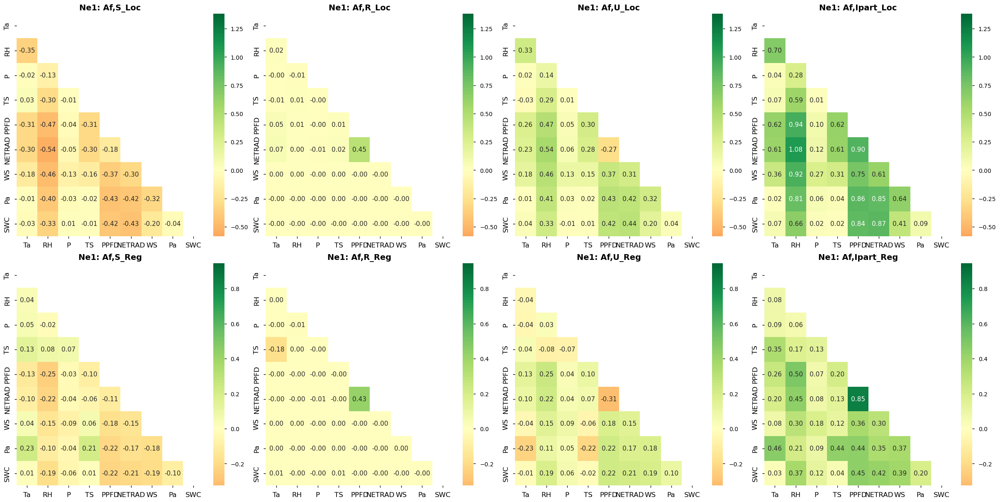

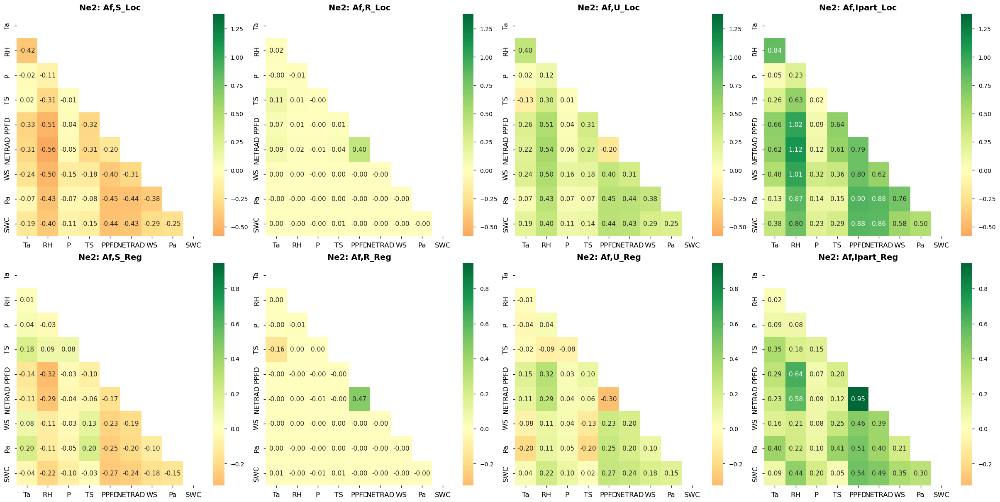

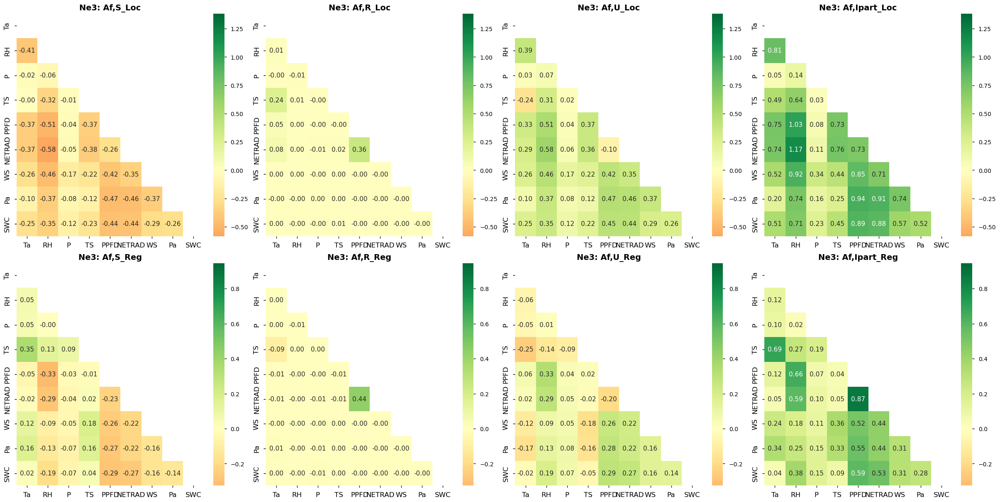

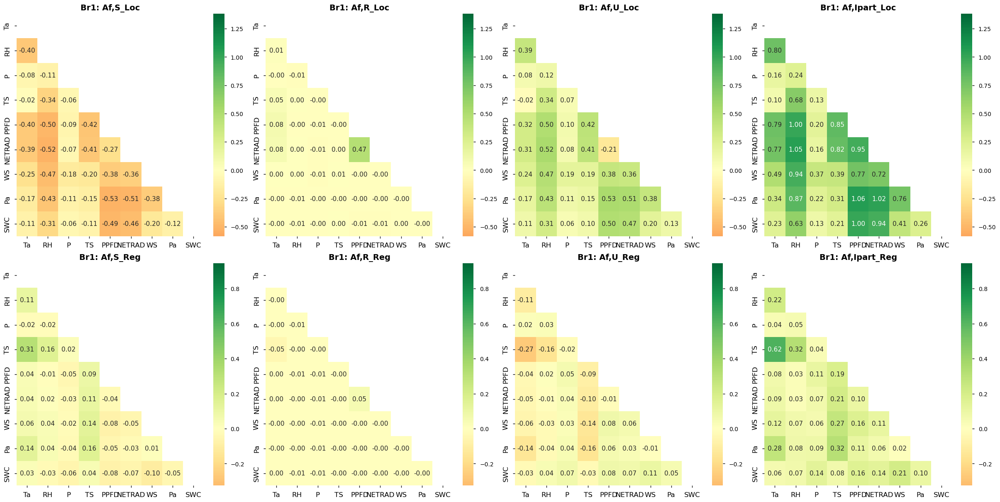

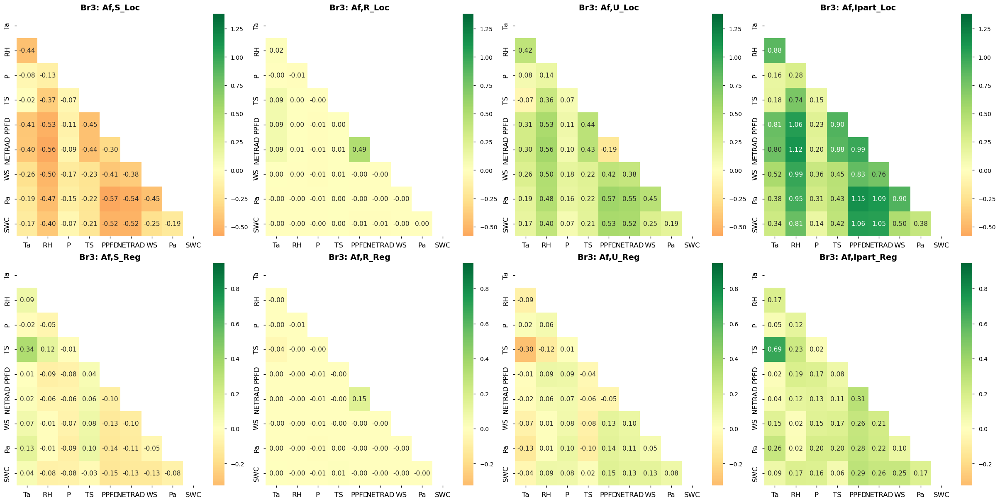

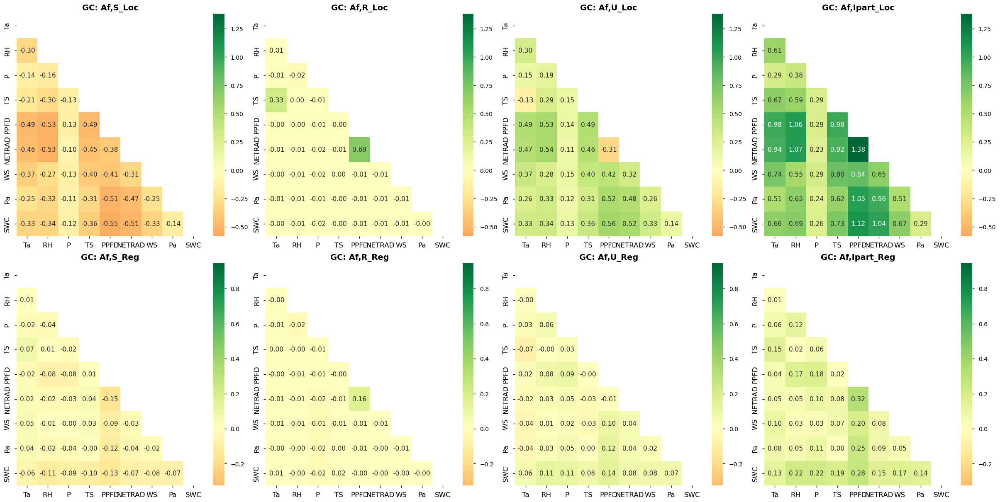

In [53]:
print('The pairwise component level performance for MLR model')
Af_PID_mlr,Af_mlr_l,Af_mlr_r=per.Af_PID(X_l_mlr, S_mlr,R_mlr,U_mlr)

The pairwise component level performance for RF model


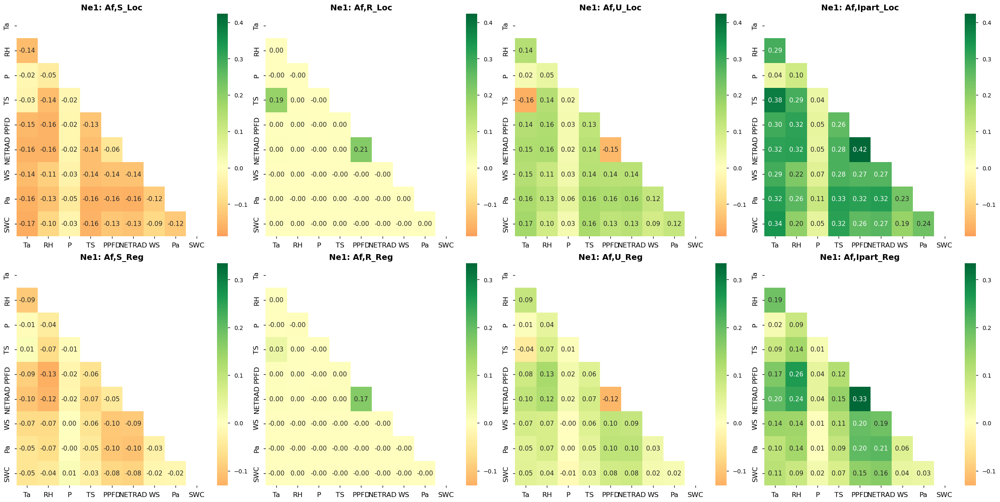

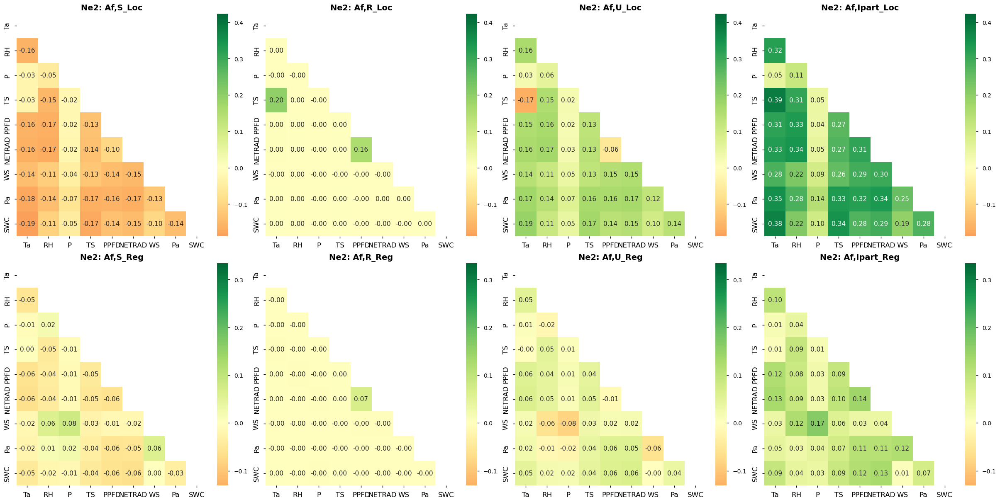

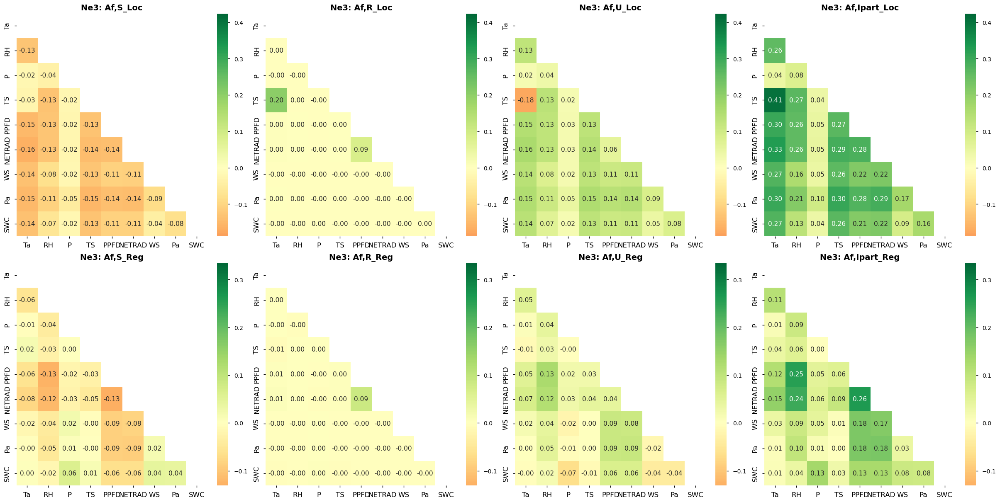

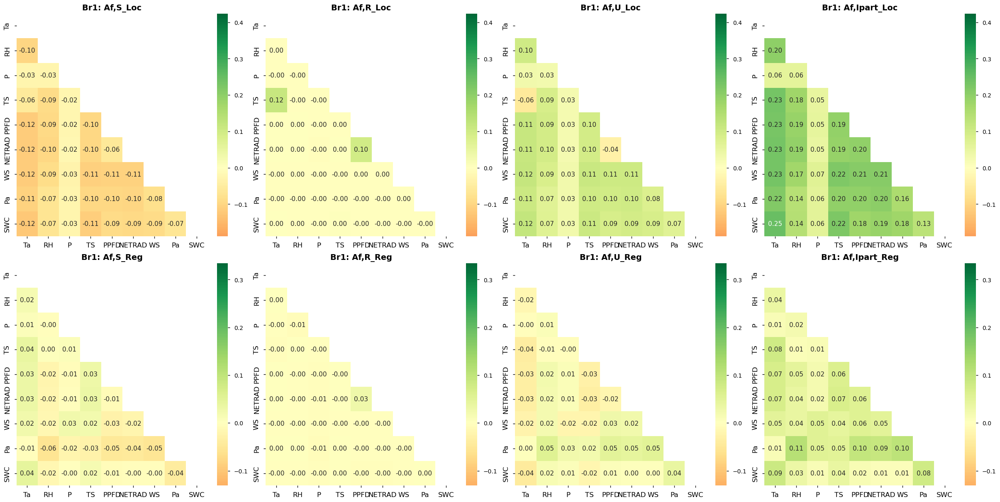

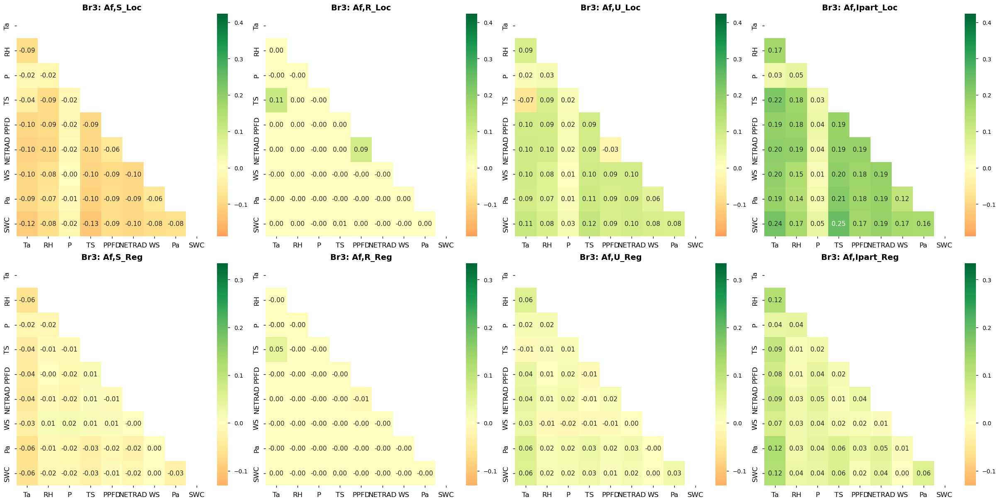

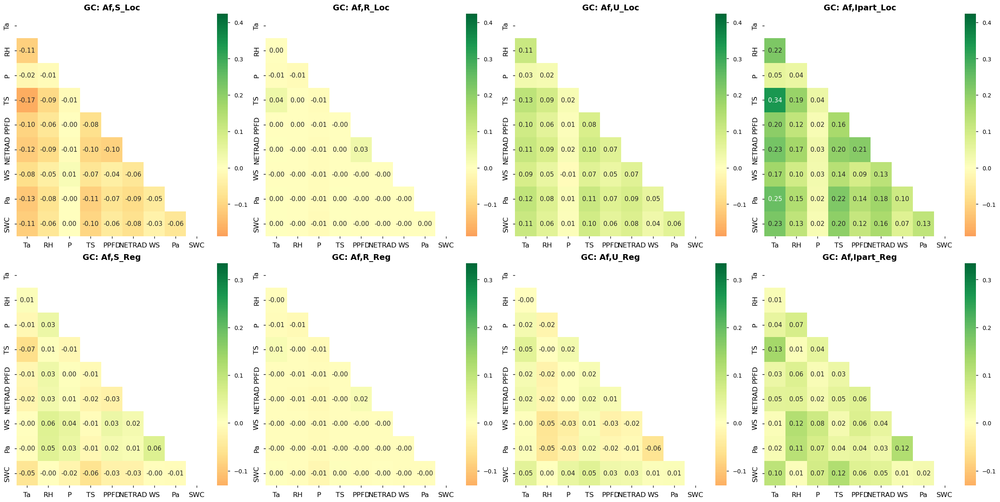

In [54]:
print('The pairwise component level performance for RF model')
Af_PID_rf,Af_rf_l,Af_rf_r =per.Af_PID(X_l_rf, S_rf,R_rf,U_rf)

The pairwise component level performance for LSTM model


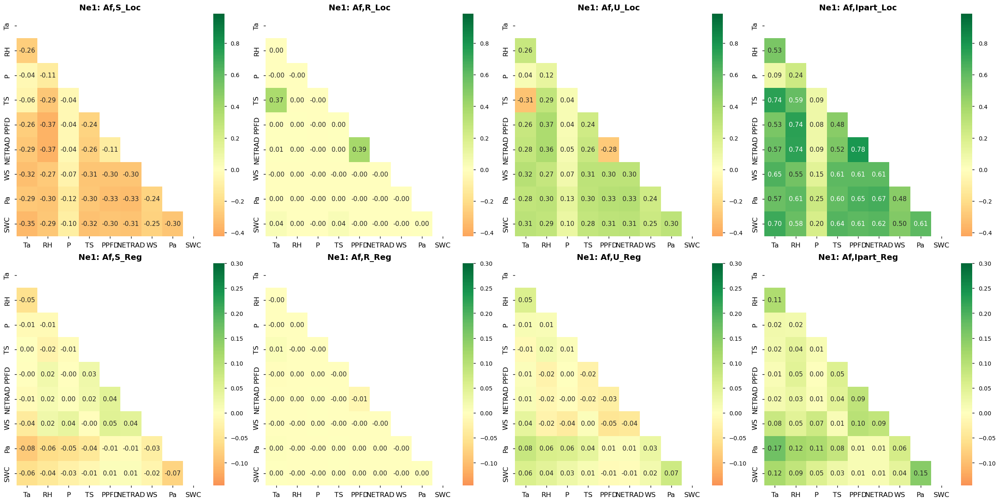

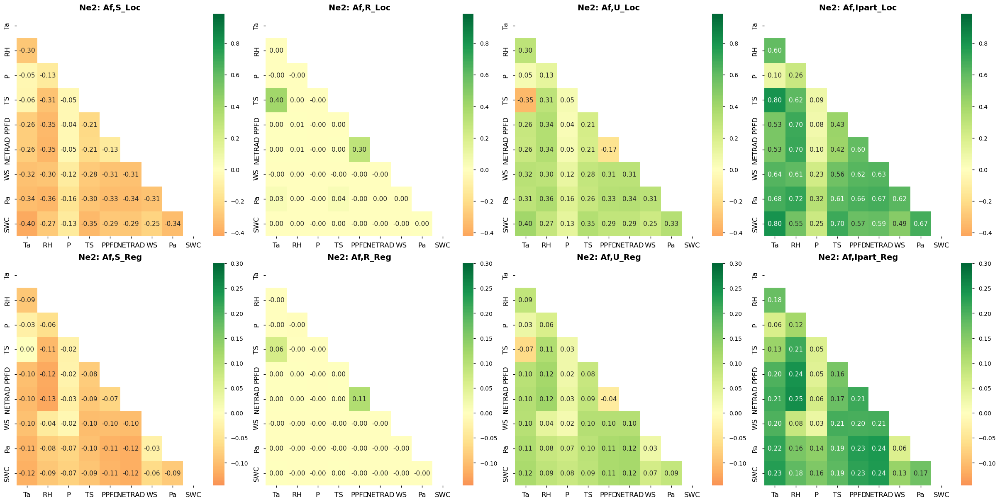

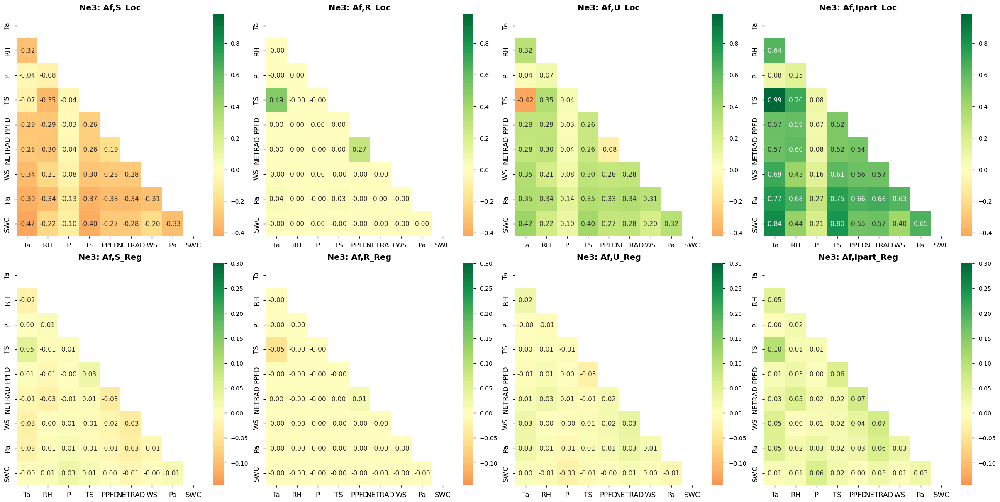

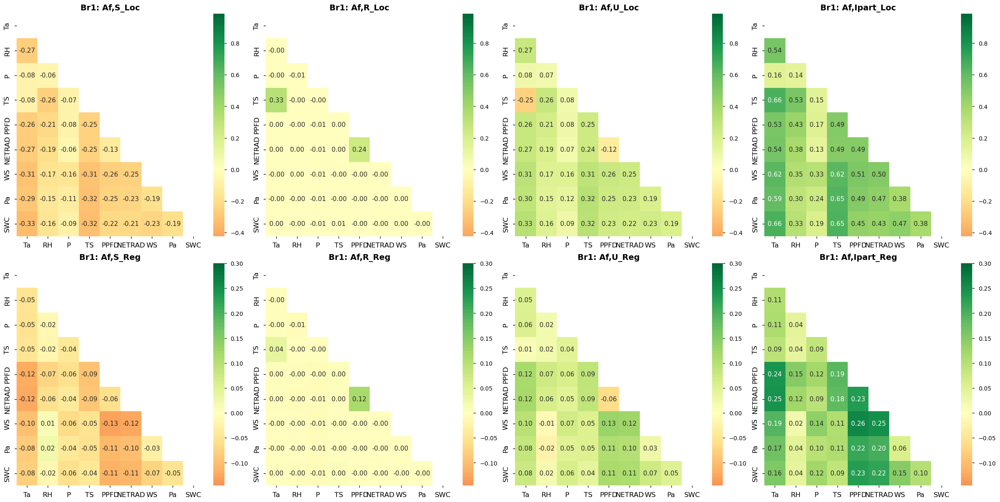

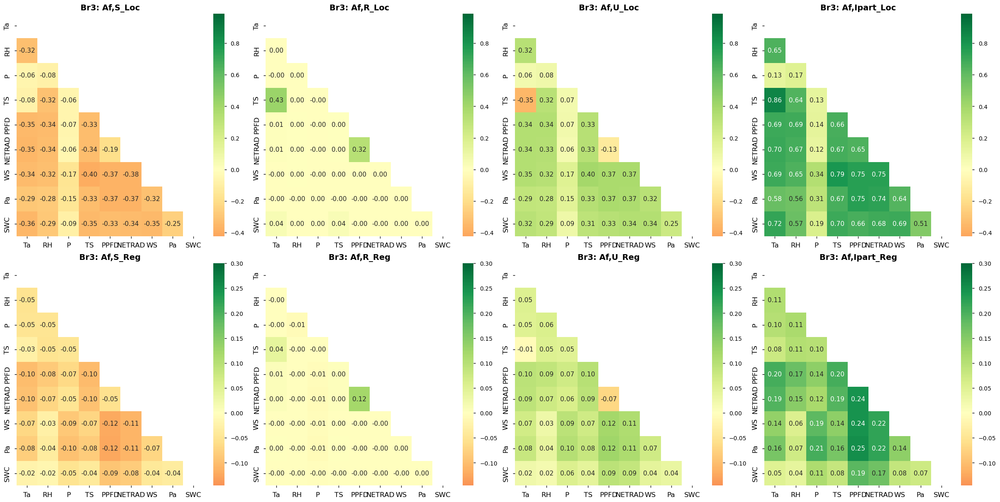

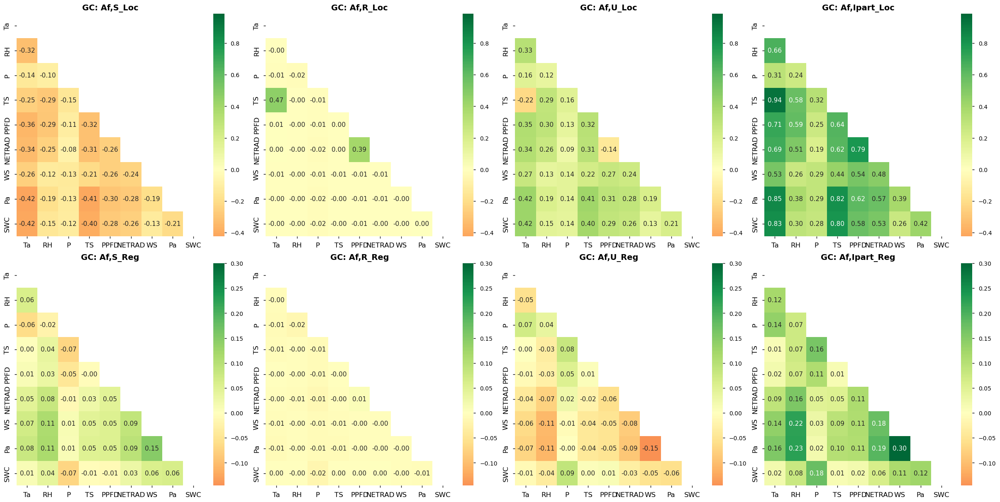

In [55]:
print('The pairwise component level performance for LSTM model')
Af_PID_lstm,Af_lstm_l,Af_lstm_r =per.Af_PID(X_l_lstm, S_lstm,R_lstm,U_lstm)

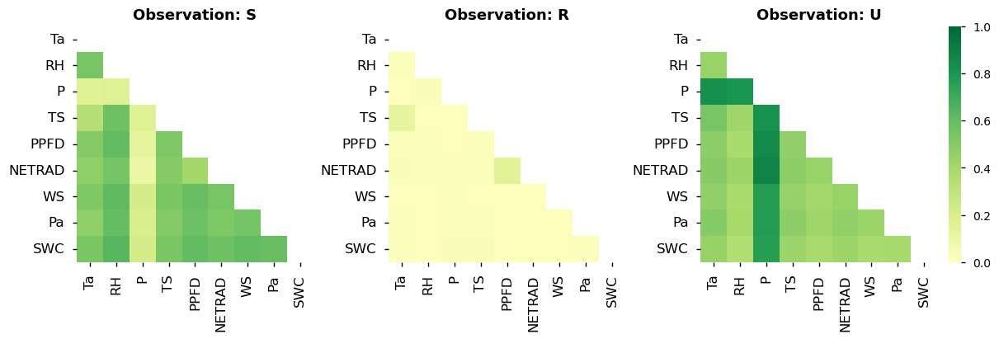

In [56]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), layout='constrained')
label = ['Ta', 'RH', 'P', 'TS', 'PPFD', 'NETRAD', 'WS', 'Pa', 'SWC']
fmt='.2f'
cmap='RdYlGn'
center=0

mask_S = np.triu(np.ones_like(S_mlr[5][:,:,0]))
sns.heatmap( S_mlr[5][:,:,0], xticklabels=label, yticklabels=label, fmt=fmt, cmap=cmap, vmin=0, vmax=1, center=center,
            cbar=False, annot=None, mask=mask_S, ax=axs[0], annot_kws={"fontsize": 9}, cbar_kws=None)
axs[0].set_title('Observation: S', fontsize=13, fontweight='bold')
axs[0].tick_params(axis='both', which='major', labelsize=12)

mask_R = np.triu(np.ones_like(R_mlr[5][:,:,0]))
sns.heatmap( R_mlr[5][:,:,0], xticklabels=label, yticklabels=label, fmt=fmt, cmap=cmap, center=center,
            cbar=False, annot=None, mask=mask_R, ax=axs[1], annot_kws={"fontsize": 9}, vmin=0, vmax=1, cbar_kws=None)
axs[1].set_title('Observation: R', fontsize=13, fontweight='bold')
axs[1].tick_params(axis='both', which='major', labelsize=12)


mask_U = np.triu(np.ones_like(U_mlr[5][:,:,0]))
sns.heatmap( U_mlr[5][:,:,0], xticklabels=label, yticklabels=label, fmt=fmt, cmap=cmap, center=center,
            cbar=True, annot=None, mask=mask_U, ax=axs[2], annot_kws={"fontsize": 9}, vmin=0, vmax=1, cbar_kws=None)
axs[2].set_title('Observation: U', fontsize=13, fontweight='bold')
axs[2].tick_params(axis='both', which='major', labelsize=12)





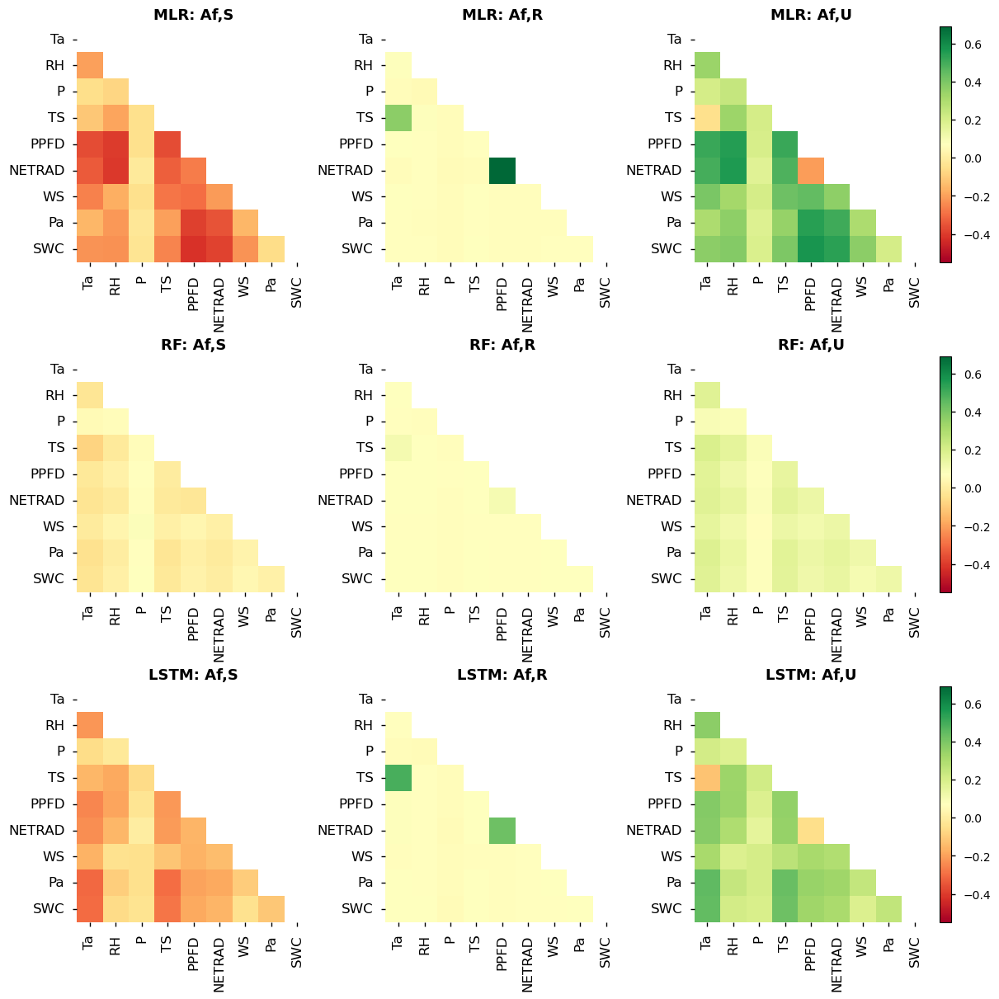

In [57]:
# Local
Af_l=[Af_mlr_l, Af_rf_l, Af_lstm_l]
from matplotlib.colors import Normalize
vmin = min(np.min(Af_l[i][dic][5]) for dic in ['Af,S', 'Af,R', 'Af,U'] for i in [0,1,2])
vmax =max(np.max(Af_l[i][dic][5]) for dic in ['Af,S', 'Af,R', 'Af,U'] for i in [0,1,2])
model=['MLR', 'RF', 'LSTM']
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12), layout='constrained')
norm_l = Normalize(vmin=vmin, vmax=vmax)
for i in [0,1,2]:
    for j, dic in enumerate(['Af,S', 'Af,R', 'Af,U']):
        mask = np.triu(np.ones_like(Af_l[i][dic][5]))
        
        sns.heatmap(Af_l[i][dic][5], xticklabels=label, yticklabels=label, cbar=False,\
                    fmt='.2f',cmap='RdYlGn', center=0, annot=None, mask=mask, ax=axs[i, j], annot_kws={"fontsize": 11}, vmin=vmin, vmax=vmax)
        axs[i, j].set_title(f"{model[i]}: {dic}", fontsize=13, fontweight='bold')
        axs[i, j].tick_params(axis='both', which='major', labelsize=12)

 # Add a single colorbar
fig.colorbar(plt.cm.ScalarMappable(norm=norm_l, cmap='RdYlGn'), ax=axs[0,2], location="right")
fig.colorbar(plt.cm.ScalarMappable(norm=norm_l, cmap='RdYlGn'), ax=axs[1,2], location="right")
fig.colorbar(plt.cm.ScalarMappable(norm=norm_l, cmap='RdYlGn'), ax=axs[2,2], location="right")

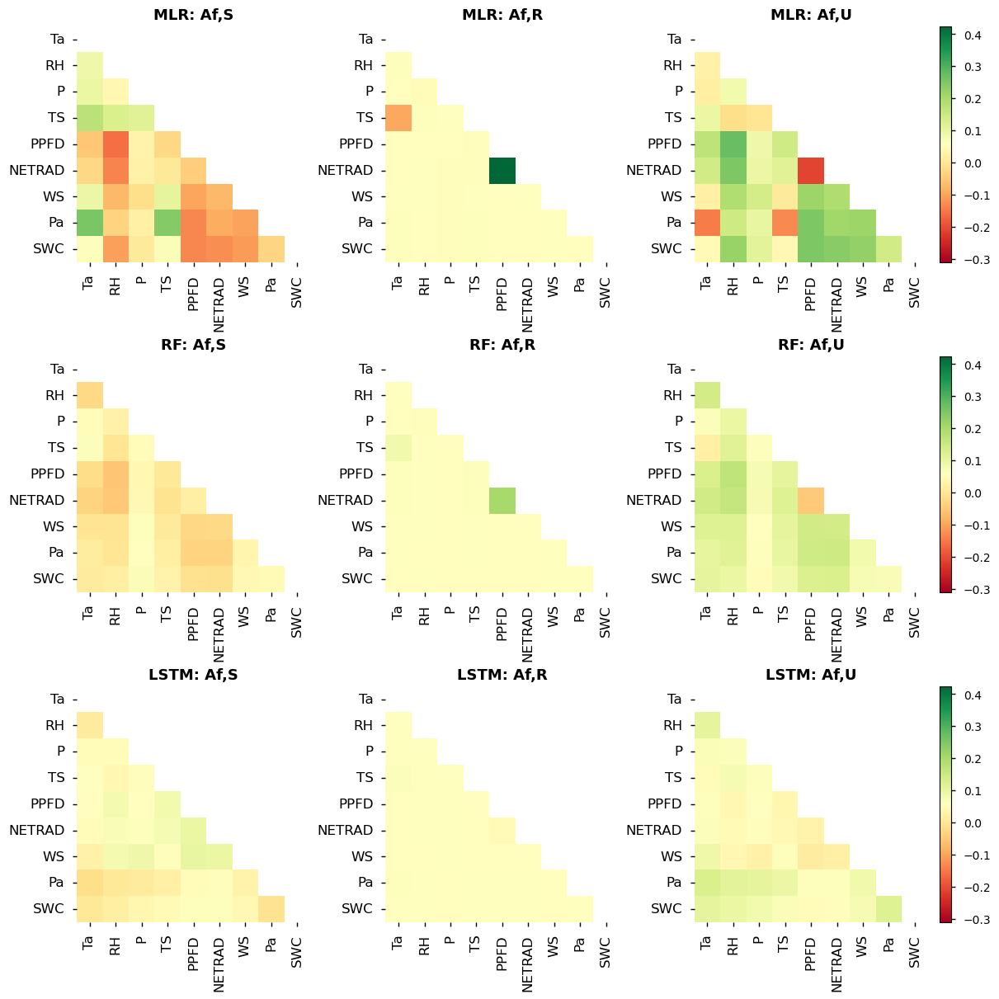

In [58]:
# Regional
Af_r=[Af_mlr_r, Af_rf_r, Af_lstm_r]
vmin = min(np.min(Af_r[i][dic][0]) for dic in ['Af,S', 'Af,R', 'Af,U'] for i in [0,1,2])
vmax =max(np.max(Af_r[i][dic][0]) for dic in ['Af,S', 'Af,R', 'Af,U'] for i in [0,1,2])
model=['MLR', 'RF', 'LSTM']
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12), layout='constrained')
norm_r = Normalize(vmin=vmin, vmax=vmax)
for i in [0,1,2]:
    for j, dic in enumerate(['Af,S', 'Af,R', 'Af,U']):
        mask = np.triu(np.ones_like(Af_r[i][dic][0]))
        
        sns.heatmap(Af_r[i][dic][0], xticklabels=label, yticklabels=label, cbar=False,\
                    fmt='.2f',cmap='RdYlGn', center=0, annot=None, mask=mask, ax=axs[i, j], annot_kws={"fontsize": 11}, vmin=vmin, vmax=vmax)
        axs[i, j].set_title(f"{model[i]}: {dic}", fontsize=13, fontweight='bold')
        axs[i, j].tick_params(axis='both', which='major', labelsize=12)

 # Add a single colorbar
fig.colorbar(plt.cm.ScalarMappable(norm=norm_r, cmap='RdYlGn'), ax=axs[0,2], location="right")
fig.colorbar(plt.cm.ScalarMappable(norm=norm_r, cmap='RdYlGn'), ax=axs[1,2], location="right")
fig.colorbar(plt.cm.ScalarMappable(norm=norm_r, cmap='RdYlGn'), ax=axs[2,2], location="right")

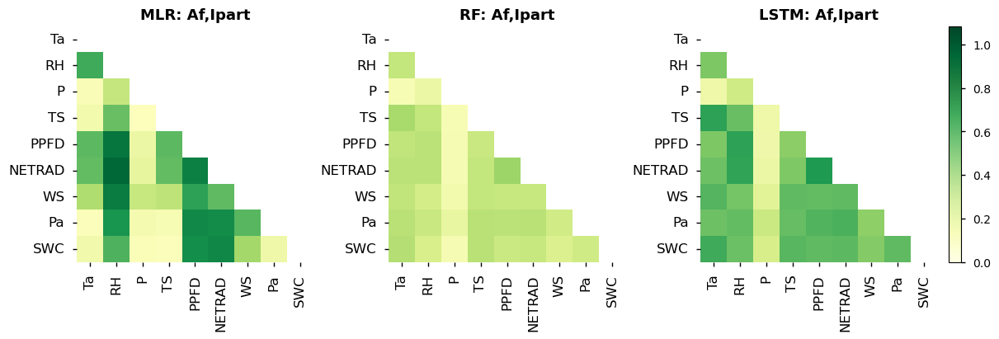

In [59]:
Af_l=[Af_mlr_l, Af_rf_l, Af_lstm_l]
Vmin = min(np.min(Af_l[i]['Af,Ipart'][0]) for i in [0,1,2])
Vmax =max(np.max(Af_l[i]['Af,Ipart'][0]) for i in [0,1,2])
model=['MLR', 'RF', 'LSTM']
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), layout='constrained')
norm_l = Normalize(vmin=Vmin, vmax=Vmax)
for i in [0,1,2]:

    mask = np.triu(np.ones_like(Af_l[i]['Af,Ipart'][0]))

    sns.heatmap(Af_l[i]['Af,Ipart'][0], xticklabels=label, yticklabels=label, cbar=False,\
                fmt='.2f',cmap='RdYlGn', center=0, annot=None, mask=mask, ax=axs[i], annot_kws={"fontsize": 11}, vmin=0, vmax=1)
    axs[i].set_title(f"{model[i]}: {'Af,Ipart'}", fontsize=13, fontweight='bold')
    axs[i].tick_params(axis='both', which='major', labelsize=12)

 # Add a single colorbar
fig.colorbar(plt.cm.ScalarMappable(norm=norm_l, cmap='YlGn'), ax=axs[2], location="right")


## The model level

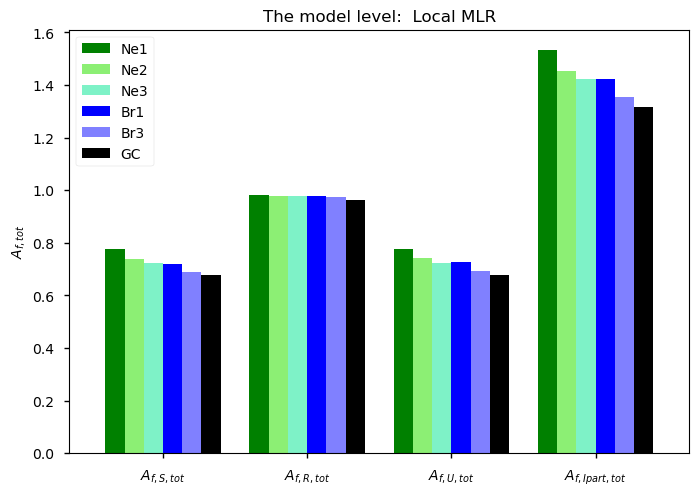

<Figure size 800x550 with 0 Axes>

In [60]:
dataset= ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']

    
X=X_l_mlr
Af1=Af_mlr_l
model_name=' Local MLR'
exp='L'

Af_Model =defaultdict(list)

AfS=Af1['Af,S']
AfR=Af1['Af,R']
AfU=Af1['Af,U']
AfIpart=Af1['Af,Ipart']

for i in X.keys():
    AfS[i]=(np.triu(AfS[i], k=1)).reshape(1,81)  #  replace with . flatten()
    AfR[i]=(np.triu(AfR[i], k=1)).reshape(1,81)
    AfU[i]=(np.triu(AfU[i], k=1)).reshape(1,81)
    AfIpart[i]=(np.triu(AfIpart[i], k=1)).reshape(1,81)

    Af_Model[i]= pd.DataFrame([AfS[i][np.nonzero(AfS[i])], AfR[i][np.nonzero(AfR[i])],\
                               AfU[i][np.nonzero(AfU[i])],AfIpart[i][np.nonzero(AfIpart[i])]])


Af_M_1 = pd.DataFrame({key: (1 - np.abs([Af_Model[key].loc[i] for i in [0, 1, 2]])).sum(axis=1)\
                       / Af_Model[0].shape[1] for key in X})
Af_M_2 = pd.DataFrame({key: (2 - Af_Model[key].loc[3]).sum()/ Af_Model[0].shape[1] for key in X}, index=[3])


if exp=='L':

    Af_M_1= Af_M_1.rename(columns={0: "Ne1", 1: "Ne2",2: "Ne3", 3: "Br1", 4: "Br3", 5: "GC"},\
                index={0: "$A_{f,S,tot}$", 1: "$A_{f,R,tot}$", 2: "$A_{f,U,tot}$"})
    Af_M_2= Af_M_2.rename(columns={0: "Ne1", 1: "Ne2",2: "Ne3", 3: "Br1", 4: "Br3", 5: "GC"},\
                index={3: "$A_{f,Ipart,tot}$"})
else:

    Af_M_1= Af_M_1.rename(columns={0: "Ne1_r", 1: "Ne2_r",2: "Ne3_r", 3: "Br1_r", 4: "Br3_r", 5: "GC_r"},\
                index={0: "$A_{f,S,tot}$", 1: "$A_{f,R,tot}$", 2: "$A_{f,U,tot}$"})
    Af_M_2= Af_M_2.rename(columns={0: "Ne1_r", 1: "Ne2_r",2: "Ne3_r", 3: "Br1_r", 4: "Br3_r", 5: "GC_r"},\
                index={3:"$A_{f,Ipart,tot}$"})


Af_M = Af_M_1.append(Af_M_2, ignore_index = False)



Af_M.plot(kind='bar', align='center', width=0.8, color = ['#008000', '#8CEF74', '#7EF2C7','#0000FF','#8080FF','black'])
X_axis = np.arange(4)
plt.legend(dataset)
plt.ylabel("$A_{f,tot}$ ",fontweight='bold')
plt.xticks(X_axis, ["$A_{f,S,tot}$", "$A_{f,R,tot}$", "$A_{f,U,tot}$", "$A_{f,Ipart,tot}$"], rotation=0)
plt.title('The model level: '+ model_name)
Af_Model_fig = plt.figure()

plt.show()





In [129]:
Af_Model[0].shape[1]

36

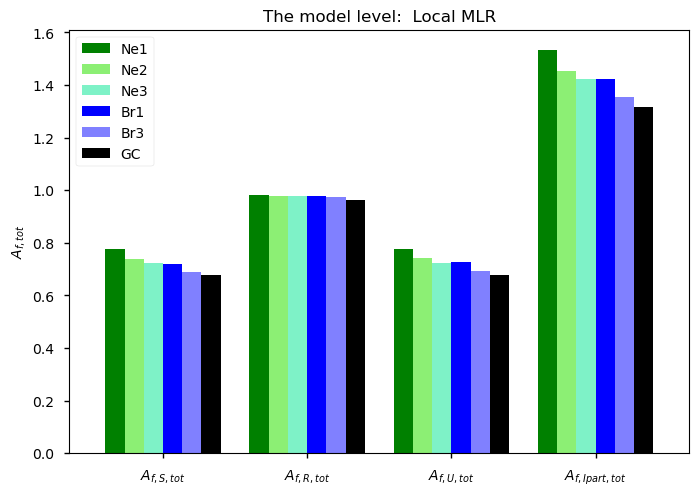

<Figure size 800x550 with 0 Axes>

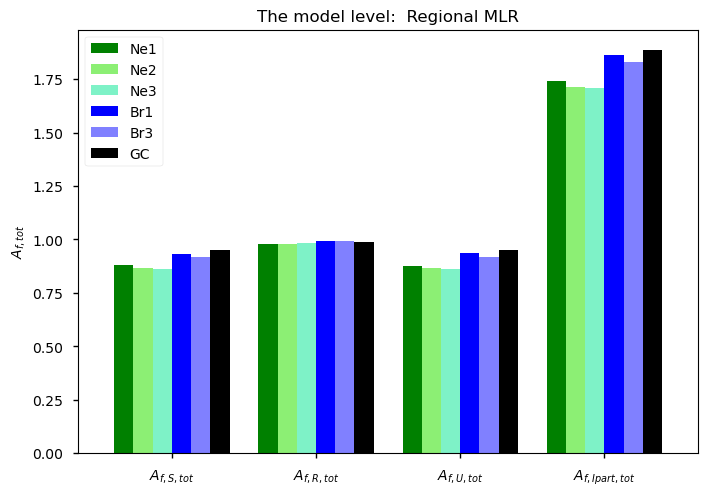

<Figure size 800x550 with 0 Axes>

In [61]:
from importlib import reload
reload(per)

Af_Model_mlr_l, Af_Model_fig_mlr_l=per.Af_Model(X_l_mlr,Af_mlr_l,' Local MLR','L')
Af_Model_mlr_r, Af_Model_fig_mlr_r=per.Af_Model(X_r_mlr,Af_mlr_r,' Regional MLR','R')
Af_Model_mlr= (Af_Model_mlr_l).append(Af_Model_mlr_r)
Af_Model_mlr.index = pd.MultiIndex.from_arrays([Af_Model_mlr.index, ['MLR'] * len(Af_Model_mlr.index)])


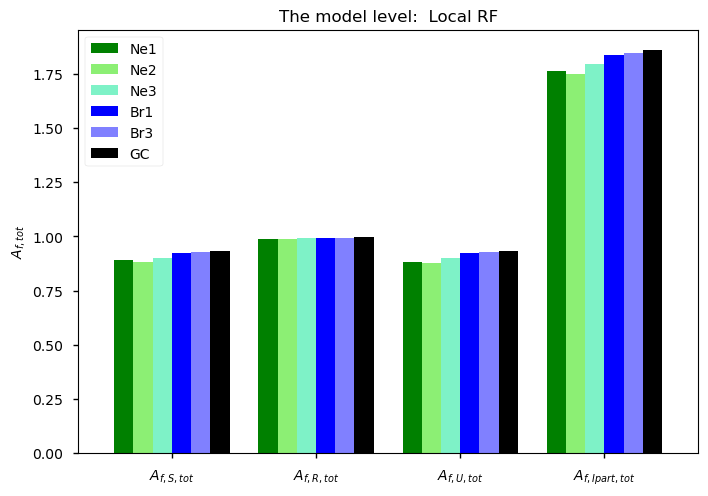

<Figure size 800x550 with 0 Axes>

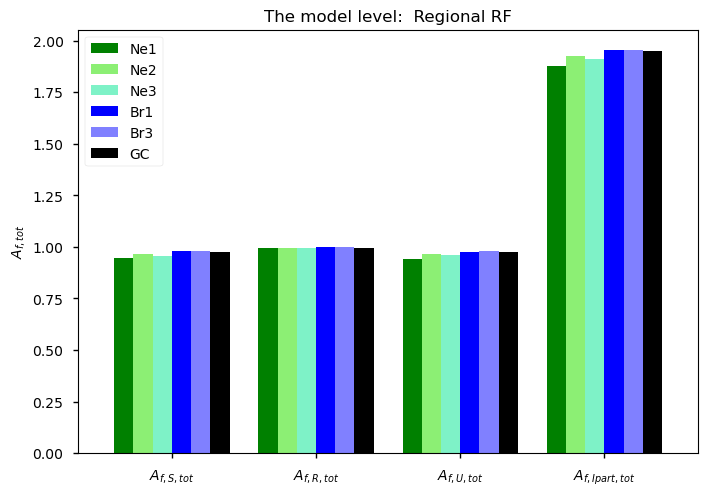

<Figure size 800x550 with 0 Axes>

In [62]:
# from importlib import reload
# reload(per)
Af_Model_rf_l, Af_Model_fig_rf_l=per.Af_Model(X_l_rf,Af_rf_l,' Local RF','L')
Af_Model_rf_r, Af_Model_fig_rf_r=per.Af_Model(X_r_rf,Af_rf_r,' Regional RF','R')

Af_Model_rf= (Af_Model_rf_l).append(Af_Model_rf_r)
Af_Model_rf.index = pd.MultiIndex.from_arrays([Af_Model_rf.index, ['RF'] * len(Af_Model_rf.index)])


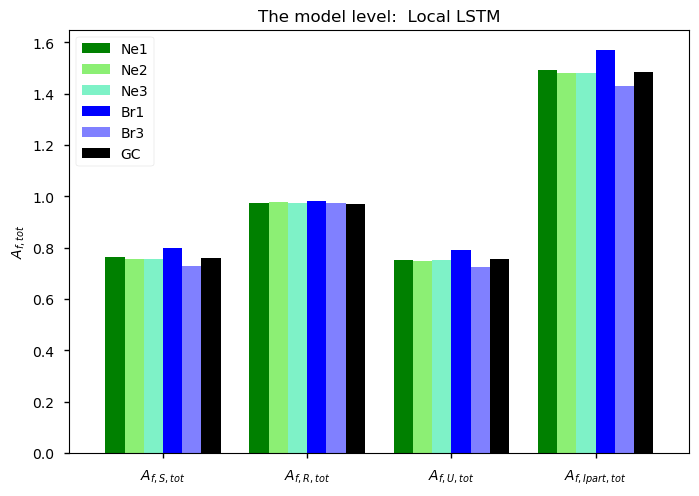

<Figure size 800x550 with 0 Axes>

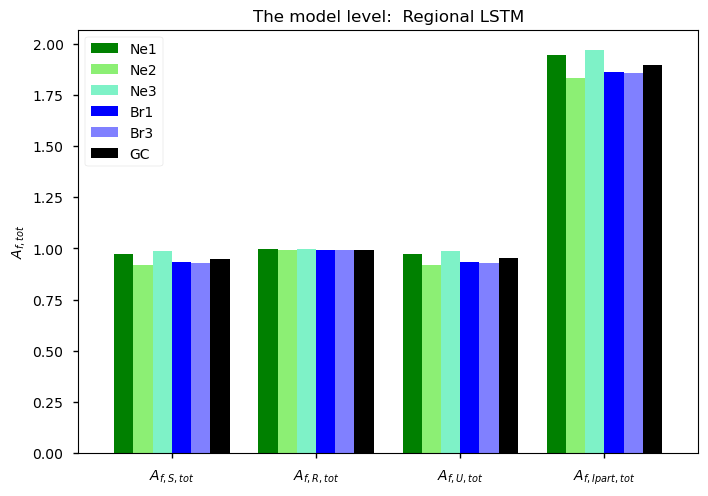

<Figure size 800x550 with 0 Axes>

In [63]:
Af_Model_lstm_l, Af_Model_fig_lstm_l=per.Af_Model(X_l_lstm,Af_lstm_l,' Local LSTM','L')
Af_Model_lstm_r, Af_Model_fig_lstm_r=per.Af_Model(X_r_lstm,Af_lstm_r,' Regional LSTM','R')

Af_Model_lstm= (Af_Model_lstm_l).append(Af_Model_lstm_r)
Af_Model_lstm.index = pd.MultiIndex.from_arrays([Af_Model_lstm.index, ['LSTM'] * len(Af_Model_lstm.index)])


In [64]:
af_Mi_tot=[Af_Mi_mlr_tot[:,0],Af_Mi_rf_tot[:,0],Af_Mi_lstm_tot[:,0], Af_Mi_mlr_tot[:,1], Af_Mi_rf_tot[:,1],Af_Mi_lstm_tot[:,1]]
af_Mi_tot

[array([ 0.14243939,  0.12147197,  0.15421031,  0.04223032, -0.10941091,
         0.19612055]),
 array([0.87457986, 0.78021847, 0.85731533, 0.90517414, 0.89052894,
        0.89105207]),
 array([0.49334153, 0.1874154 , 0.4546408 , 0.63601123, 0.70018528,
        0.55537145]),
 array([0.59208269, 0.53878311, 0.50500108, 0.50949895, 0.50390108,
        0.4714931 ]),
 array([0.80980266, 0.74909835, 0.72255862, 0.83179666, 0.84333559,
        0.74995852]),
 array([0.8438813 , 0.80922751, 0.753386  , 0.77164842, 0.81636115,
        0.7683659 ])]

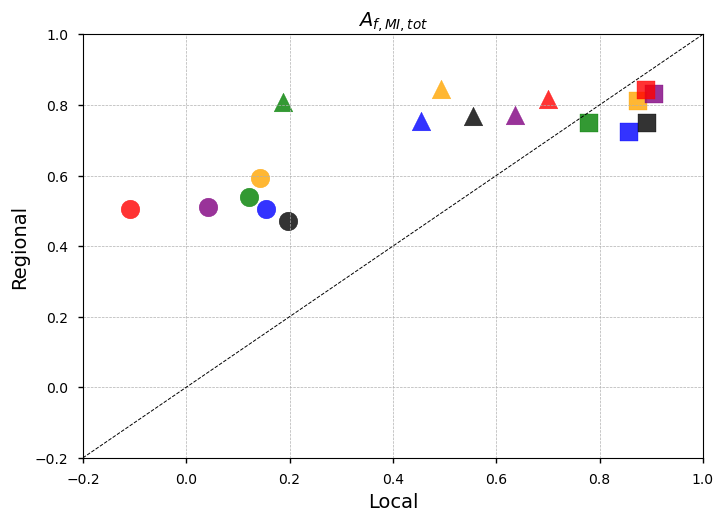

In [65]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter((af_Mi_tot[i][j]), (af_Mi_tot[i+3][j]), alpha=0.8, 
                    s=180, marker=markers[i], color = colors[j] )
            

plt.xlabel("Local",fontsize= 14)
plt.ylabel("Regional",fontsize= 14)

plt.xlim(-0.2, 1)  
plt.ylim(-0.2, 1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((-0.3, -0.3), (0.3, 0.3), linewidth=0.7, linestyle='--', color='k')  
plt.title('$A_{f,MI,tot}$',fontsize= 14)
plt.show()





In [66]:
Af_Model= Af_Model_mlr.append([Af_Model_rf,Af_Model_lstm])

In [67]:
afmodels=[Af_Model_mlr_l,Af_Model_rf_l,Af_Model_lstm_l, Af_Model_mlr_r, Af_Model_rf_r,Af_Model_lstm_r]

In [68]:
import matplotlib.ticker as ticker


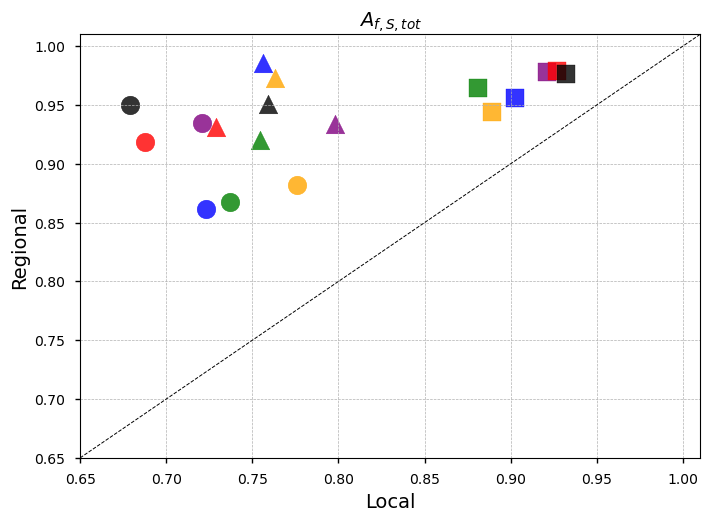

In [69]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

# Define metrics along with their marker styles
metrics = {
    '$A_{f,S,tot}$': {'facecolor': 'full', 'linewidth': 1},
    '$A_{f,R,tot}$': {'facecolor': 'none', 'linewidth': 2},
    '$A_{f,U,tot}$': {'facecolor': 'none', 'linewidth': 1}}

for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter(afmodels[i]['$A_{f,S,tot}$'][site], afmodels[i+3]['$A_{f,S,tot}$'][site+'_r'], alpha=0.8, 
                    s=180, marker=markers[i], 
                    color = colors[j])
            
plt.xlabel("Local",fontsize= 14)
plt.ylabel("Regional",fontsize= 14)
plt.title('$A_{f,S,tot}$',fontsize= 14)
plt.xlim(0.65,1.01)  
plt.ylim(0.65, 1.01)
plt.gca().xaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f"))  # Format x-axis
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f")) 
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((0.6, 0.6), (1.01, 1.01), linewidth=0.7, linestyle='--', color='k')  
plt.show()

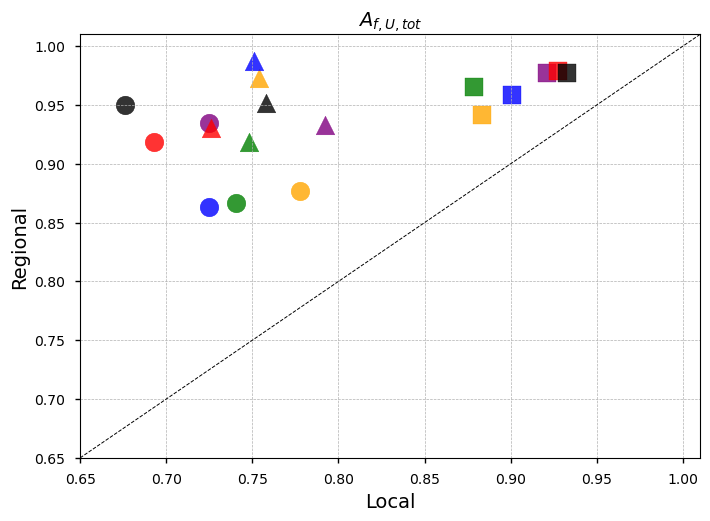

In [70]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter(afmodels[i]['$A_{f,U,tot}$'][site], afmodels[i+3]['$A_{f,U,tot}$'][site+'_r'], alpha=0.8, 
                    s=180, marker=markers[i], 
                    color = colors[j])
            
plt.xlabel("Local",fontsize= 14)
plt.ylabel("Regional",fontsize= 14)
plt.title('$A_{f,U,tot}$',fontsize= 14)
plt.xlim(0.65,1.01)  
plt.ylim(0.65, 1.01)

plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((0.6, 0.6), (1, 1), linewidth=0.7, linestyle='--', color='k')  
plt.show()

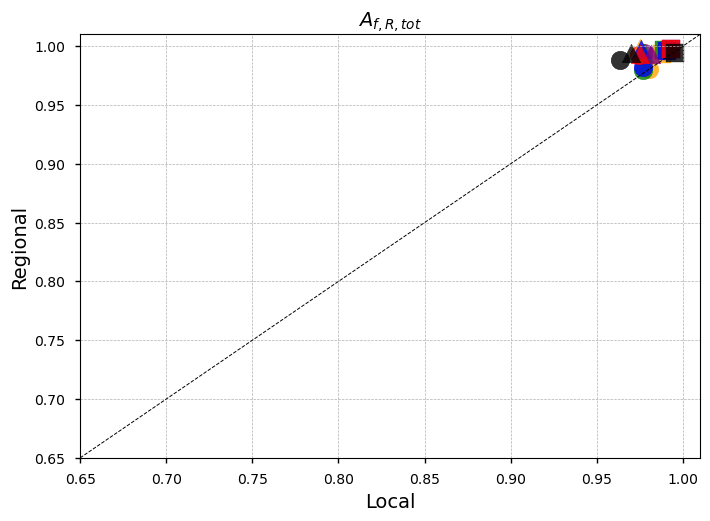

In [71]:
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model type

for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter(afmodels[i]['$A_{f,R,tot}$'][site], afmodels[i+3]['$A_{f,R,tot}$'][site+'_r'], alpha=0.8, 
                    s=180, marker=markers[i], 
                    color = colors[j])
            
plt.xlabel("Local",fontsize= 14)
plt.ylabel("Regional",fontsize= 14)
plt.title('$A_{f,R,tot}$',fontsize= 14)
plt.xlim(0.65,1.01)  
plt.ylim(0.65, 1.01)
plt.gca().xaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f"))  # Format x-axis
plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2f"))  # Format y-axis
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((0.6, 0.6), (1.01, 1.01), linewidth=0.7, linestyle='--', color='k')  # Line along diagonal
plt.show()

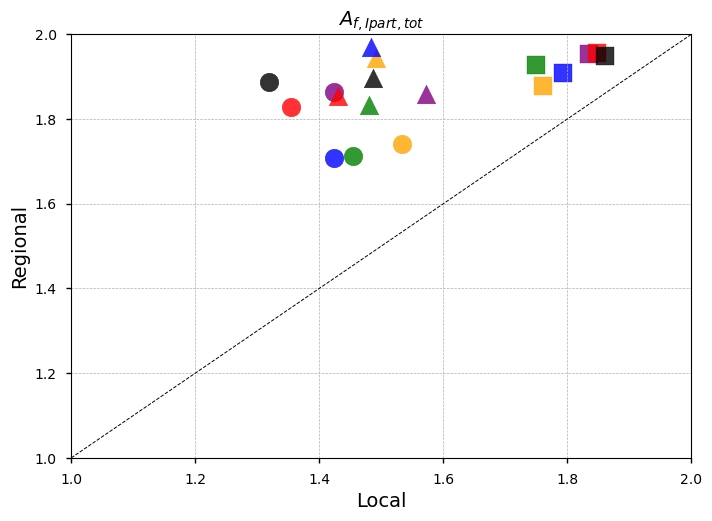

In [72]:
for i, model in enumerate(models):
    for j, site in enumerate(sites):
        plt.scatter((afmodels[i]['$A_{f,Ipart,tot}$'][site]), (afmodels[i+3]['$A_{f,Ipart,tot}$'][site+'_r']), alpha=0.8, 
                    s=180, marker=markers[i], color = colors[j] )
            

plt.xlabel("Local",fontsize= 14)
plt.ylabel("Regional",fontsize= 14)

plt.xlim(1, 2)  
plt.ylim(1, 2)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid
plt.axline((-0.3, -0.3), (0.3, 0.3), linewidth=0.7, linestyle='--', color='k')  
plt.title('$A_{f,Ipart,tot}$',fontsize= 14)
plt.show()



## Correlations/scatter plots between Ap and Af metrics



In [73]:
Af_Model_updated = Af_Model.copy()

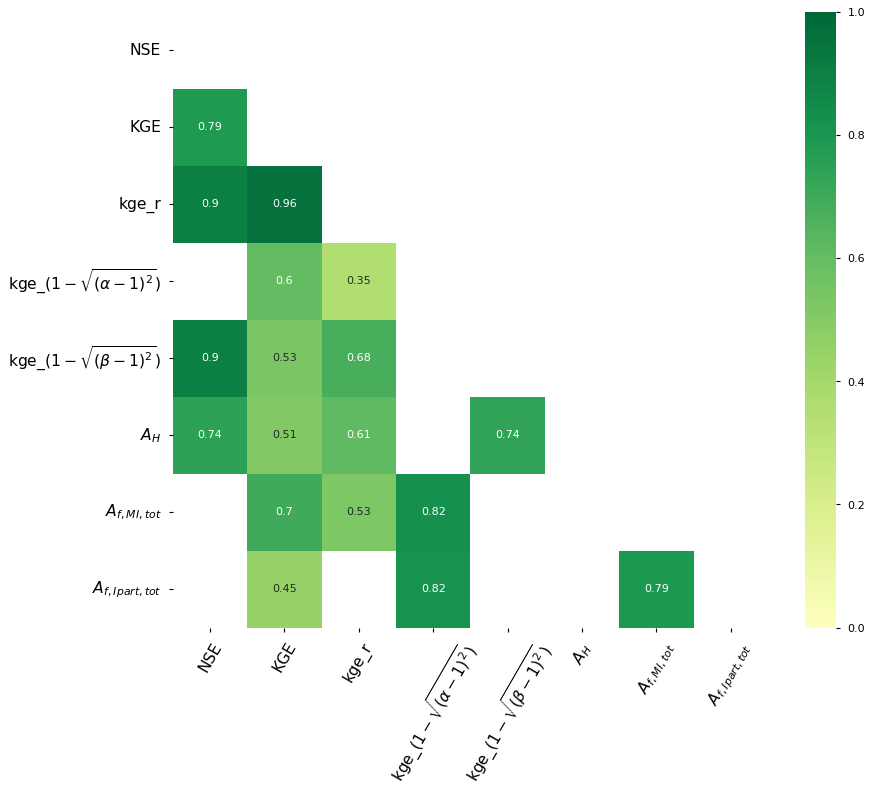

In [163]:
df1=df_new.copy()
df3= Af_Model_updated['$A_{f,Ipart,tot}$']

df1_rearranged = df1.reindex(df3.index)
Ah_rearranged= Ah.reindex(df3.index)
df2_AfMI = AfMI.reindex(df3.index)
performance = pd.concat([df1_rearranged, Ah_rearranged, df2_AfMI, df3], axis=1)

performance["$A_{H}$"] = performance["$A_{H}$"].astype(float)
Per_cor = performance.corr()

# calculate p-values
columns_performance = performance.columns
p_values_performance = pd.DataFrame(index=columns_performance, columns=columns_performance)

# calculate correlation
Per_cor= performance.corr()
Per_cor
for col1 in columns_performance:
    for col2 in columns_performance:
        if col1 == col2:
            p_values_performance.loc[col1, col2] = np.nan  # It doesn't make sense to compare a column to itself
        else:
            p_values_performance.loc[col1, col2] = pearsonr(performance[col1], performance[col2])[1]



mask_p_values = p_values_performance > 0.05
mask_upper = np.triu(np.ones_like(Per_cor, dtype=bool))
total_mask = mask_p_values | mask_upper

plt.figure(figsize=(12,10), dpi= 80)
sns.heatmap(Per_cor, mask=total_mask, xticklabels=Per_cor.columns, yticklabels=Per_cor.columns, vmin=0, vmax=1,
             cmap='RdYlGn', center=0, annot=True)

# plt.title('Correlogram of all performance metrics', fontsize=12)
plt.xticks(fontsize=14, rotation=60)
plt.yticks(fontsize=14)
plt.show()

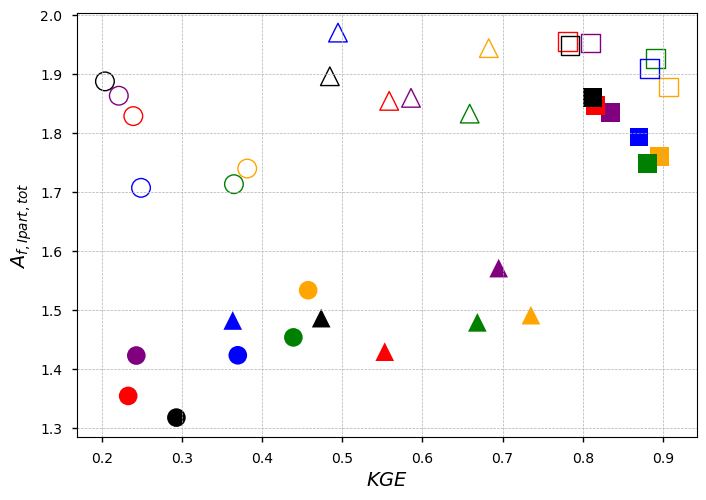

In [77]:
df= performance[['KGE', '$A_{f,Ipart,tot}$']]
# Reset index
df = df.reset_index()
# Rename the columns
df.columns = ['Site', 'Model', 'KGE', '$A_{f,Ipart,tot}$']


# Define sites, models, colors, and markers
sites = ['Ne1', 'Ne2','Ne3','Br1','Br3','GC']
colors = ['orange', 'green', 'blue', 'purple', 'red','black']  # different colors for each site
models = ['MLR', 'RF', 'LSTM']
markers = ['o', 's', '^']  # different markers for each model

# Create dictionary for easy access to colors and markers
site_color_dict = dict(zip(sites, colors))
model_marker_dict = dict(zip(models, markers))

fig, ax = plt.subplots()

# Loop through DataFrame and plot points for each model and site
for site in sites:
    for model in models:
        temp_df = df[(df['Site'] == site) & (df['Model'] == model)]
        ax.scatter(temp_df['KGE'], temp_df['$A_{f,Ipart,tot}$'], color=site_color_dict[site], marker=model_marker_dict[model], 
           facecolors=site_color_dict[site], edgecolors='none', label=f'{site}-{model}', s=180)
            
        temp_df_regional = df[(df['Site'] == site+ '_r') & (df['Model'] == model)]
        ax.scatter(temp_df_regional['KGE'], temp_df_regional['$A_{f,Ipart,tot}$'], color=site_color_dict[site], marker=model_marker_dict[model],
                   facecolors='none', edgecolors= site_color_dict[site], label=f'{site}-{model}', s=180, linewidths = 1)


# Set labels and title
ax.set_xlabel('$KGE$', fontsize=14)
ax.set_ylabel('$A_{f,Ipart,tot}$', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Grid

# Show plot
plt.show()
